# Importing Libraries

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
from sklearn.preprocessing import LabelEncoder, MinMaxScaler, StandardScaler, RobustScaler, Normalizer
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.linear_model import Ridge
from sklearn.linear_model import Lasso
from sklearn.decomposition import PCA
import warnings
warnings.filterwarnings('ignore')

C:\Users\HFCS\anaconda3\lib\site-packages\pandas\core\arrays\masked.py:60: UserWarning: Pandas requires version '1.3.6' or newer of 'bottleneck' (version '1.3.5' currently installed).

  from pandas.core import (


In [2]:
%config IPCompleter.greedy=True
from jedi import settings
settings.case_insensitive_completion = True

In [3]:
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)

In [4]:
data = pd.read_csv('train.csv')
df=data.copy()

In [5]:
print(df.shape)
df.sample(3)

(1460, 81)


,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
430,431,160,RM,21.0,1680,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,BrDale,Norm,Norm,Twnhs,2Story,6,5,1971,1971,Gable,CompShg,HdBoard,HdBoard,BrkFace,232.0,TA,TA,CBlock,TA,TA,No,ALQ,387,Unf,0,96,483,GasA,TA,Y,SBrkr,483,504,0,987,0,0,1,1,2,1,TA,4,Typ,0,NaN,Detchd,1971.0,Unf,1,264,TA,TA,Y,0,0,0,0,0,0,NaN,NaN,NaN,0,7,2008,COD,Abnorml,85400
553,554,20,RL,67.0,8777,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,Edwards,Feedr,Norm,1Fam,1Story,4,5,1949,2003,Gable,CompShg,VinylSd,VinylSd,NaN,0.0,TA,TA,CBlock,NaN,NaN,NaN,NaN,0,NaN,0,0,0,GasA,Ex,Y,SBrkr,1126,0,0,1126,0,0,2,0,2,1,Gd,5,Typ,0,NaN,Detchd,2002.0,Fin,2,520,TA,TA,N,0,96,0,0,0,0,NaN,MnPrv,NaN,0,5,2009,WD,Normal,108000
1216,1217,90,RM,68.0,8930,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,Sawyer,RRAe,Norm,Duplex,1.5Fin,6,5,1978,1978,Gable,CompShg,VinylSd,VinylSd,NaN,0.0,TA,TA,Slab,NaN,NaN,NaN,NaN,0,NaN,0,0,0,GasA,TA,Y,SBrkr,1318,584,0,1902,0,0,2,0,4,2,TA,8,Typ,0,NaN,Attchd,1978.0,Unf,2,539,TA,TA,Y,0,0,0,0,0,0,NaN,NaN,NaN,0,4,2010,WD,Normal,112000


In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>

RangeIndex: 1460 entries, 0 to 1459

Data columns (total 81 columns):

 #   Column         Non-Null Count  Dtype  

---  ------         --------------  -----  

 0   Id             1460 non-null   int64  

 1   MSSubClass     1460 non-null   int64  

 2   MSZoning       1460 non-null   object 

 3   LotFrontage    1201 non-null   float64

 4   LotArea        1460 non-null   int64  

 5   Street         1460 non-null   object 

 6   Alley          91 non-null     object 

 7   LotShape       1460 non-null   object 

 8   LandContour    1460 non-null   object 

 9   Utilities      1460 non-null   object 

 10  LotConfig      1460 non-null   object 

 11  LandSlope      1460 non-null   object 

 12  Neighborhood   1460 non-null   object 

 13  Condition1     1460 non-null   object 

 14  Condition2     1460 non-null   object 

 15  BldgType       1460 non-null   object 

 16  HouseStyle     1460 non-null   object 

 17  OverallQual    1460 non-null  

In [7]:
df.describe()

,Id,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
count,1460.000000,1460.000000,1201.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1452.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1379.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000
mean,730.500000,56.897260,70.049958,10516.828082,6.099315,5.575342,1971.267808,1984.865753,103.685262,443.639726,46.549315,567.240411,1057.429452,1162.626712,346.992466,5.844521,1515.463699,0.425342,0.057534,1.565068,0.382877,2.866438,1.046575,6.517808,0.613014,1978.506164,1.767123,472.980137,94.244521,46.660274,21.954110,3.409589,15.060959,2.758904,43.489041,6.321918,2007.815753,180921.195890
std,421.610009,42.300571,24.284752,9981.264932,1.382997,1.112799,30.202904,20.645407,181.066207,456.098091,161.319273,441.866955,438.705324,386.587738,436.528436,48.623081,525.480383,0.518911,0.238753,0.550916,0.502885,0.815778,0.220338,1.625393,0.644666,24.689725,0.747315,213.804841,125.338794,66.256028,61.119149,29.317331,55.757415,40.177307,496.123024,2.703626,1.328095,79442.502883
min,1.000000,20.000000,21.000000,1300.000000,1.000000,1.000000,1872.000000,1950.000000,0.000000,0.000000,0.000000,0.000000,0.000000,334.000000,0.000000,0.000000,334.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.000000,0.000000,1900.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,2006.000000,34900.000000
25%,365.750000,20.000000,59.000000,7553.500000,5.000000,5.000000,1954.000000,1967.000000,0.000000,0.000000,0.000000,223.000000,795.750000,882.000000,0.000000,0.000000,1129.500000,0.000000,0.000000,1.000000,0.000000,2.000000,1.000000,5.000000,0.000000,1961.000000,1.000000,334.500000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,5.000000,2007.000000,129975.000000
50%,730.500000,50.000000,69.000000,9478.500000,6.000000,5.000000,1973.000000,1994.000000,0.000000,383.500000,0.000000,477.500000,991.500000,1087.000000,0.000000,0.000000,1464.000000,0.000000,0.000000,2.000000,0.000000,3.000000,1.000000,6.000000,1.000000,1980.000000,2.000000,480.000000,0.000000,25.000000,0.000000,0.000000,0.000000,0.000000,0.000000,6.000000,2008.000000,163000.000000
75%,1095.250000,70.000000,80.000000,11601.500000,7.000000,6.000000,2000.000000,2004.000000,166.000000,712.250000,0.000000,808.000000,1298.250000,1391.250000,728.000000,0.000000,1776.750000,1.000000,0.000000,2.000000,1.000000,3.000000,1.000000,7.000000,1.000000,2002.000000,2.000000,576.000000,168.000000,68.000000,0.000000,0.000000,0.000000,0.000000,0.000000,8.000000,2009.000000,214000.000000
max,1460.000000,190.000000,313.000000,215245.000000,10.000000,9.000000,2010.000000,2010.000000,1600.000000,5644.000000,1474.000000,2336.000000,6110.000000,4692.000000,2065.000000,572.000000,5642.000000,3.000000,2.000000,3.000000,2.000000,8.000000,3.000000,14.000000,3.000000,2010.000000,4.000000,1418.000000,857.000000,547.000000,552.000000,508.000000,480.000000,738.000000,15500.000000,12.000000,2010.000000,755000.000000


## Handling Missing Values

In [8]:
df.duplicated().sum()

0

No duplicated rows

In [9]:
nulls_cnt = (df.isnull().sum()/len(df))*100
nulls = pd.DataFrame(nulls_cnt, columns=['Null percentage'])
nulls = nulls[nulls['Null percentage']>0]
nulls = nulls.sort_values(by='Null percentage', ascending=False)
display(nulls)

,Null percentage
PoolQC,99.520548
MiscFeature,96.301370
Alley,93.767123
Fence,80.753425
MasVnrType,59.726027
FireplaceQu,47.260274
LotFrontage,17.739726
GarageType,5.547945
GarageYrBlt,5.547945
GarageFinish,5.547945


From file description, fill null values in these columns with the value 'No'

In [10]:
df['Alley'].fillna('No_Alley', inplace=True)
df['BsmtQual'].fillna('No_Basement', inplace=True)
df['BsmtCond'].fillna('No_Basement', inplace=True)
df['BsmtExposure'].fillna('No_Basement', inplace=True)
df['BsmtFinType1'].fillna('No_Basement', inplace=True)
df['BsmtFinType2'].fillna('No_Basement', inplace=True)
df['FireplaceQu'].fillna('No_Fireplace', inplace=True)
df['GarageType'].fillna('No_Garage', inplace=True)
df['GarageFinish'].fillna('No_Garage', inplace=True)
df['GarageQual'].fillna('No_Garage', inplace=True)
df['GarageCond'].fillna('No_Garage', inplace=True)
df['PoolQC'].fillna('No_Pool', inplace=True)
df['Fence'].fillna('No_Fence', inplace=True)
df['MiscFeature'].fillna('No_MiscFeatures', inplace=True)
df['MasVnrType'].fillna('No_Veneer', inplace=True)

In [11]:
nulls_cnt = (df.isnull().sum()/len(df))*100
nulls = pd.DataFrame(nulls_cnt, columns=['Null percentage'])
nulls = nulls[nulls['Null percentage']>0]
nulls = nulls.sort_values(by='Null percentage', ascending=False)
display(nulls)

,Null percentage
LotFrontage,17.739726
GarageYrBlt,5.547945
MasVnrArea,0.547945
Electrical,0.068493


 Fill numerical columns with KNNImputer, and categorical columns with mode

In [12]:
from sklearn.impute import KNNImputer
numerical_cols = df.select_dtypes(include=['number']).columns 
df_numeric = df[numerical_cols]
imputer = KNNImputer(n_neighbors=3)
df_imputed = pd.DataFrame(imputer.fit_transform(df_numeric), columns=numerical_cols)
df[numerical_cols] = df_imputed
df['Electrical'].fillna(df['Electrical'].mode()[0], inplace=True)

In [13]:
nulls_cnt = (df.isnull().sum()/len(df))*100
nulls = pd.DataFrame(nulls_cnt, columns=['Null percentage'])
nulls = nulls[nulls['Null percentage']>0]
nulls = nulls.sort_values(by='Null percentage', ascending=False)
display(nulls)

,Null percentage


Here there is no missing values ..

# Data Analysis

In [14]:
df.columns

Index(['Id', 'MSSubClass', 'MSZoning', 'LotFrontage', 'LotArea', 'Street',
       'Alley', 'LotShape', 'LandContour', 'Utilities', 'LotConfig',
       'LandSlope', 'Neighborhood', 'Condition1', 'Condition2', 'BldgType',
       'HouseStyle', 'OverallQual', 'OverallCond', 'YearBuilt', 'YearRemodAdd',
       'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType',
       'MasVnrArea', 'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual',
       'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinSF1',
       'BsmtFinType2', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', 'Heating',
       'HeatingQC', 'CentralAir', 'Electrical', '1stFlrSF', '2ndFlrSF',
       'LowQualFinSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath',
       'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'KitchenQual',
       'TotRmsAbvGrd', 'Functional', 'Fireplaces', 'FireplaceQu', 'GarageType',
       'GarageYrBlt', 'GarageFinish', 'GarageCars', 'GarageArea', 'GarageQual',
       'GarageCond', 'PavedDrive

##### use meaningful neams for our features 

In [15]:
df.rename(columns={
    'MSSubClass': 'DwellingTypeCode',
    'MSZoning': 'ZoningClassification',
    'LotFrontage': 'StreetFrontageFt',
    'LotArea': 'LotSizeSqFt',
    'Alley': 'AlleyAccessType',
    'LotShape': 'PropertyShape',
    'LandContour': 'LandFlatness',
    'LotConfig': 'LotConfiguration',
    'LandSlope': 'LandSlopeDegree',
    'Neighborhood': 'NeighborhoodName',
    'Condition1': 'ProximityToCondition',
    'BldgType': 'BuildingType',
    'HouseStyle': 'HouseStyleType',
    'OverallQual': 'OverallQuality',
    'OverallCond': 'OverallCondition',
    'YearBuilt': 'YearConstructed',
    'RoofStyle': 'RoofDesign',
    'Exterior1st': 'ExteriorMaterial1',
    'Exterior2nd': 'ExteriorMaterial2',
    'MasVnrType': 'MasonryVeneerType',
    'MasVnrArea': 'MasonryVeneerArea',
    'ExterQual': 'ExteriorQuality',
    'ExterCond': 'ExteriorCondition',
    'Foundation': 'FoundationType',
    'BsmtQual': 'BasementQuality',
    'BsmtCond': 'BasementCondition',
    'BsmtExposure': 'BasementExposureType',
    'BsmtFinType1': 'BasementFinishType1',
    'BsmtFinType2': 'BasementFinishType2',
    'HeatingQC': 'HeatingQualityCondition',
    'Electrical': 'ElectricalSystem',
    'GrLivArea': 'AboveGradeLivingAreaSqFt',
    'BedroomAbvGr': 'BedroomsAboveGrade',
    'KitchenQual': 'KitchenQuality',
    'TotRmsAbvGrd': 'TotalRoomsAboveGrade',
    'FireplaceQu': 'FireplaceQuality',
    'GarageFinish': 'GarageFinishType',
    'GarageCars': 'GarageCapacity',
    'GarageCond': 'GarageCondition',
    'PavedDrive': 'PavedDrivewayType',
    'Fence': 'FenceQuality',
    'MoSold': 'MonthSold',
    'TotalSF': 'TotalSquareFootage',
    'PorchTotalArea': 'PorchAreaSqFt',
    'TotalBathrooms': 'TotalBathrooms',
    'SinceRemodel': 'YearsSinceRemodel',
    'BasmentTotalArea': 'BasementTotalAreaSqFt'
}, inplace=True)

Columns after rename :

### ***Final Meta Data***

| Column Name             | Description                                             |
|--------------------------|---------------------------------------------------------|
| `DwellingTypeCode`       | Numeric code identifying the type of dwelling.        |
| `ZoningClassification`  | General zoning classification of the sale.            |
| `StreetFrontageFt`       | Linear feet of street connected to the property.       |
| `LotSizeSqFt`            | Size of the lot in square feet.                        |
| `AlleyAccessType`        | Type of alley access (e.g., gravel, paved, etc.).       |
| `PropertyShape`          | General shape of the property.                         |
| `LandFlatness`           | Flatness of the property.                              |
| `LotConfiguration`       | Configuration of the lot.                             |
| `LandSlopeDegree`        | Degree of slope of the property.                       |
| `NeighborhoodName`       | Physical locations within the town.                    |
| `ProximityToCondition`   | Proximity to various conditions (e.g., railroads, highways). |
| `BuildingType`           | Type of dwelling involved in the sale.                 |
| `HouseStyleType`         | Style of dwelling (e.g., one-story, two-story).         |
| `OverallQuality`         | Overall material and finish quality.                   |
| `OverallCondition`       | Overall condition rating.                              |
| `YearConstructed`        | Original construction year.                            |
| `RoofDesign`             | Type of roof design.                                   |
| `ExteriorMaterial1`      | Exterior covering on house (primary).                  |
| `ExteriorMaterial2`      | Exterior covering on house (secondary).                |
| `MasonryVeneerType`      | Type of masonry veneer (if any).                       |
| `MasonryVeneerArea`      | Area of masonry veneer in square feet.                 |
| `ExteriorQuality`        | Quality of the material on the exterior.               |
| `ExteriorCondition`      | Present condition of the material on the exterior.     |
| `FoundationType`         | Type of foundation.                                    |
| `BasementQuality`        | Height of the basement.                                |
| `BasementCondition`      | General condition of the basement.                     |
| `BasementExposureType`   | Walkout or garden level basement walls.                |
| `BasementFinishType1`    | Quality of basement finished area (primary).           |
| `BasementFinishType2`    | Quality of basement finished area (secondary).         |
| `HeatingQualityCondition`| Heating quality and condition.                         |
| `ElectricalSystem`       | Electrical system.                                     |
| `AboveGradeLivingAreaSqFt`| Above grade (ground) living area square feet.         |
| `BedroomsAboveGrade`     | Number of bedrooms above basement level.               |
| `KitchenQuality`         | Kitchen quality.                                       |
| `TotalRoomsAboveGrade`   | Total number of rooms above grade (excluding bathrooms).|
| `Fireplaces`             | Number of fireplaces.                                  |
| `FireplaceQuality`       | Fireplace quality.                                     |
| `GarageType`             | Garage location.                                       |
| `GarageFinishType`       | Interior finish of the garage.                         |
| `GarageCapacity`         | Size of garage in car capacity.                        |
| `GarageArea`             | Size of garage in square feet.                         |
| `GarageCondition`        | Condition of the garage.                               |
| `PavedDrivewayType`      | Type of paved driveway.                                |
| `FenceQuality`           | Quality of fence.                                      |
| `MonthSold`              | Month the property was sold.                           |
| `SaleType`               | Type of sale.                                          |
| `SaleCondition`          | Condition of sale.                                     |
| `SalePrice`              | Sale price of the property in USD.                     |
| `TotalSquareFootage`     | Total square footage of the property.                  |
| `PorchAreaSqFt`          | Total porch area in square feet.                       |
| `TotalBathrooms`         | Total number of bathrooms in the house.                |
| `YearsSinceRemodel`      | Years since the house was last remodeled.              |
| `BasementTotalAreaSqFt`  | Total area of the basement in square feet.             |


In [16]:
numerical_cols = df.select_dtypes(include='number').columns
categorical_cols = df.select_dtypes(exclude='number').columns

In [17]:
numerical_cols

Index(['Id', 'DwellingTypeCode', 'StreetFrontageFt', 'LotSizeSqFt',
       'OverallQuality', 'OverallCondition', 'YearConstructed', 'YearRemodAdd',
       'MasonryVeneerArea', 'BsmtFinSF1', 'BsmtFinSF2', 'BsmtUnfSF',
       'TotalBsmtSF', '1stFlrSF', '2ndFlrSF', 'LowQualFinSF',
       'AboveGradeLivingAreaSqFt', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath',
       'HalfBath', 'BedroomsAboveGrade', 'KitchenAbvGr',
       'TotalRoomsAboveGrade', 'Fireplaces', 'GarageYrBlt', 'GarageCapacity',
       'GarageArea', 'WoodDeckSF', 'OpenPorchSF', 'EnclosedPorch', '3SsnPorch',
       'ScreenPorch', 'PoolArea', 'MiscVal', 'MonthSold', 'YrSold',
       'SalePrice'],
      dtype='object')

In [18]:
categorical_cols

Index(['ZoningClassification', 'Street', 'AlleyAccessType', 'PropertyShape',
       'LandFlatness', 'Utilities', 'LotConfiguration', 'LandSlopeDegree',
       'NeighborhoodName', 'ProximityToCondition', 'Condition2',
       'BuildingType', 'HouseStyleType', 'RoofDesign', 'RoofMatl',
       'ExteriorMaterial1', 'ExteriorMaterial2', 'MasonryVeneerType',
       'ExteriorQuality', 'ExteriorCondition', 'FoundationType',
       'BasementQuality', 'BasementCondition', 'BasementExposureType',
       'BasementFinishType1', 'BasementFinishType2', 'Heating',
       'HeatingQualityCondition', 'CentralAir', 'ElectricalSystem',
       'KitchenQuality', 'Functional', 'FireplaceQuality', 'GarageType',
       'GarageFinishType', 'GarageQual', 'GarageCondition',
       'PavedDrivewayType', 'PoolQC', 'FenceQuality', 'MiscFeature',
       'SaleType', 'SaleCondition'],
      dtype='object')

In [19]:
df.sample(5)

,Id,DwellingTypeCode,ZoningClassification,StreetFrontageFt,LotSizeSqFt,Street,AlleyAccessType,PropertyShape,LandFlatness,Utilities,LotConfiguration,LandSlopeDegree,NeighborhoodName,ProximityToCondition,Condition2,BuildingType,HouseStyleType,OverallQuality,OverallCondition,YearConstructed,YearRemodAdd,RoofDesign,RoofMatl,ExteriorMaterial1,ExteriorMaterial2,MasonryVeneerType,MasonryVeneerArea,ExteriorQuality,ExteriorCondition,FoundationType,BasementQuality,BasementCondition,BasementExposureType,BasementFinishType1,BsmtFinSF1,BasementFinishType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQualityCondition,CentralAir,ElectricalSystem,1stFlrSF,2ndFlrSF,LowQualFinSF,AboveGradeLivingAreaSqFt,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomsAboveGrade,KitchenAbvGr,KitchenQuality,TotalRoomsAboveGrade,Functional,Fireplaces,FireplaceQuality,GarageType,GarageYrBlt,GarageFinishType,GarageCapacity,GarageArea,GarageQual,GarageCondition,PavedDrivewayType,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,FenceQuality,MiscFeature,MiscVal,MonthSold,YrSold,SaleType,SaleCondition,SalePrice
249,250.0,50.0,RL,95.666667,159000.0,Pave,No_Alley,IR2,Low,AllPub,CulDSac,Sev,ClearCr,Norm,Norm,1Fam,1.5Fin,6.0,7.0,1958.0,2006.0,Gable,CompShg,Wd Sdng,HdBoard,BrkCmn,472.0,Gd,TA,CBlock,Gd,TA,Gd,Rec,697.0,Unf,0.0,747.0,1444.0,GasA,Gd,Y,SBrkr,1444.0,700.0,0.0,2144.0,0.0,1.0,2.0,0.0,4.0,1.0,Gd,7.0,Typ,2.0,TA,Attchd,1958.000000,Fin,2.0,389.0,TA,TA,Y,0.0,98.0,0.0,0.0,0.0,0.0,No_Pool,No_Fence,Shed,500.0,6.0,2007.0,WD,Normal,277000.0
250,251.0,30.0,RL,55.000000,5350.0,Pave,No_Alley,IR1,Lvl,AllPub,Inside,Gtl,BrkSide,Norm,Norm,1Fam,1Story,3.0,2.0,1940.0,1966.0,Gable,CompShg,Wd Sdng,Plywood,No_Veneer,0.0,TA,Po,CBlock,TA,TA,No,Unf,0.0,Unf,0.0,728.0,728.0,GasA,Ex,Y,SBrkr,1306.0,0.0,0.0,1306.0,0.0,0.0,1.0,0.0,3.0,1.0,Fa,6.0,Mod,0.0,No_Fireplace,No_Garage,1941.666667,No_Garage,0.0,0.0,No_Garage,No_Garage,Y,263.0,0.0,0.0,0.0,0.0,0.0,No_Pool,GdWo,Shed,450.0,5.0,2010.0,WD,Normal,76500.0
9,10.0,190.0,RL,50.000000,7420.0,Pave,No_Alley,Reg,Lvl,AllPub,Corner,Gtl,BrkSide,Artery,Artery,2fmCon,1.5Unf,5.0,6.0,1939.0,1950.0,Gable,CompShg,MetalSd,MetalSd,No_Veneer,0.0,TA,TA,BrkTil,TA,TA,No,GLQ,851.0,Unf,0.0,140.0,991.0,GasA,Ex,Y,SBrkr,1077.0,0.0,0.0,1077.0,1.0,0.0,1.0,0.0,2.0,2.0,TA,5.0,Typ,2.0,TA,Attchd,1939.000000,RFn,1.0,205.0,Gd,TA,Y,0.0,4.0,0.0,0.0,0.0,0.0,No_Pool,No_Fence,No_MiscFeatures,0.0,1.0,2008.0,WD,Normal,118000.0
371,372.0,50.0,RL,80.000000,17120.0,Pave,No_Alley,Reg,Lvl,AllPub,Inside,Gtl,ClearCr,Feedr,Norm,1Fam,1.5Fin,4.0,4.0,1959.0,1959.0,Gable,CompShg,WdShing,Plywood,No_Veneer,0.0,TA,TA,CBlock,No_Basement,No_Basement,No_Basement,No_Basement,0.0,No_Basement,0.0,0.0,0.0,GasA,TA,Y,SBrkr,1120.0,468.0,0.0,1588.0,0.0,0.0,2.0,0.0,4.0,1.0,TA,7.0,Min2,1.0,Gd,Detchd,1991.000000,Fin,2.0,680.0,TA,TA,N,0.0,59.0,0.0,0.0,0.0,0.0,No_Pool,No_Fence,No_MiscFeatures,0.0,7.0,2008.0,WD,Normal,134432.0
1108,1109.0,60.0,RL,67.000000,8063.0,Pave,No_Alley,Reg,Lvl,AllPub,Inside,Gtl,Gilbert,Norm,Norm,1Fam,2Story,6.0,5.0,2000.0,2000.0,Gable,CompShg,VinylSd,VinylSd,No_Veneer,0.0,TA,TA,PConc,Gd,TA,No,Unf,0.0,Unf,0.0,924.0,924.0,GasA,Ex,Y,SBrkr,948.0,742.0,0.0,1690.0,0.0,0.0,2.0,1.0,3.0,1.0,TA,7.0,Typ,1.0,TA,Attchd,2000.000000,RFn,2.0,463.0,TA,TA,Y,100.0,48.0,0.0,0.0,0.0,0.0,No_Pool,No_Fence,No_MiscFeatures,0.0,11.0,2007.0,WD,Abnorml,181000.0


### Distribution of House Prices

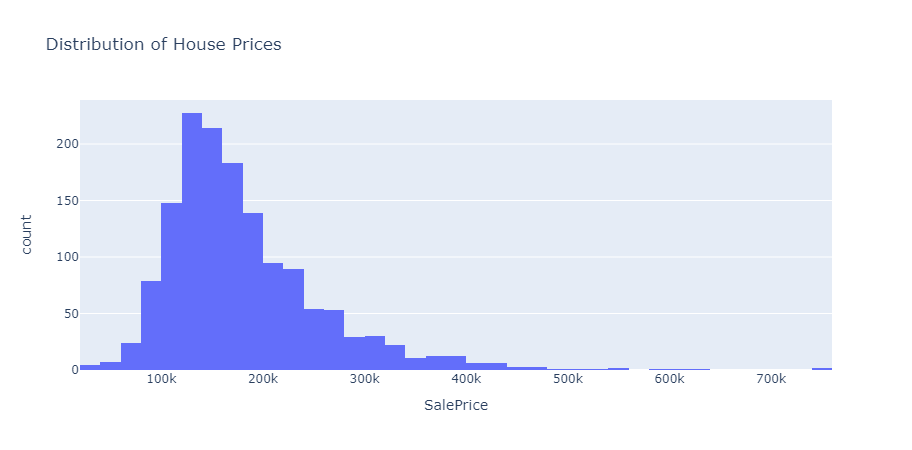

In [20]:
fig = px.histogram(df, x='SalePrice', nbins=50, title='Distribution of House Prices')
fig.show()

### Impact of Overall Quality on Price

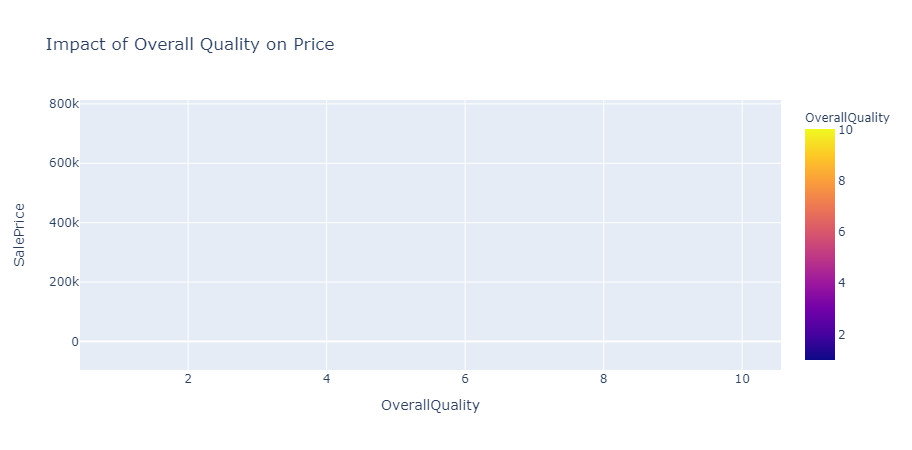

In [21]:
fig = px.scatter(df, x='OverallQuality', y='SalePrice', title='Impact of Overall Quality on Price', 
                 color='OverallQuality', trendline='ols')
fig.show()

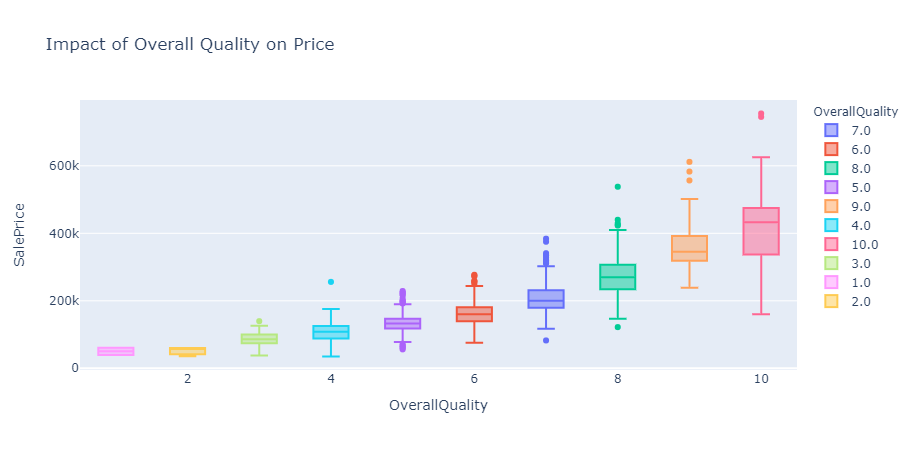

In [22]:
fig = px.box(df, x='OverallQuality', y='SalePrice', title='Impact of Overall Quality on Price', 
                 color='OverallQuality')
fig.show()

### Year Constructed vs. Sale Price

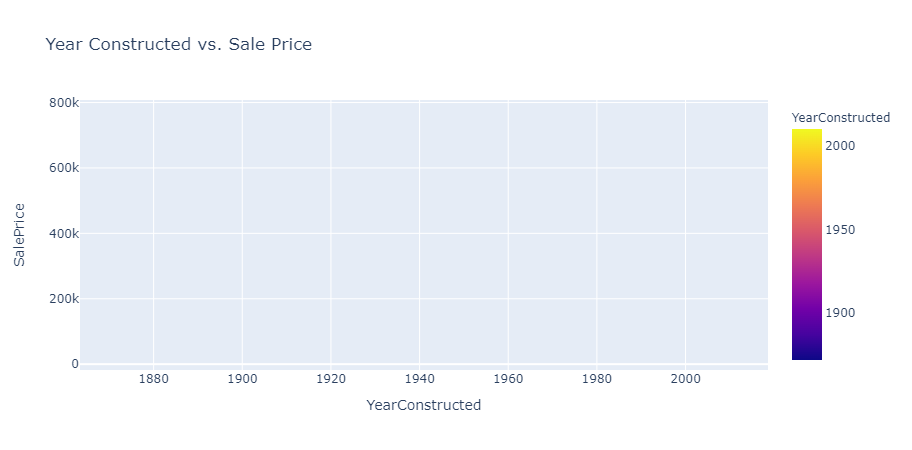

In [23]:
fig = px.scatter(df, x='YearConstructed', y='SalePrice', title='Year Constructed vs. Sale Price', 
                 color='YearConstructed', trendline='ols')
fig.show()

### Average Sale Price by Neighborhood

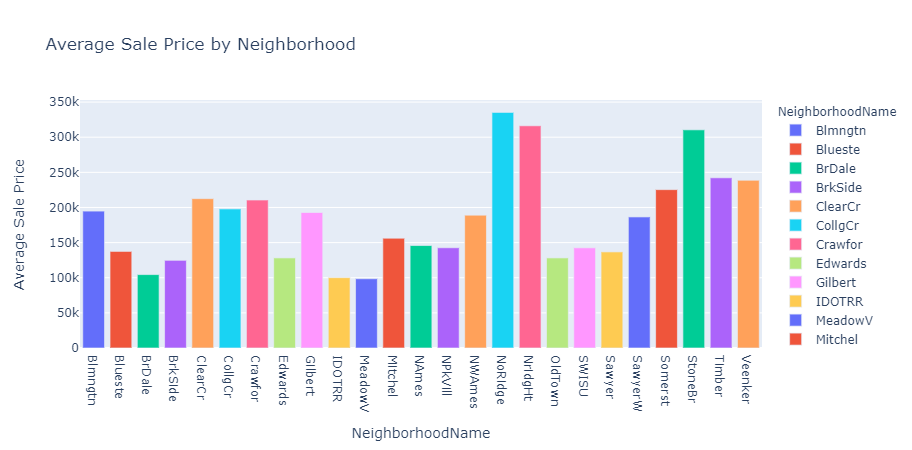

In [24]:
neighborhood_group = df.groupby('NeighborhoodName')['SalePrice'].mean().reset_index()
fig = px.bar(neighborhood_group, x='NeighborhoodName', y='SalePrice',
             title='Average Sale Price by Neighborhood',
             labels={'SalePrice': 'Average Sale Price'},
             color='NeighborhoodName')
fig.show()

Northridge, Northridge Heights, Stone Brook are the most expensive neighborhoods.
Meadow Village is the cheapest one.

### Average Overall Quality by Neighborhood

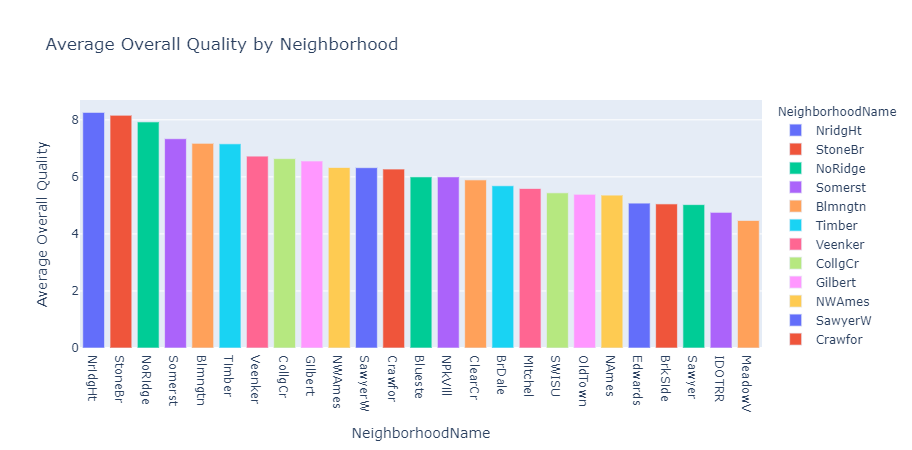

In [25]:
neighborhood_group = df.groupby('NeighborhoodName')['OverallQuality'].mean().reset_index()
neighborhood_group_sorted = neighborhood_group.sort_values(by='OverallQuality', ascending=False)
fig = px.bar(neighborhood_group_sorted, x='NeighborhoodName', y='OverallQuality',
             title='Average Overall Quality by Neighborhood',
             labels={'OverallQuality': 'Average Overall Quality'},
             color='NeighborhoodName',
             color_discrete_sequence=px.colors.qualitative.Plotly)  
fig.show()

### Range of Sale Prices by Neighborhood

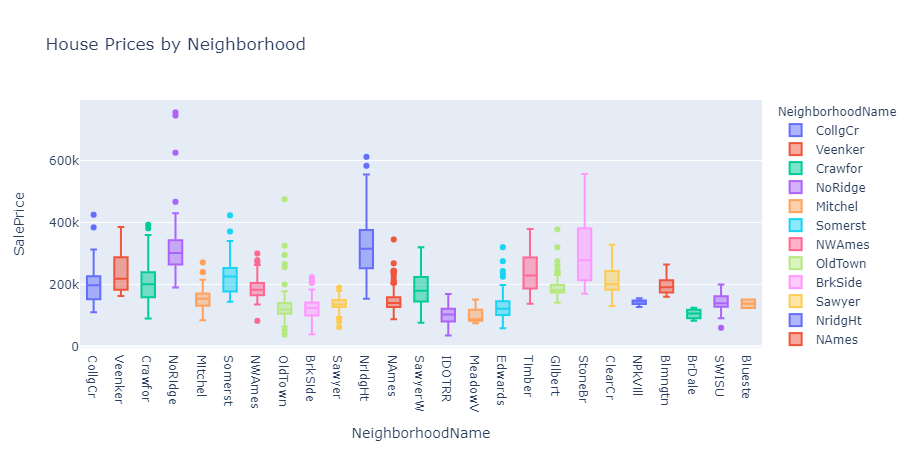

In [26]:
fig = px.box(df, x='NeighborhoodName', y='SalePrice', title='House Prices by Neighborhood', 
             color='NeighborhoodName')
fig.show()

Neighborhood with the lowest maximum sale price:


NeighborhoodName      BrDale
MinSalePrice         83000.0
MaxSalePrice        125000.0
Name: 2, dtype: object



Neighborhood with the highest maximum sale price:


NeighborhoodName     NoRidge
MinSalePrice        190000.0
MaxSalePrice        755000.0
Name: 15, dtype: object

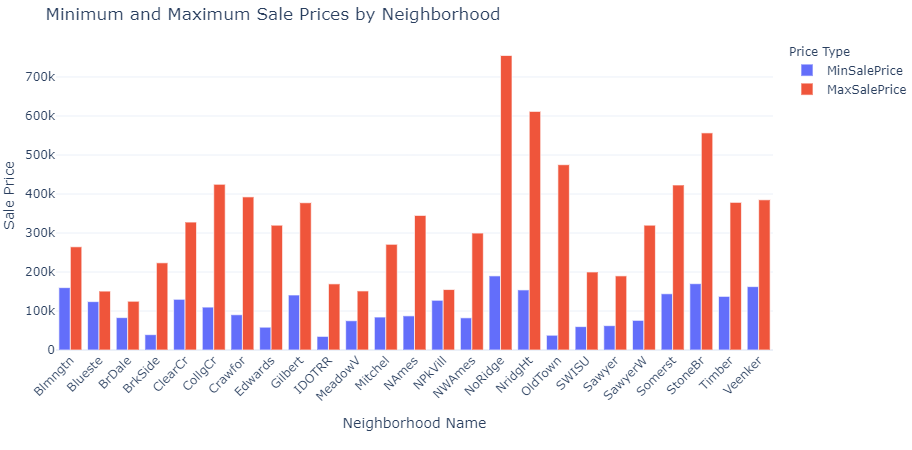

In [27]:
neighborhood_price_stats = df.groupby('NeighborhoodName').agg({
    'SalePrice': ['min', 'max']
}).reset_index()
neighborhood_price_stats.columns = ['NeighborhoodName', 'MinSalePrice', 'MaxSalePrice']
lowest_price_neighborhood = neighborhood_price_stats.loc[neighborhood_price_stats['MaxSalePrice'].idxmin()]
highest_price_neighborhood = neighborhood_price_stats.loc[neighborhood_price_stats['MaxSalePrice'].idxmax()]

print("Neighborhood with the lowest maximum sale price:")
display(lowest_price_neighborhood)

print("\nNeighborhood with the highest maximum sale price:")
display(highest_price_neighborhood)

fig = px.bar(neighborhood_price_stats, 
             x='NeighborhoodName', 
             y=['MinSalePrice', 'MaxSalePrice'],
             title='Minimum and Maximum Sale Prices by Neighborhood',
             labels={'value': 'Sale Price', 'variable': 'Price Type'},
             barmode='group',
             template='plotly_white')

fig.update_layout(xaxis_title='Neighborhood Name',
                  yaxis_title='Sale Price',
                  xaxis_tickangle=-45,
                  margin=dict(l=0, r=0, t=40, b=100))

fig.show()

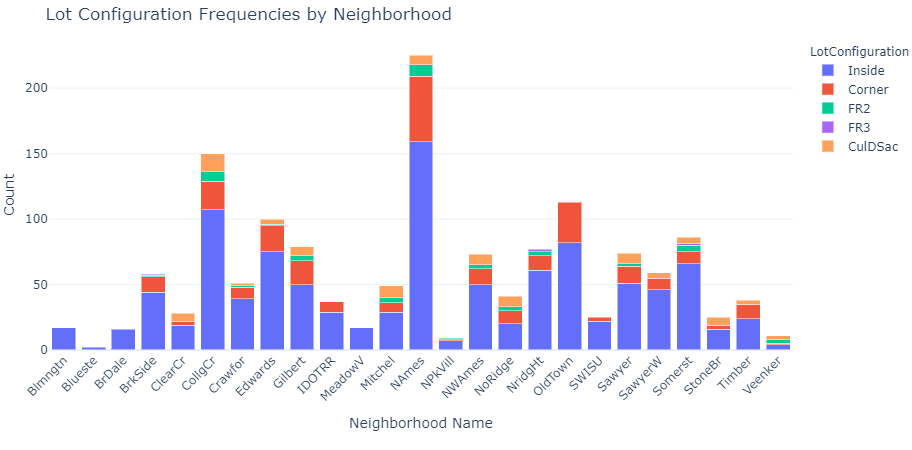

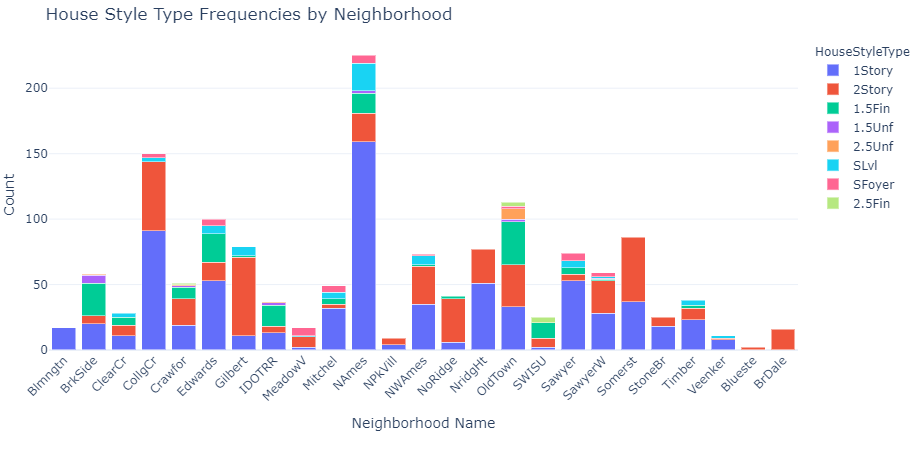

In [28]:
# Calculate the frequency of each LotConfiguration per NeighborhoodName
lot_config_freq = df.groupby(['NeighborhoodName', 'LotConfiguration']).size().reset_index(name='Count')

# Calculate the frequency of each HouseStyleType per NeighborhoodName
house_style_freq = df.groupby(['NeighborhoodName', 'HouseStyleType']).size().reset_index(name='Count')

# Plot Lot Configuration frequencies for each neighborhood
fig_lot_config = px.bar(lot_config_freq, 
                        x='NeighborhoodName', 
                        y='Count', 
                        color='LotConfiguration', 
                        title='Lot Configuration Frequencies by Neighborhood',
                        labels={'Count': 'Count'},
                        template='plotly_white',
                        barmode='stack')

fig_lot_config.update_layout(xaxis_title='Neighborhood Name',
                             yaxis_title='Count',
                             xaxis_tickangle=-45,
                             margin=dict(l=0, r=0, t=40, b=100))

fig_lot_config.show()

# Plot House Style Type frequencies for each neighborhood
fig_house_style = px.bar(house_style_freq, 
                         x='NeighborhoodName', 
                         y='Count', 
                         color='HouseStyleType', 
                         title='House Style Type Frequencies by Neighborhood',
                         labels={'Count': 'Count'},
                         template='plotly_white',
                         barmode='stack')

fig_house_style.update_layout(xaxis_title='Neighborhood Name',
                              yaxis_title='Count',
                              xaxis_tickangle=-45,
                              margin=dict(l=0, r=0, t=40, b=100))

fig_house_style.show()


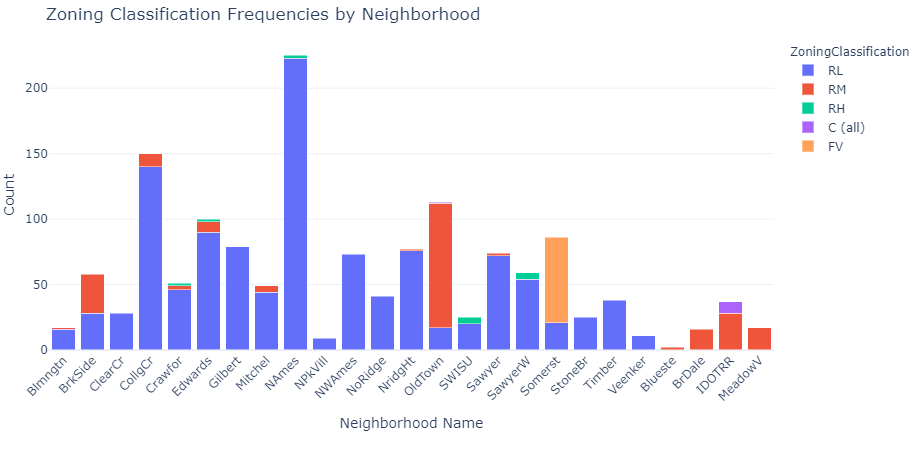

In [29]:
zoning_freq = df.groupby(['NeighborhoodName', 'ZoningClassification']).size().reset_index(name='Count')
fig_zoning = px.bar(zoning_freq, 
                    x='NeighborhoodName', 
                    y='Count', 
                    color='ZoningClassification', 
                    title='Zoning Classification Frequencies by Neighborhood',
                    labels={'Count': 'Count'},
                    template='plotly_white',
                    barmode='stack')

fig_zoning.update_layout(xaxis_title='Neighborhood Name',
                         yaxis_title='Count',
                         xaxis_tickangle=-45,
                         margin=dict(l=0, r=0, t=40, b=100))

fig_zoning.show()

### Popularity of House Styles

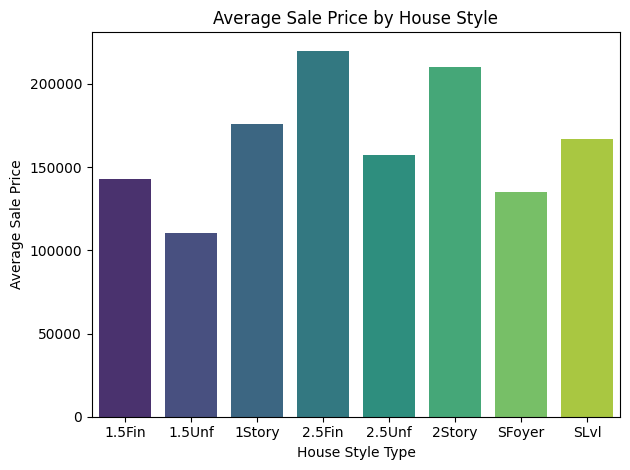

In [30]:
style_price_avg = df.groupby('HouseStyleType')['SalePrice'].mean().reset_index()
sns.barplot(x='HouseStyleType', y='SalePrice', data=style_price_avg, palette='viridis')
plt.title('Average Sale Price by House Style')
plt.xlabel('House Style Type')
plt.ylabel('Average Sale Price')
plt.tight_layout()
plt.show()

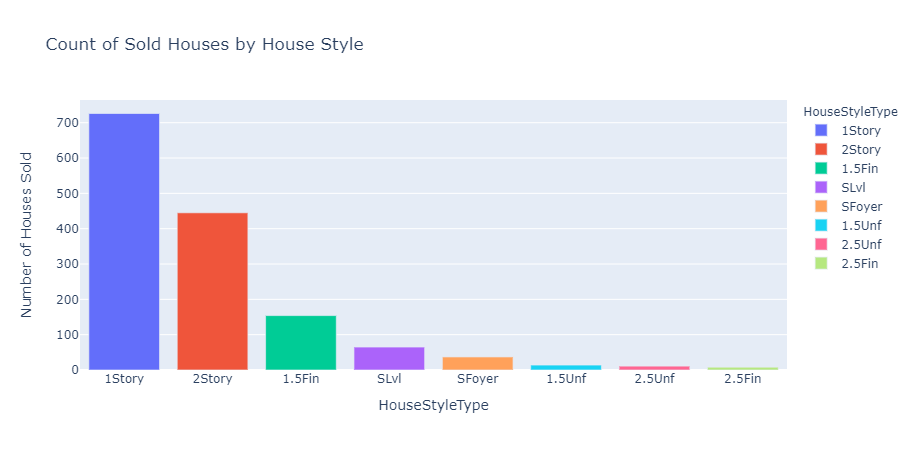

In [31]:
style_counts = df['HouseStyleType'].value_counts().reset_index()
style_counts.columns = ['HouseStyleType', 'Count']
fig = px.bar(style_counts, x='HouseStyleType', y='Count',
             title='Count of Sold Houses by House Style',
             labels={'Count': 'Number of Houses Sold'},
             color='HouseStyleType')
fig.show()

### Average Sale Price by Lot Configuration

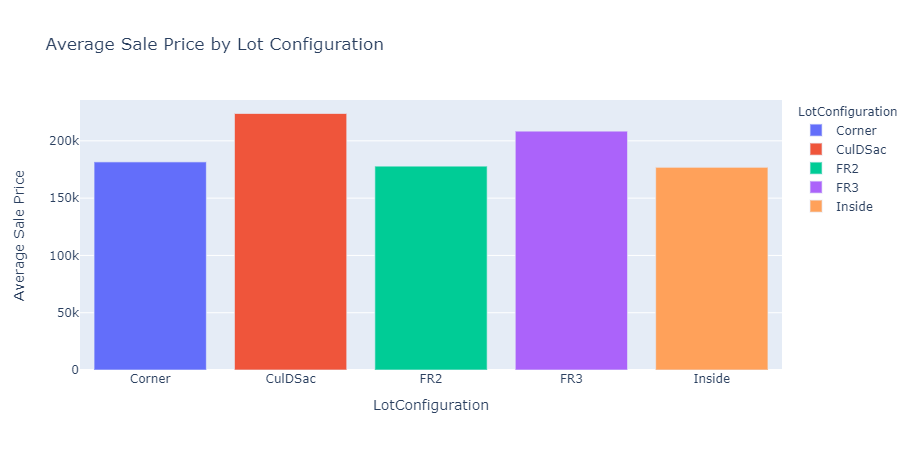

In [32]:
lot_group = df.groupby('LotConfiguration')['SalePrice'].mean().reset_index()
fig = px.bar(lot_group, x='LotConfiguration', y='SalePrice',
             title='Average Sale Price by Lot Configuration',
             labels={'SalePrice': 'Average Sale Price'},
             color='LotConfiguration')
fig.show()

***Lot Configuration Types Explained***

**Inside** (Inside Lot)
Description: A property that is surrounded by other lots on all sides, with no direct exposure to the street or exterior boundaries.
Implication: Often located in the middle of a block or development, which can result in less exposure to street noise and potentially more privacy. Inside lots might have fewer premium features compared to corner or cul-de-sac lots.

**Corner** (Corner Lot)
Description: A property located at the intersection of two streets, typically with frontages on both streets.
Implication: Corner lots often have increased visibility and access, which can enhance property value. They may offer more light and potentially larger yards, but can also have higher exposure to street traffic and noise.

**CulDSac** (Cul-de-Sac)
Description: A property situated at the end of a street with a circular turnaround, meaning there is no through traffic.
Implication: Cul-de-sac lots generally offer increased privacy and reduced traffic. They are often sought after for their quieter, safer environment, making them popular for families with young children.

**FR2** (Frontage on 2 Sides of Property)
Description: A property with street frontage on two sides, which can include a corner lot or a lot with two streets running along its boundaries.
Implication: Provides more visibility and access to the property, which can enhance its appeal and value. The increased exposure may allow for better street access and potential for additional entryways.

**FR3** (Frontage on 3 Sides of Property)
Description: A property with street frontage on three sides, offering significant exposure to streets and potentially other properties.
Implication: This type of lot is relatively rare and can command a premium due to its high visibility and access. It may offer enhanced views and accessibility but could also experience higher traffic levels.

***Summary***
These lot configurations impact property values and desirability in various ways. Factors like privacy, accessibility, and exposure to traffic can all influence how these lot types are valued by potential buyers. For instance:

Privacy and Safety: Cul-de-sac lots are often preferred for their safety and privacy.
Visibility and Access: Corner and FR2/FR3 lots can offer increased visibility and accessibility, potentially making them more desirable for commercial uses or buyers who value prominent locations.
Noise and Traffic: Inside lots might be quieter but may lack the street-facing benefits of corner or frontage lots.

***House Styles Explained***

**1Story (One Story)**
Description: A dwelling with a single floor. All living areas are on the same level, with no stairs inside the home.
Implication: One-story homes are popular for their accessibility and ease of movement, making them ideal for people who prefer not to navigate stairs or for those with mobility issues. They typically require more land area to achieve the same amount of living space as multi-story homes.

**1.5Fin (One and One-Half Story: 2nd Level Finished)**
Description: A home with one main floor and a second level that is finished, meaning it is fully usable living space (e.g., bedrooms, office).
Implication: Provides additional living space while maintaining the overall footprint of a single-story home. It can offer the benefits of a second story without the full commitment to a two-story design, often having a more cozy and compact feel.

**1.5Unf (One and One-Half Story: 2nd Level Unfinished)**
Description: Similar to the 1.5Fin style, but the second level is unfinished and may be used for storage or be ready to be finished later.
Implication: Offers the potential for future expansion and customization of the upper level. Buyers might appreciate the flexibility to finish the space according to their needs or preferences.

**2Story (Two Story)**
Description: A dwelling with two full floors of living space, with stairs connecting the levels.
Implication: Provides more living space on a smaller footprint of land compared to single-story homes. It often allows for distinct separation of private and public areas, such as bedrooms on the upper floor and living areas on the lower floor.

**2.5Fin (Two and One-Half Story: 2nd Level Finished)**
Description: A home with two main floors and an additional half-story that is finished and usable.
Implication: This style provides extra living space and can offer a combination of the benefits of a two-story home with additional finished space. It’s suitable for families needing more room but who may not require a full third story.

**2.5Unf (Two and One-Half Story: 2nd Level Unfinished)**
Description: Similar to the 2.5Fin style, but the half-story is unfinished and may be used for storage or left for future finishing.
Implication: Like the 1.5Unf, this offers flexibility and the potential for future expansion. It can be a more cost-effective way to gain additional space that can be customized later.

**SFoyer (Split Foyer)**
Description: A home with a front entry that leads to a split level. The entry level leads up to the main living area and down to the lower level, which often includes additional living spaces or utility rooms.
Implication: Provides a distinct separation between the living areas and often includes a more formal entryway. Split foyers can be efficient in terms of land use while offering multi-level living arrangements.

**SLvl (Split Level)**
Description: A home with multiple levels staggered in height, typically featuring a few steps between the main living area, sleeping areas, and additional spaces.
Implication: The split-level design allows for functional separation of spaces within a compact footprint. It can provide unique layout options and a more dynamic use of space compared to traditional single or multi-story designs.

***Summary***
Accessibility: One-story homes offer easy accessibility, ideal for those who prefer or require single-level living.
Space Efficiency: Multi-story homes like 2Story or 2.5 styles maximize living space on a smaller land footprint, providing more room without expanding the home's base size.
Flexibility: Styles with unfinished upper levels (e.g., 1.5Unf, 2.5Unf) allow for future customization and expansion.
Layout: Split foyer and split level designs offer a unique use of space with separated living areas, which can be appealing for families seeking distinct zones within their home

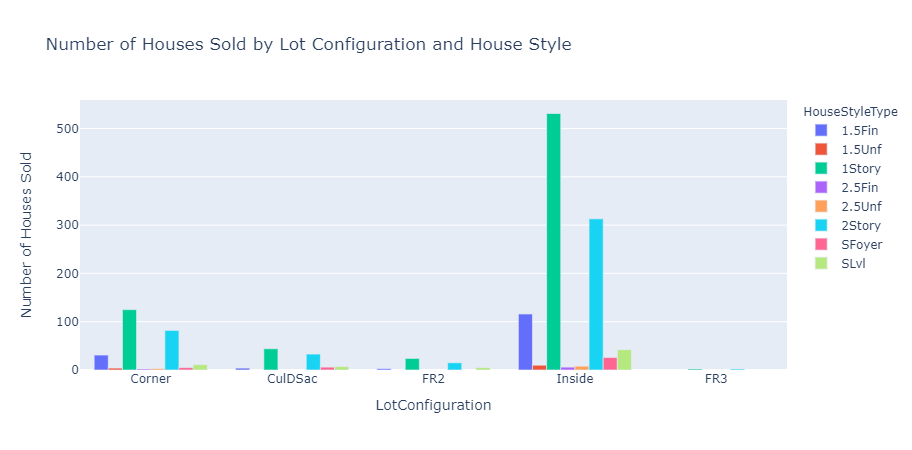

In [33]:
lot_style_counts = df.groupby(['LotConfiguration', 'HouseStyleType']).size().reset_index(name='Count')
fig = px.bar(lot_style_counts, x='LotConfiguration', y='Count', color='HouseStyleType',
             title='Number of Houses Sold by Lot Configuration and House Style',
             labels={'Count': 'Number of Houses Sold'},
             barmode='group') 
fig.show()

#### The most preferred configuration is a ***one-story house situated on an inside lot***.

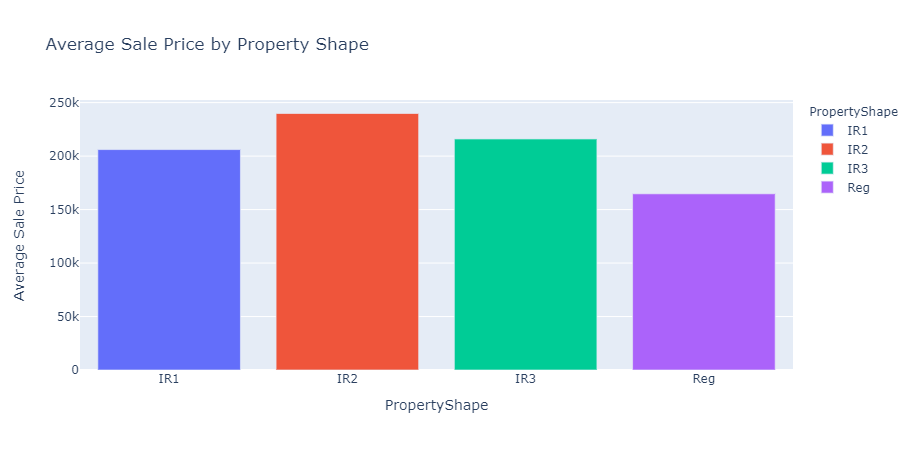

In [34]:
property_shape_group = df.groupby(['PropertyShape'])['SalePrice'].mean().reset_index()
fig = px.bar(property_shape_group, x='PropertyShape', y='SalePrice',
             title='Average Sale Price by Property Shape',
             labels={'SalePrice': 'Average Sale Price'},
             color='PropertyShape')
fig.show()

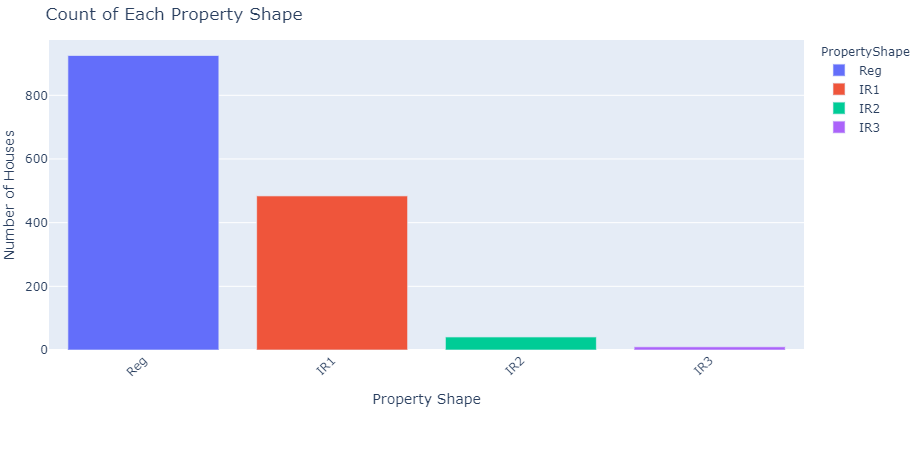

In [35]:
# Calculate the frequency of each PropertyShape
property_shape_count = df['PropertyShape'].value_counts().reset_index()
property_shape_count.columns = ['PropertyShape', 'Count']

# Plot the frequency of each PropertyShape
fig_property_shape = px.bar(property_shape_count, 
                           x='PropertyShape', 
                           y='Count',
                           title='Count of Each Property Shape',
                           labels={'Count': 'Number of Houses'},
                           color='PropertyShape')

fig_property_shape.update_layout(xaxis_title='Property Shape',
                                  yaxis_title='Number of Houses',
                                  xaxis_tickangle=-45,
                                  margin=dict(l=0, r=0, t=40, b=100))

fig_property_shape.show()


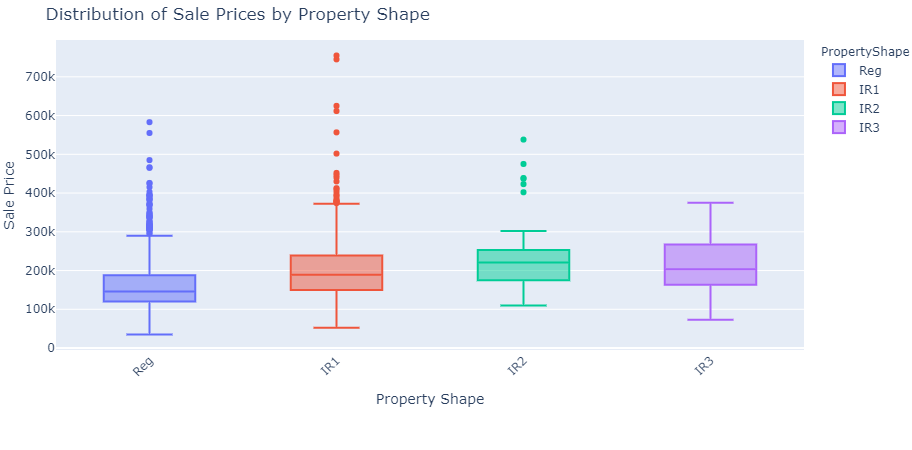

In [36]:
fig_dist_price = px.box(df, 
                       x='PropertyShape', 
                       y='SalePrice',
                       title='Distribution of Sale Prices by Property Shape',
                       labels={'SalePrice': 'Sale Price'},
                       color='PropertyShape')

fig_dist_price.update_layout(xaxis_title='Property Shape',
                             yaxis_title='Sale Price',
                             xaxis_tickangle=-45,
                             margin=dict(l=0, r=0, t=40, b=100))

fig_dist_price.show()

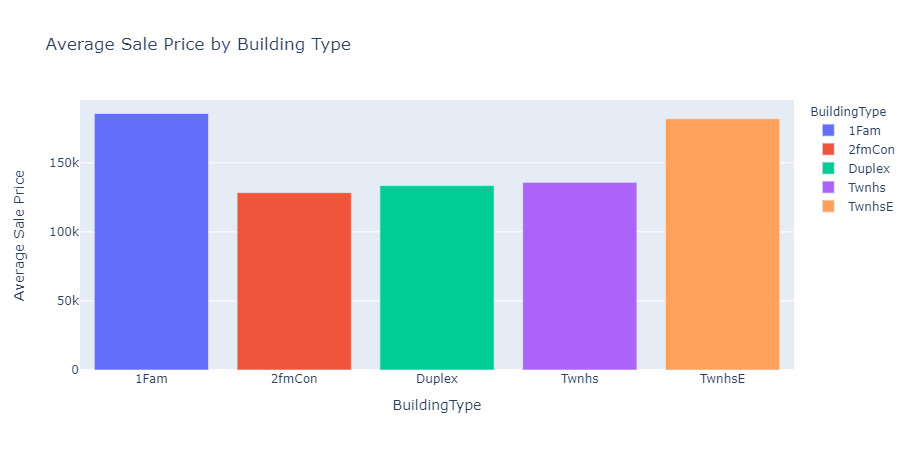

In [37]:
building_type_group = df.groupby(['BuildingType'])['SalePrice'].mean().reset_index()
fig = px.bar(building_type_group, x='BuildingType', y='SalePrice',
             title='Average Sale Price by Building Type',
             labels={'SalePrice': 'Average Sale Price'},
             color='BuildingType')
fig.show()

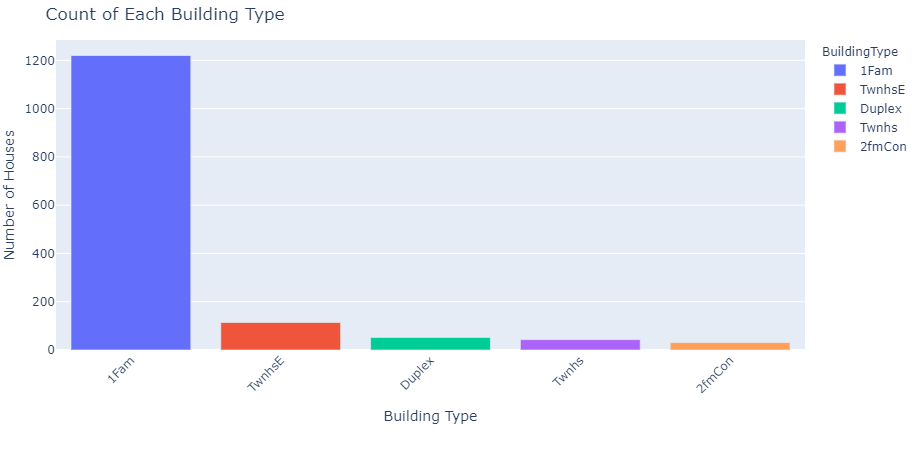

In [38]:
building_type_count = df['BuildingType'].value_counts().reset_index()
building_type_count.columns = ['BuildingType', 'Count']
fig_building_type_count = px.bar(building_type_count, 
                                x='BuildingType', 
                                y='Count',
                                title='Count of Each Building Type',
                                labels={'Count': 'Number of Houses'},
                                color='BuildingType')

fig_building_type_count.update_layout(xaxis_title='Building Type',
                                       yaxis_title='Number of Houses',
                                       xaxis_tickangle=-45,
                                       margin=dict(l=0, r=0, t=40, b=100))

fig_building_type_count.show()

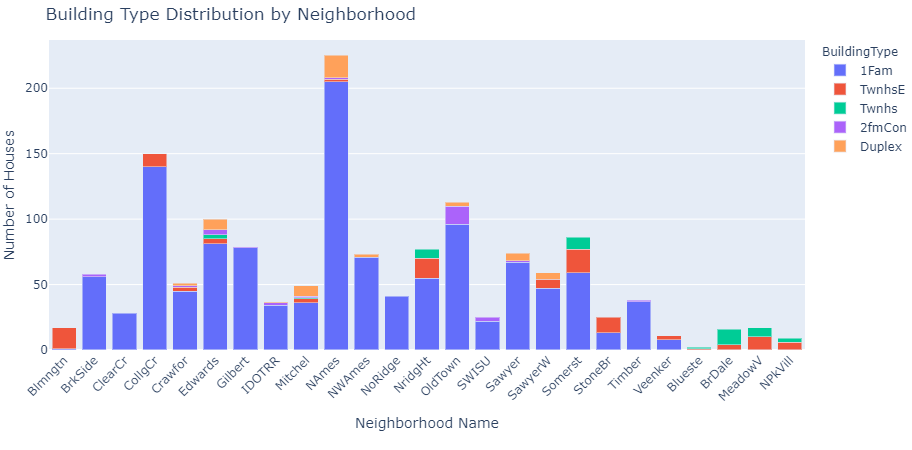

In [39]:
# Calculate the frequency of each BuildingType within each NeighborhoodName
building_type_neigh = df.groupby(['NeighborhoodName', 'BuildingType']).size().reset_index(name='Count')

# Plot BuildingType distribution within each NeighborhoodName
fig_building_type_neigh = px.bar(building_type_neigh, 
                                 x='NeighborhoodName', 
                                 y='Count', 
                                 color='BuildingType',
                                 title='Building Type Distribution by Neighborhood',
                                 labels={'Count': 'Number of Houses'},
                                 barmode='stack')

fig_building_type_neigh.update_layout(xaxis_title='Neighborhood Name',
                                        yaxis_title='Number of Houses',
                                        xaxis_tickangle=-45,
                                        margin=dict(l=0, r=0, t=40, b=100))

fig_building_type_neigh.show()


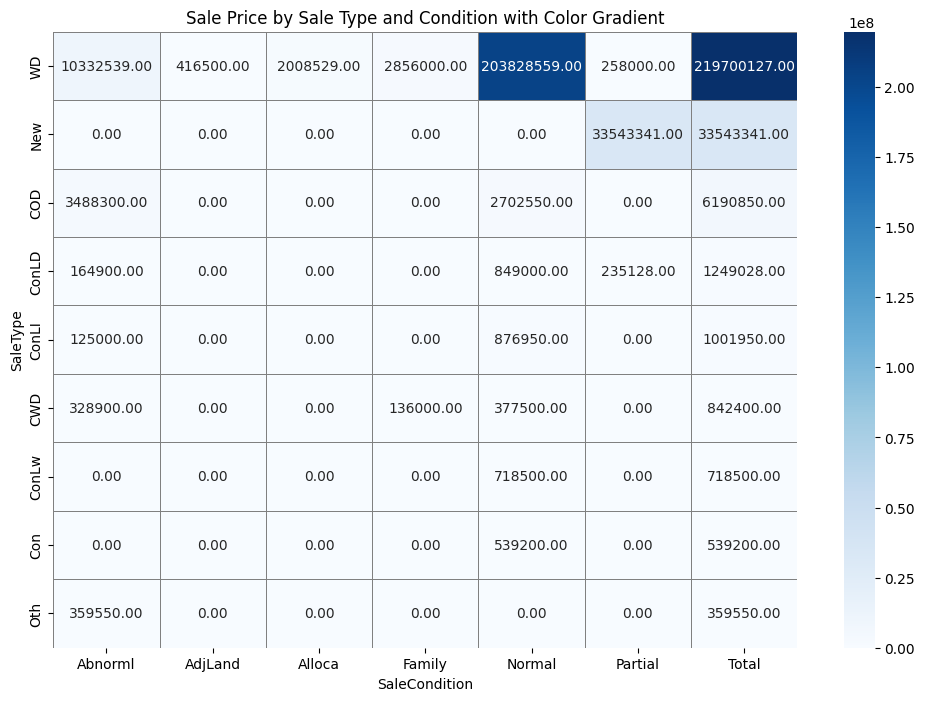

In [40]:
grouped_saleprice = df.groupby(['SaleType', 'SaleCondition'])['SalePrice'].sum().unstack()
grouped_saleprice = grouped_saleprice.fillna(0)
grouped_saleprice['Total'] = grouped_saleprice.sum(axis=1)
sorted_by_total = grouped_saleprice.sort_values(by='Total', ascending=False)
plt.figure(figsize=(12, 8))
sns.heatmap(sorted_by_total, annot=True, cmap='Blues', fmt='.2f', linewidths=.5, linecolor='gray')
plt.title('Sale Price by Sale Type and Condition with Color Gradient')
plt.show()

WD 	Warranty Deed - Conventional\
CWD	Warranty Deed - Cash\
VWD	Warranty Deed - VA Loan\
New	Home just constructed and sold\
COD	Court Officer Deed/Estate\
Con	Contract 15% Down payment regular terms\
ConLw	Contract Low Down payment and low interest\
ConLI	Contract Low Interest\
ConLD	Contract Low Down\
Oth	Other\

***Insights from the Data***\
**1-High Total Sale Price for WD (Warranty Deed):** The WD sale type generates the highest total sale price by a significant margin, totaling $219,700,127. This suggests that properties sold under this condition are generally more expensive or more numerous compared to other sale types.

**2-New Sale Type:** The New sale type has no sales recorded in the provided conditions, indicating it might be either rare or not included in the dataset.

**3-COD (Cash on Delivery):** This sale type has a substantial total sale price of $6,190,850, largely contributed by the Normal condition. This indicates a moderate but notable presence of cash transactions.

**4-ConLD (Contract Lien Deed) and ConLI (Contract Lien Installment):** Both have significant sales in the Normal condition, indicating they are relatively common for standard sales.

**5-CWD (Contract with Deed):** This sale type has a considerable amount in the Normal condition and Family, suggesting it is also used for regular and familial sales.

**6-ConLw (Contract Lien with Warranty) and Con (Contract):** These sale types show smaller total sale prices, indicating less frequent or less expensive transactions compared to others.

**7-Oth (Other):** Represents a minor total sale price of $359,550, which is the smallest, indicating it is the least frequent sale type in this dataset.

----------------

# Data Cleaning

In [41]:
df.shape

(1460, 81)

Dropping columns with dominant values that present more than 85% of all values

In [42]:
dominant_columns = []

for col in df.drop('SalePrice', axis=1).columns:
    top_value_proportion = df[col].value_counts(normalize=True).values[0]
    if top_value_proportion > 0.85:
        dominant_columns.append(col)

df_reduced = df.drop(columns=dominant_columns)
print("Columns with a dominant value ", dominant_columns)

Columns with a dominant value  ['Street', 'AlleyAccessType', 'LandFlatness', 'Utilities', 'LandSlopeDegree', 'ProximityToCondition', 'Condition2', 'RoofMatl', 'ExteriorCondition', 'BasementCondition', 'BasementFinishType2', 'BsmtFinSF2', 'Heating', 'CentralAir', 'ElectricalSystem', 'LowQualFinSF', 'BsmtHalfBath', 'KitchenAbvGr', 'Functional', 'GarageQual', 'GarageCondition', 'PavedDrivewayType', 'EnclosedPorch', '3SsnPorch', 'ScreenPorch', 'PoolArea', 'PoolQC', 'MiscFeature', 'MiscVal', 'SaleType']


In [43]:
df_reduced.shape

(1460, 51)

Analyzing Columns into numerical & categorical

In [44]:
numerical_cols = df_reduced.select_dtypes(include='number').columns
categorical_cols = df_reduced.select_dtypes(exclude='number').columns

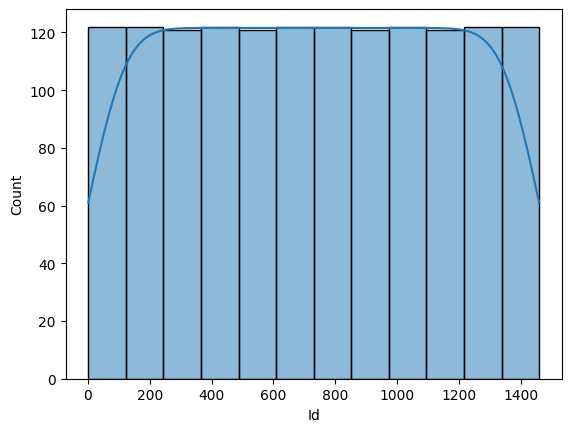

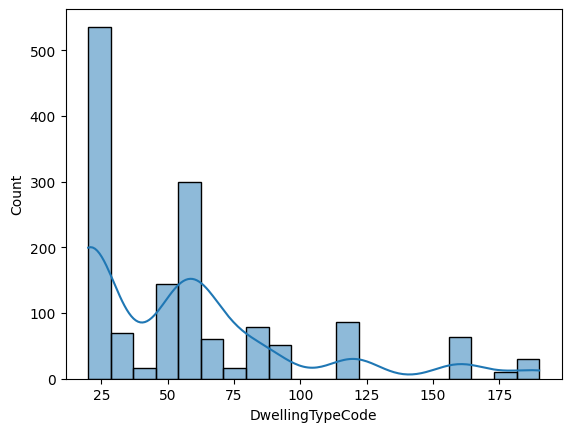

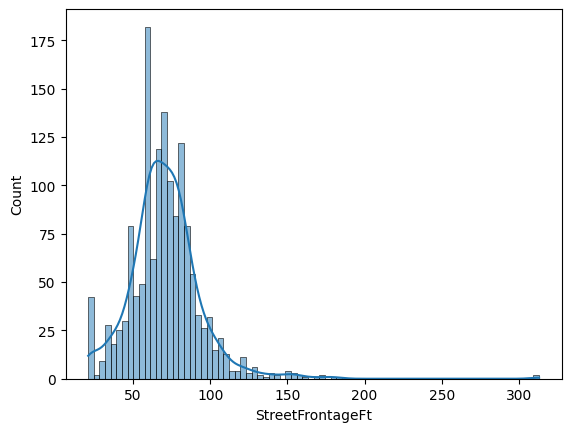

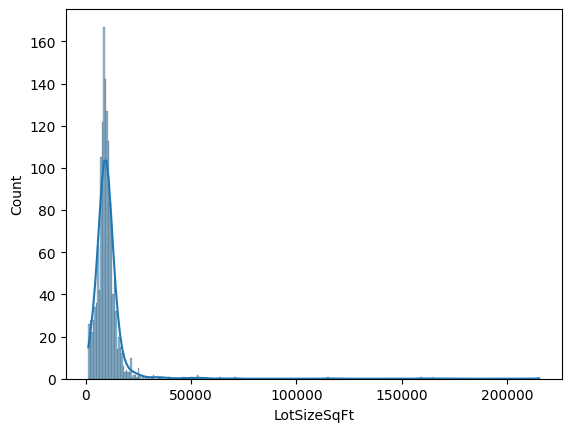

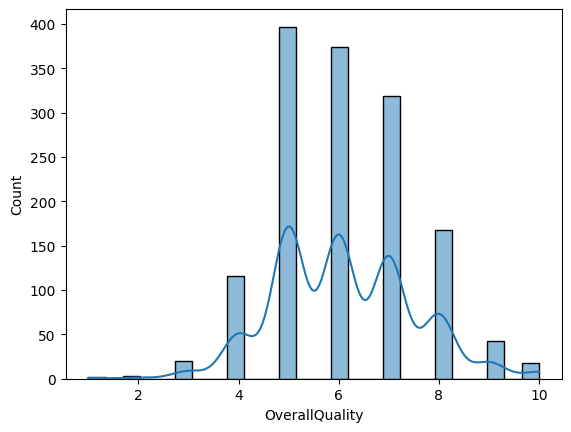

...

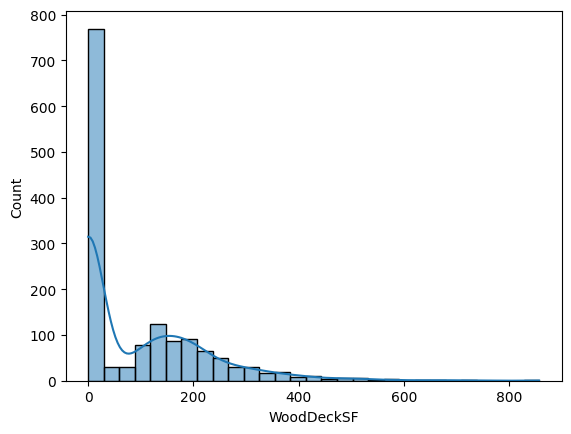

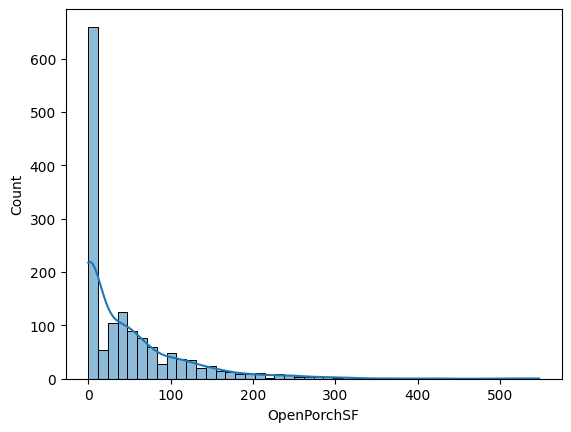

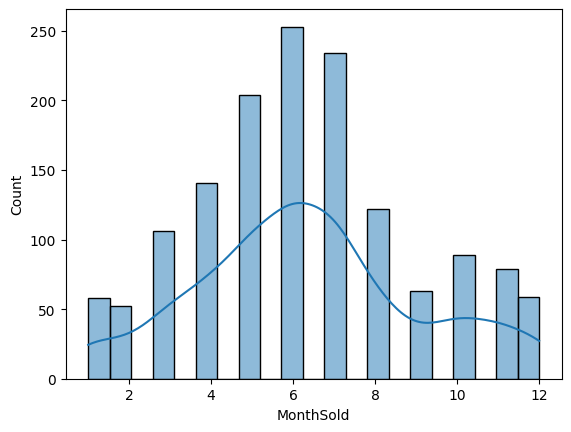

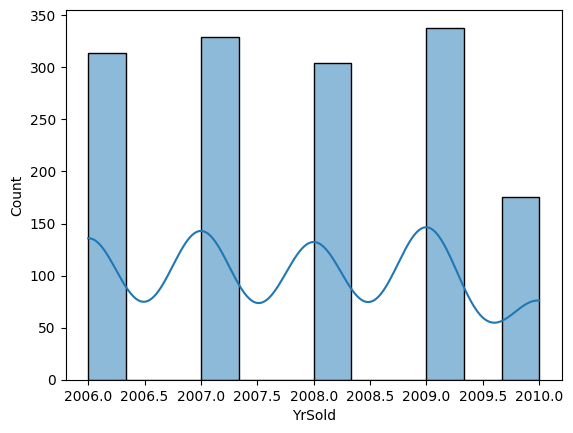

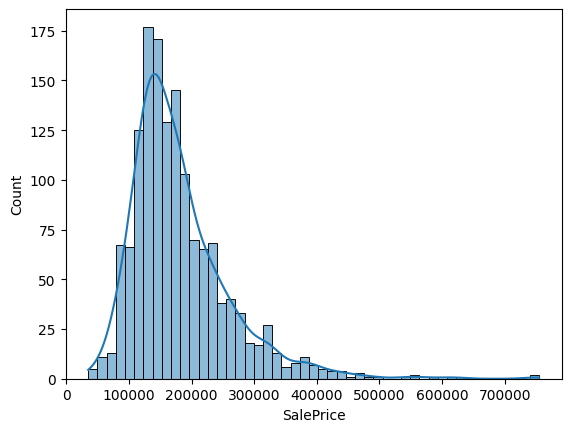

In [45]:
for col in numerical_cols:
    sns.histplot(df_reduced[col], kde=True)
    plt.show()

In [46]:
cols_actually_categorical = ['DwellingTypeCode', 'OverallQuality', 'OverallCondition', 'YearConstructed', 'YearRemodAdd', 'BsmtFullBath', 'FullBath', 'HalfBath', 'BedroomsAboveGrade', 'TotalRoomsAboveGrade', 'Fireplaces', 'GarageYrBlt', 'GarageCapacity','MonthSold', 'YrSold']

In [47]:
df_reduced.loc[:,cols_actually_categorical] = df_reduced.loc[:,cols_actually_categorical].astype('object')

In [48]:
df_reduced.info()

<class 'pandas.core.frame.DataFrame'>

RangeIndex: 1460 entries, 0 to 1459

Data columns (total 51 columns):

 #   Column                    Non-Null Count  Dtype  

---  ------                    --------------  -----  

 0   Id                        1460 non-null   float64

 1   DwellingTypeCode          1460 non-null   object 

 2   ZoningClassification      1460 non-null   object 

 3   StreetFrontageFt          1460 non-null   float64

 4   LotSizeSqFt               1460 non-null   float64

 5   PropertyShape             1460 non-null   object 

 6   LotConfiguration          1460 non-null   object 

 7   NeighborhoodName          1460 non-null   object 

 8   BuildingType              1460 non-null   object 

 9   HouseStyleType            1460 non-null   object 

 10  OverallQuality            1460 non-null   object 

 11  OverallCondition          1460 non-null   object 

 12  YearConstructed           1460 non-null   object 

 13  YearRemodAdd              1460 non-null   obj

In [49]:
numerical_cols = df_reduced.select_dtypes(include='number').columns
categorical_cols = df_reduced.select_dtypes(exclude='number').columns

In [50]:
df_reduced.dtypes.value_counts()

object     37
float64    14
Name: count, dtype: int64

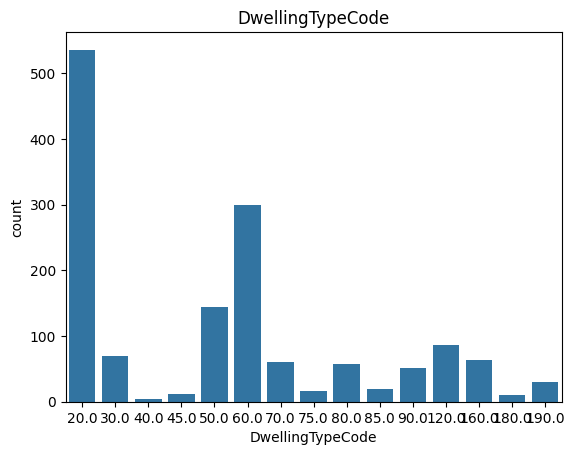

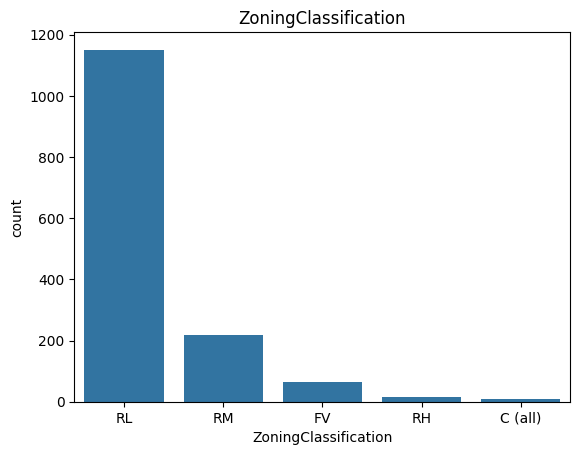

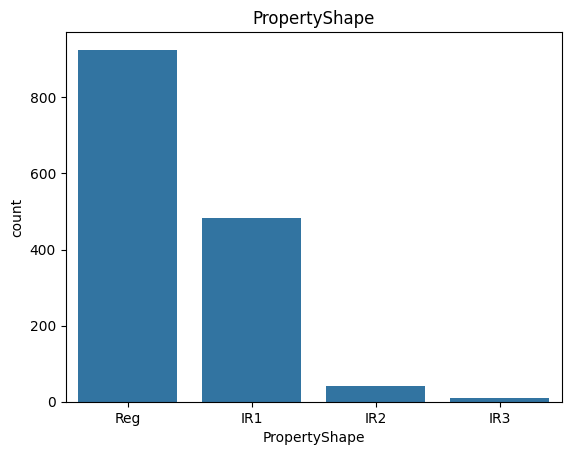

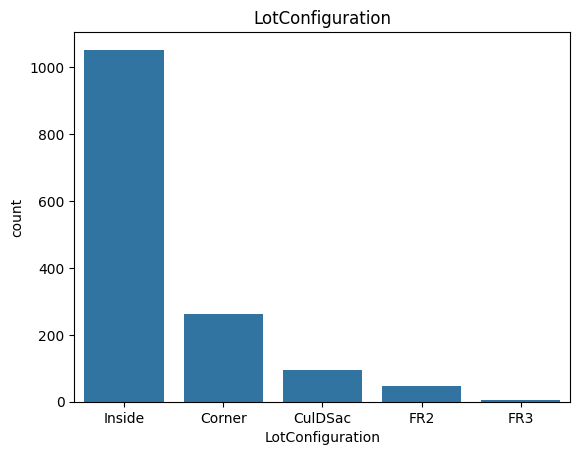

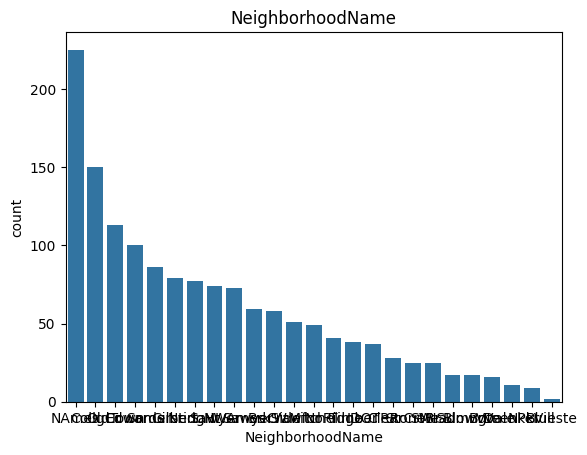

...

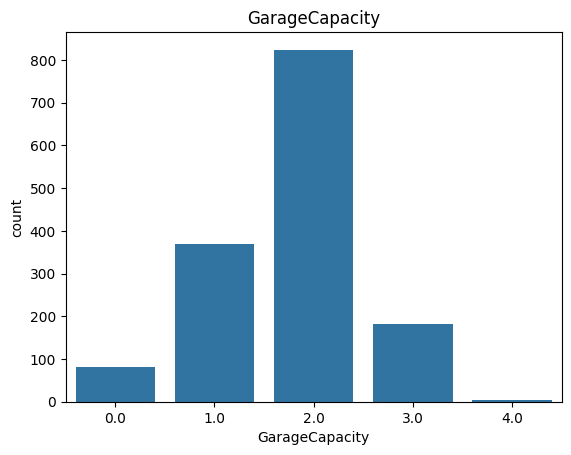

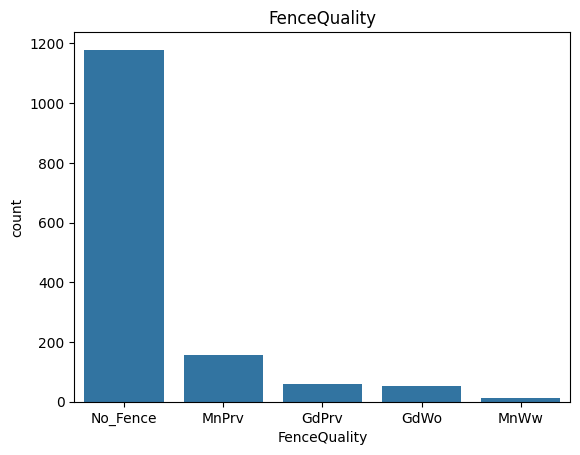

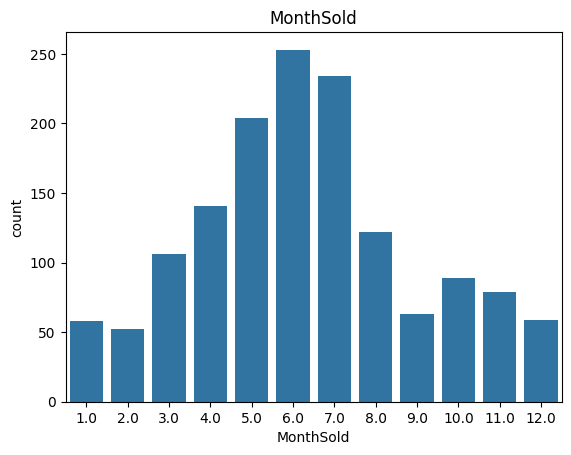

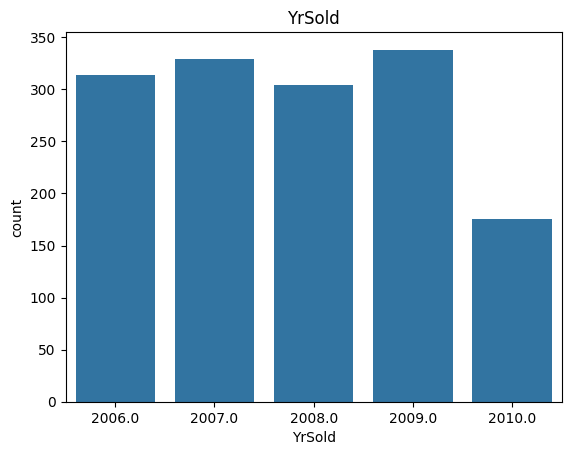

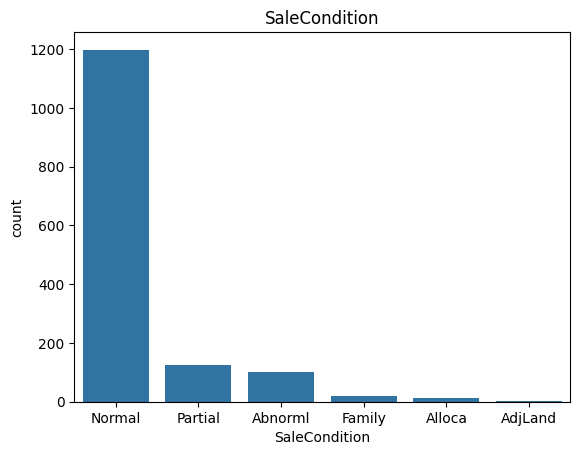

In [51]:
for col in categorical_cols:
    vals = df_reduced[col].value_counts()
    sns.barplot(x=vals.index, y=vals)
    plt.title(col)
    plt.show()

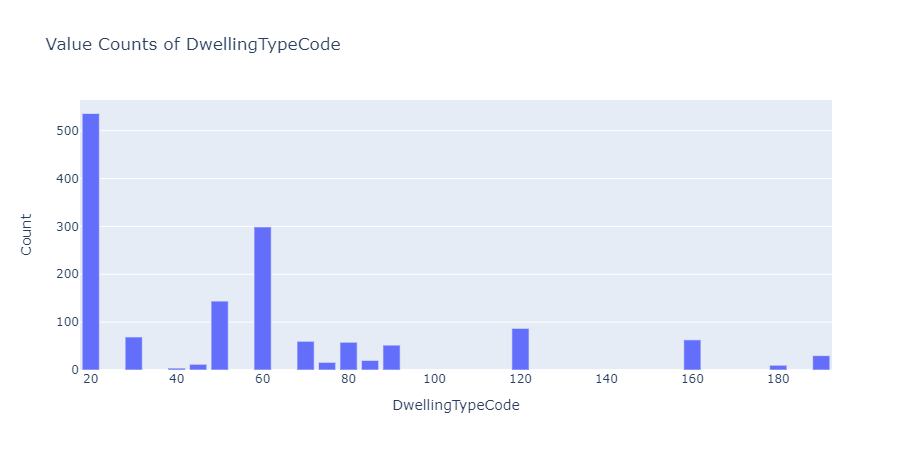

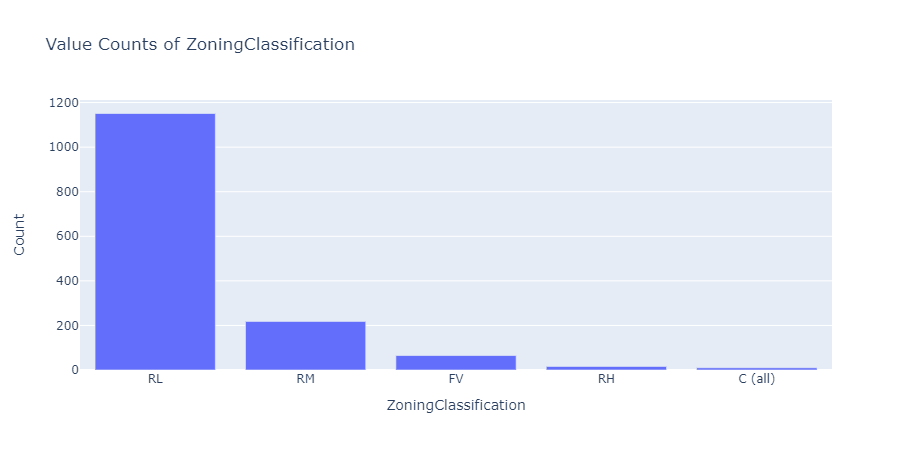

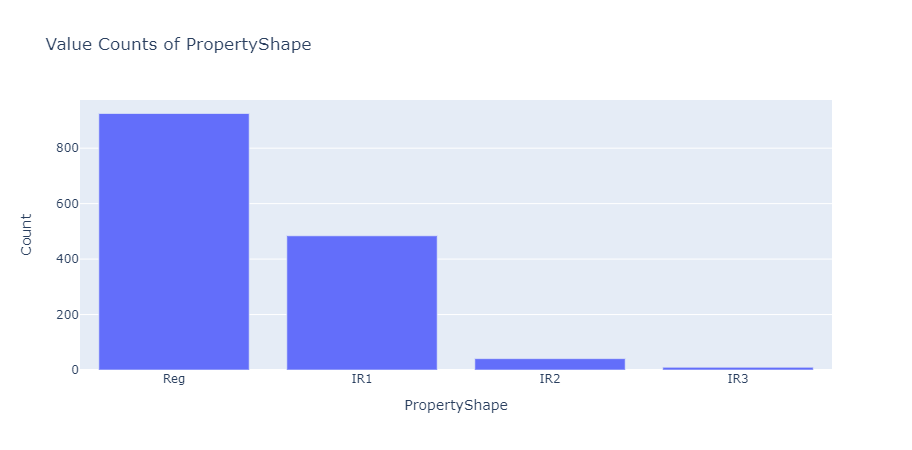

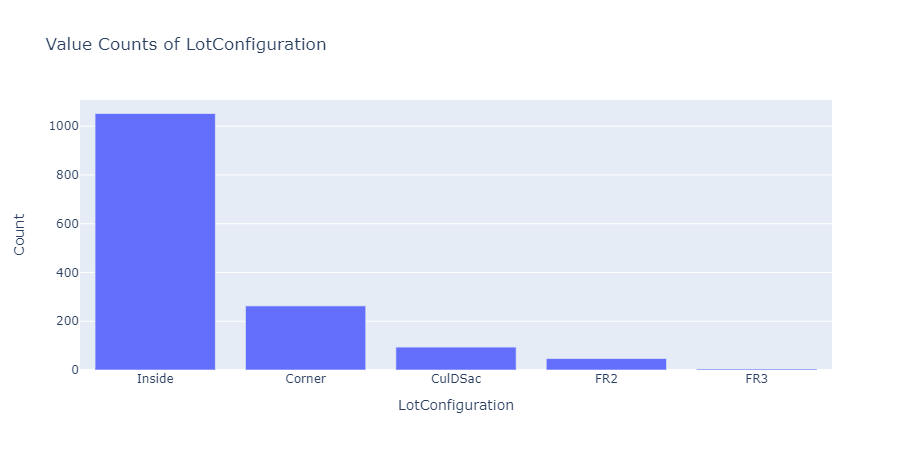

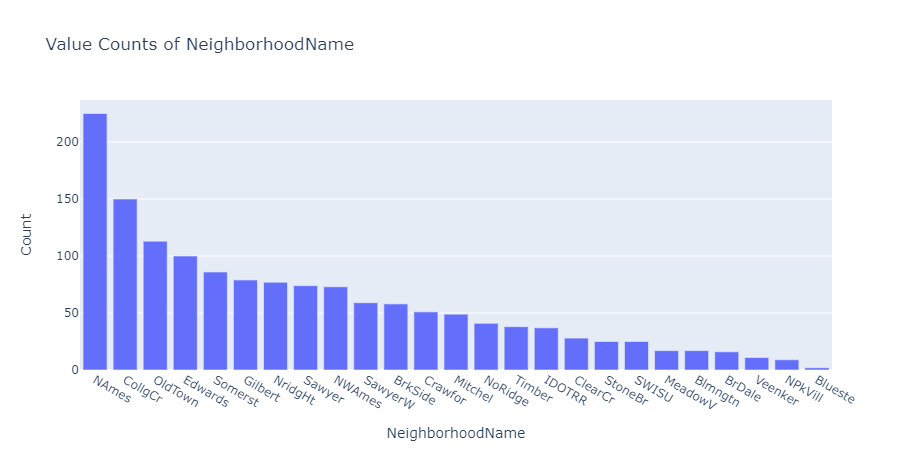

...

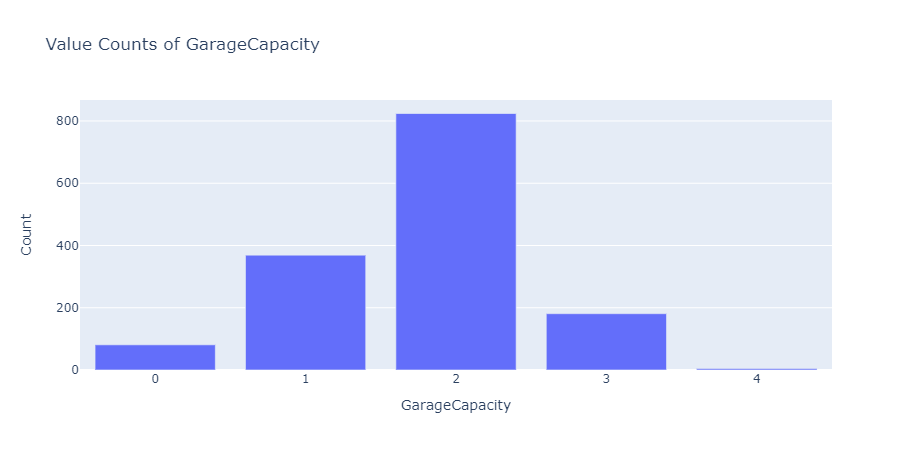

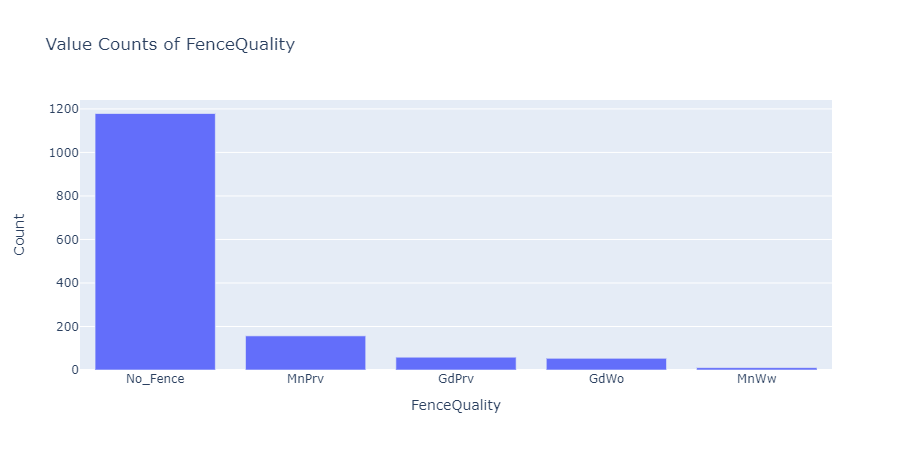

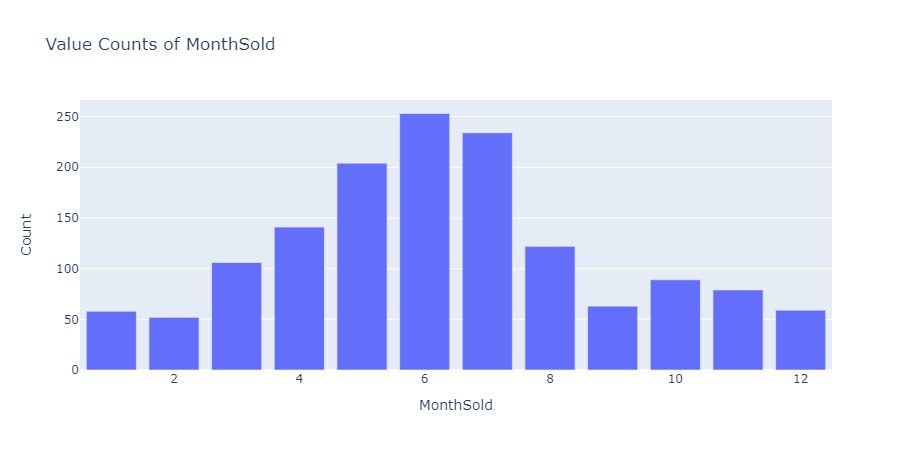

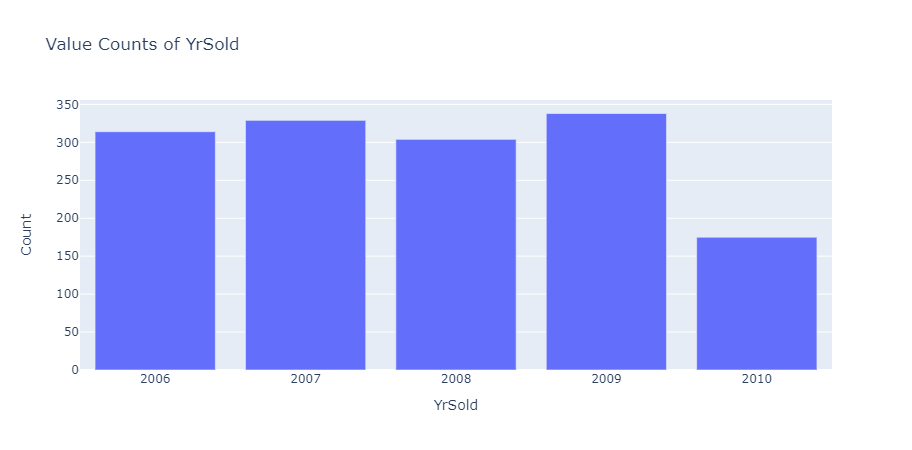

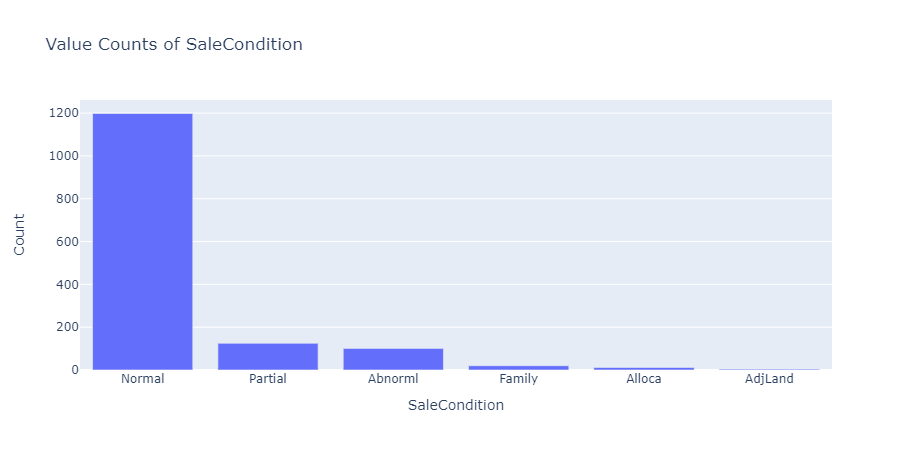

In [52]:
import plotly.graph_objects as go

for col in categorical_cols:
    vals = df_reduced[col].value_counts()
    fig = go.Figure(
        data=[go.Bar(x=vals.index, y=vals)],
        layout_title_text=f'Value Counts of {col}'
    )
    fig.update_xaxes(title_text=col)
    fig.update_yaxes(title_text='Count')
    fig.show()


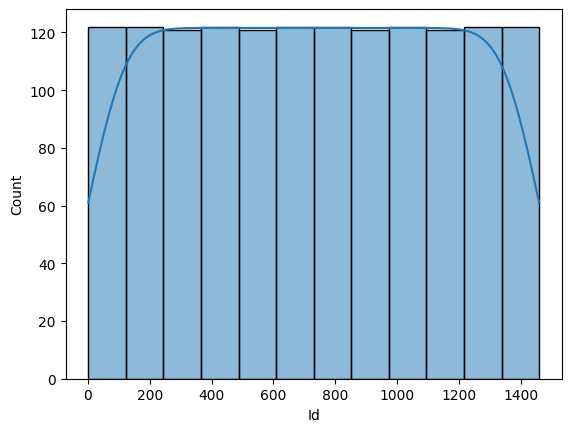

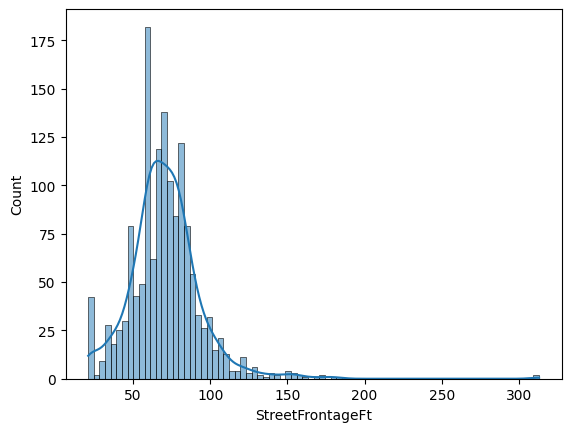

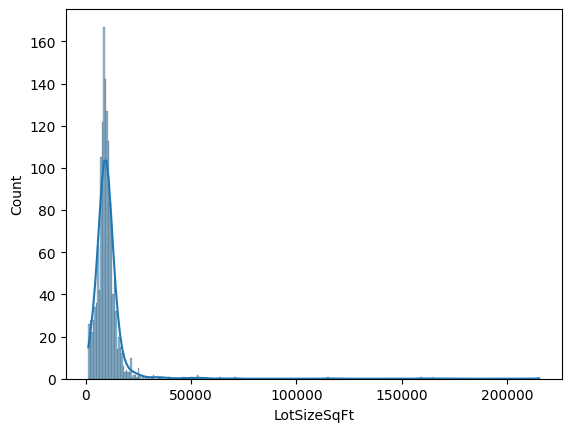

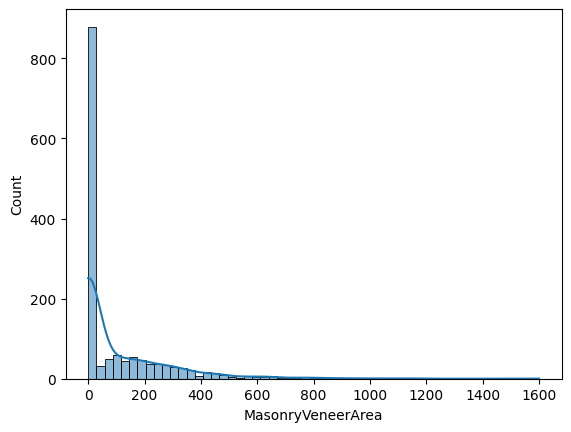

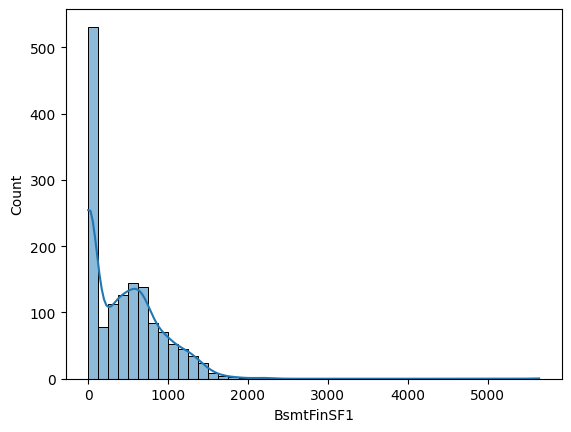

...

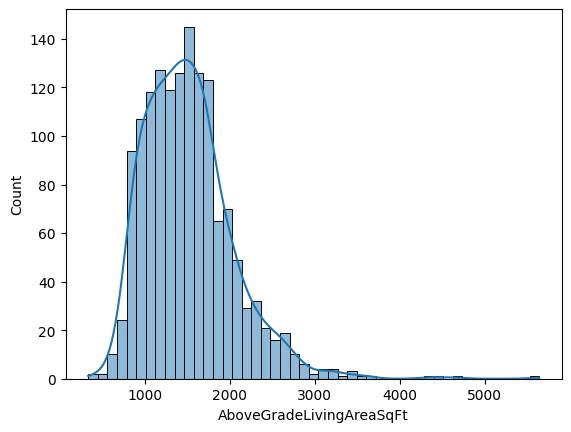

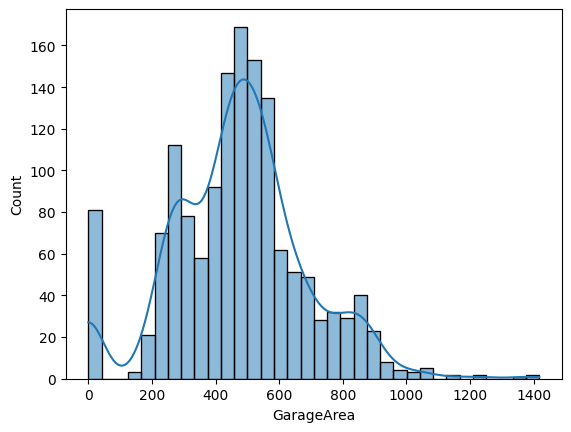

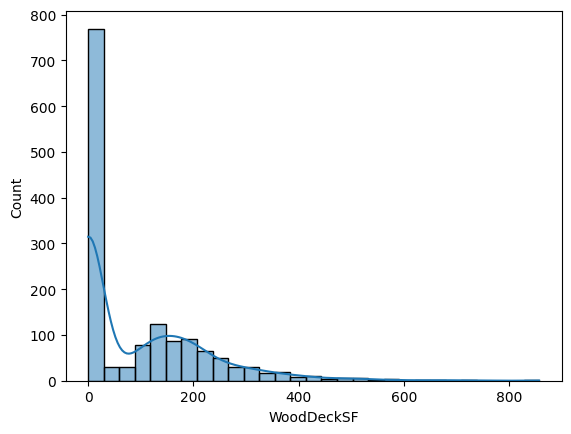

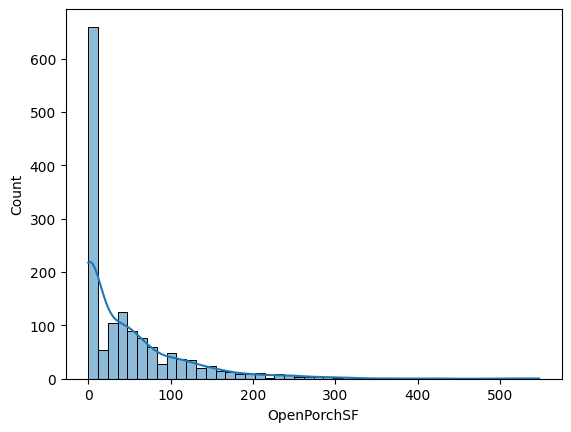

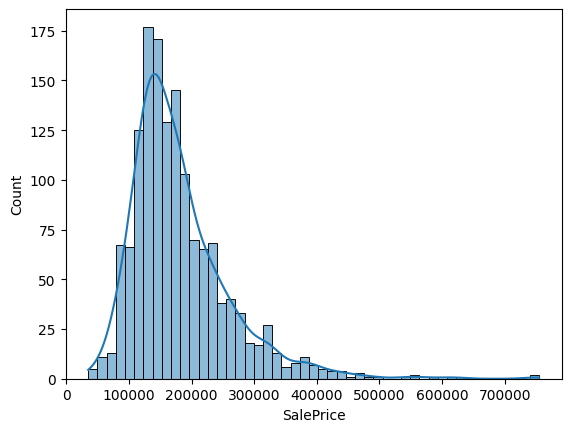

In [53]:
for col in numerical_cols:
    sns.histplot(df_reduced[col], kde=True)
    plt.show()

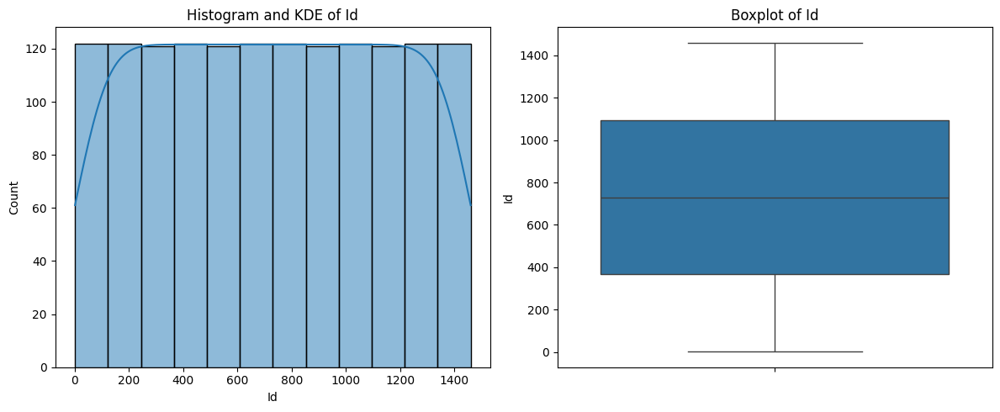

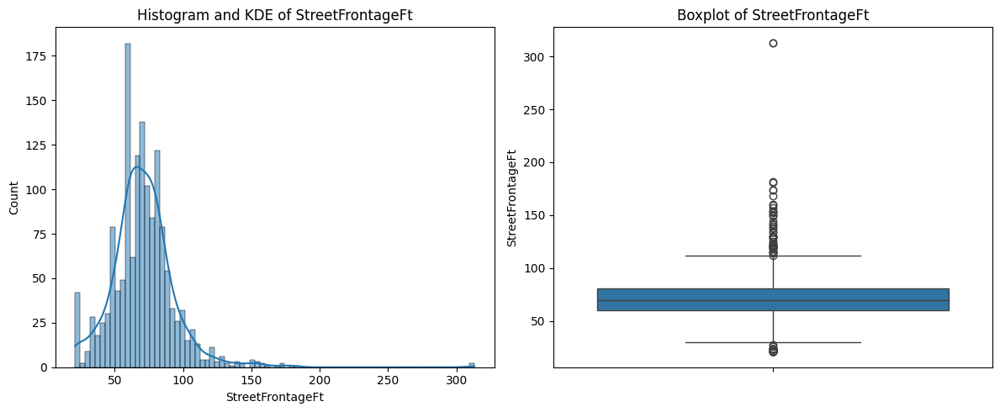

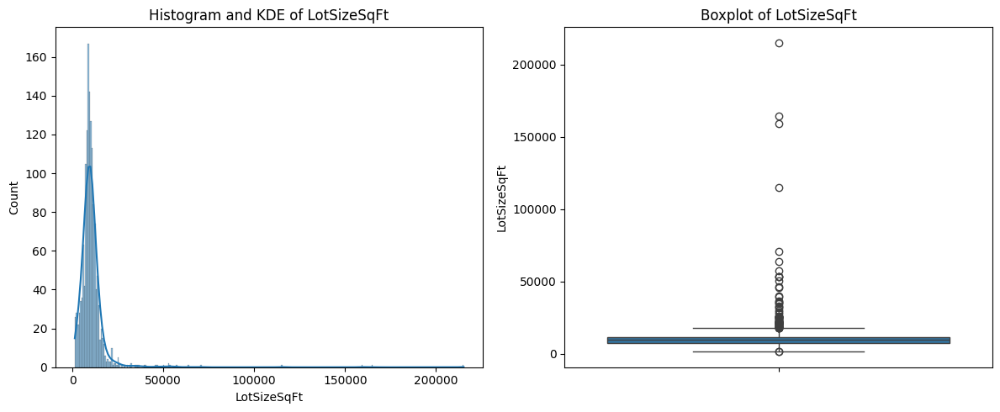

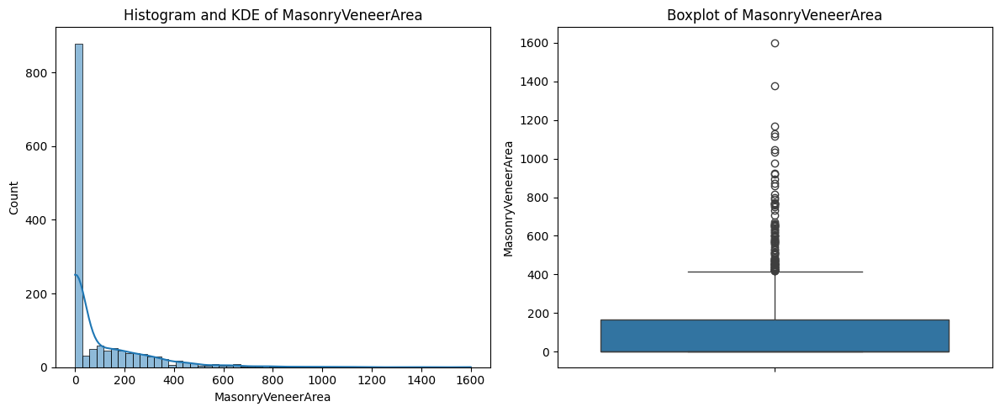

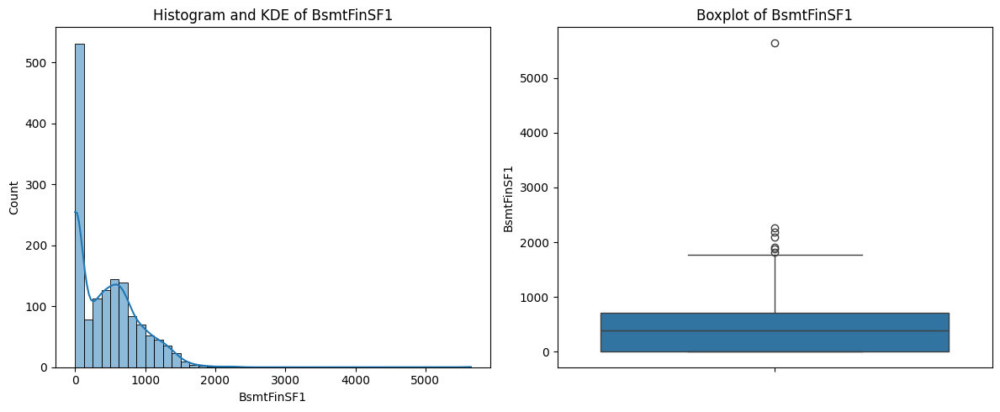

...

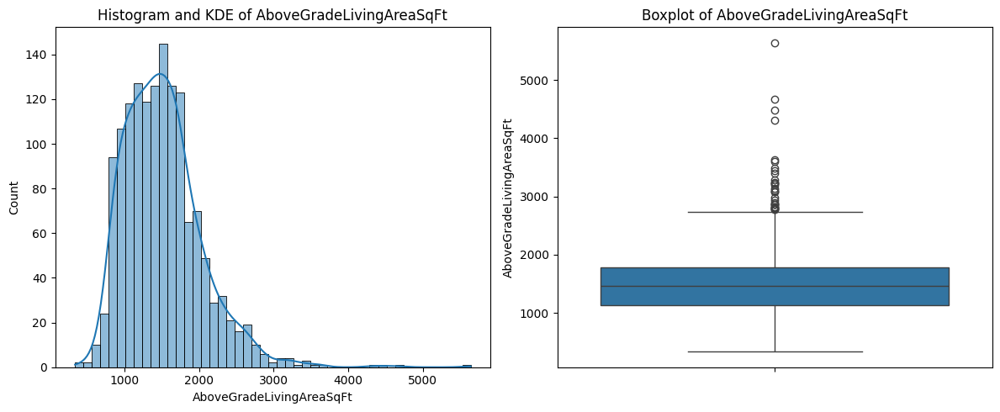

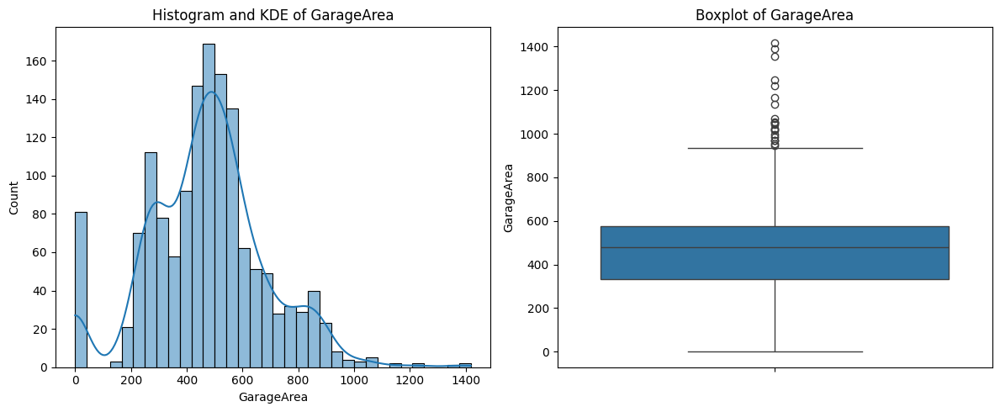

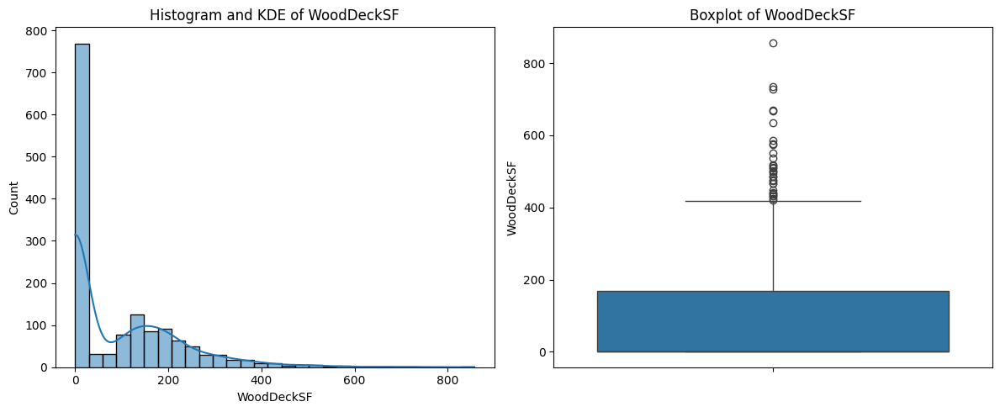

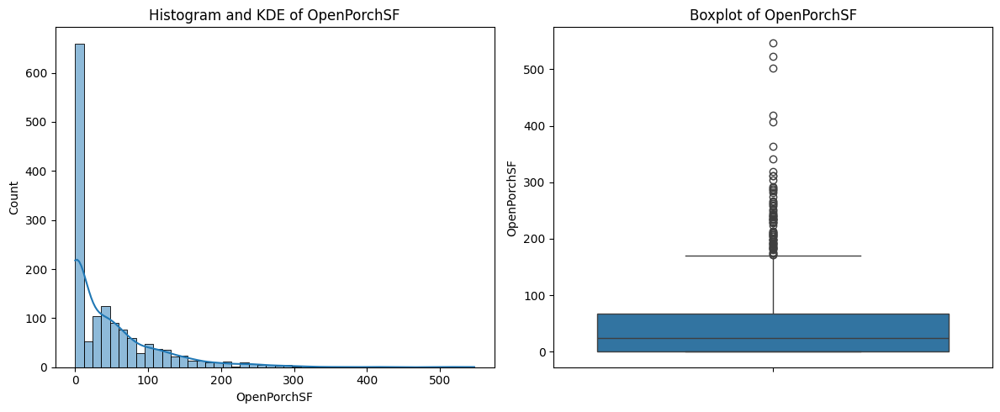

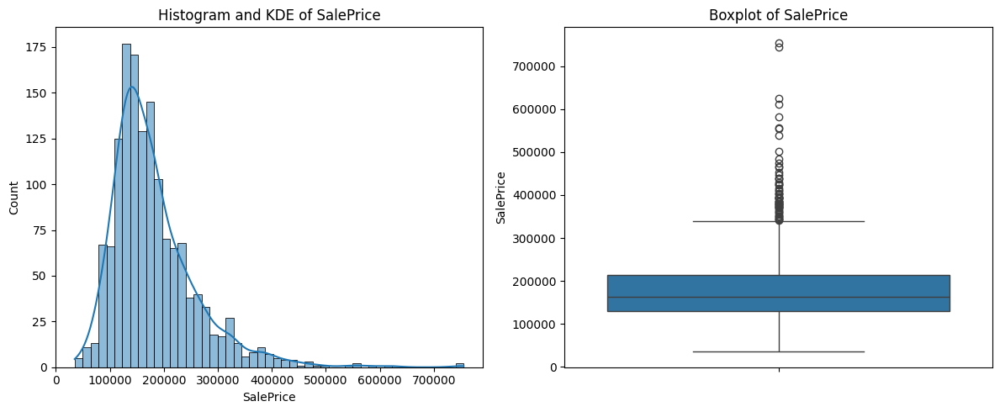

In [54]:
for col in numerical_cols:
    fig, axes = plt.subplots(1, 2, figsize=(12, 5))
    
    # Histogram with KDE 
    sns.histplot(df_reduced[col], kde=True, ax=axes[0])
    axes[0].set_title(f'Histogram and KDE of {col}')
    
    # Boxplot 
    sns.boxplot(y=df_reduced[col], ax=axes[1])
    axes[1].set_title(f'Boxplot of {col}')
    
    plt.tight_layout()  
    plt.show()

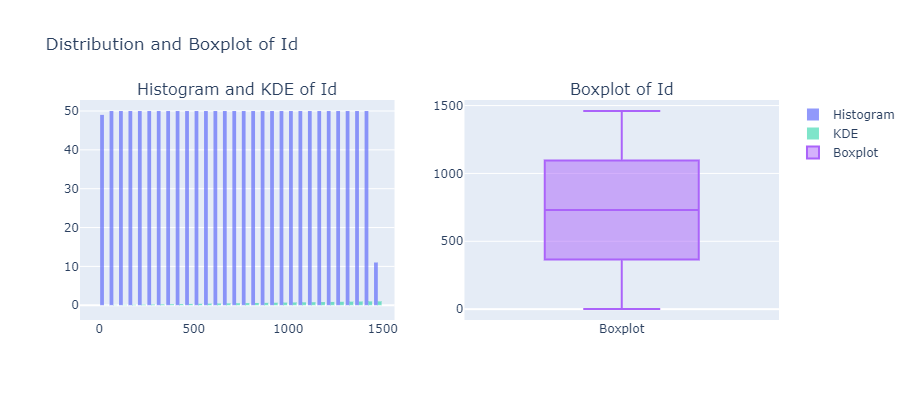

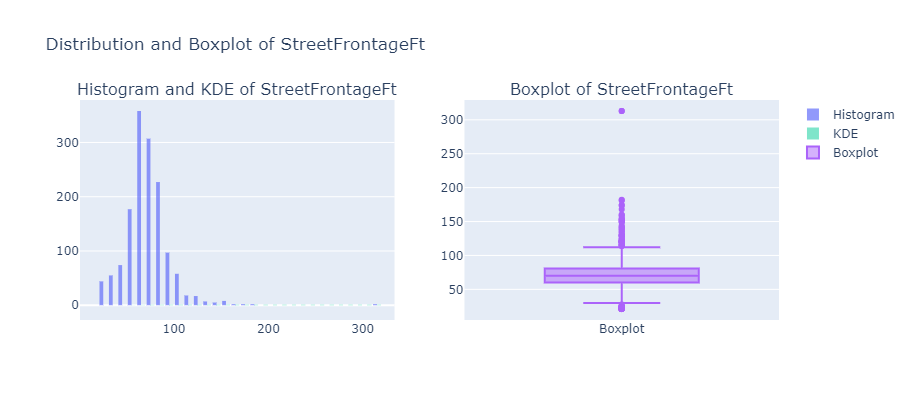

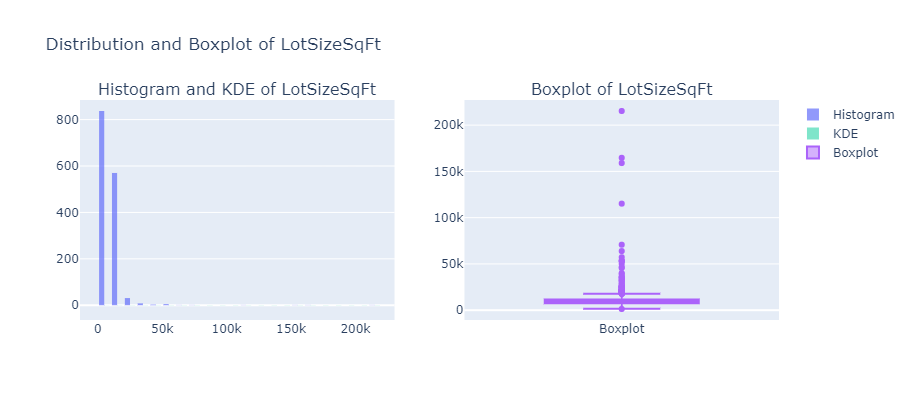

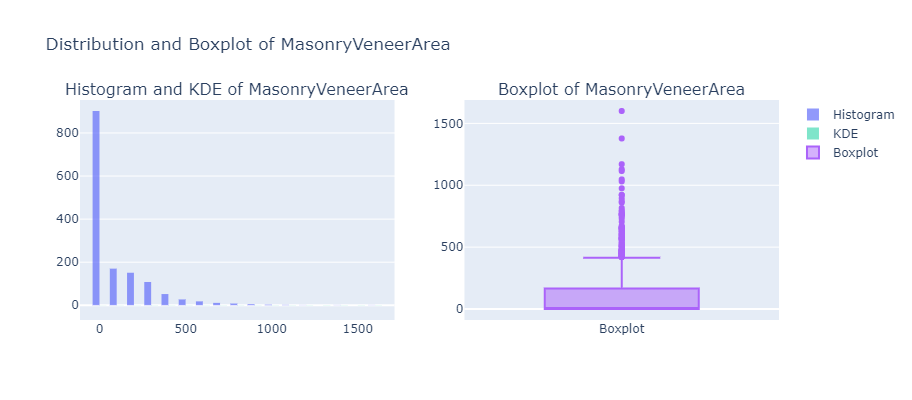

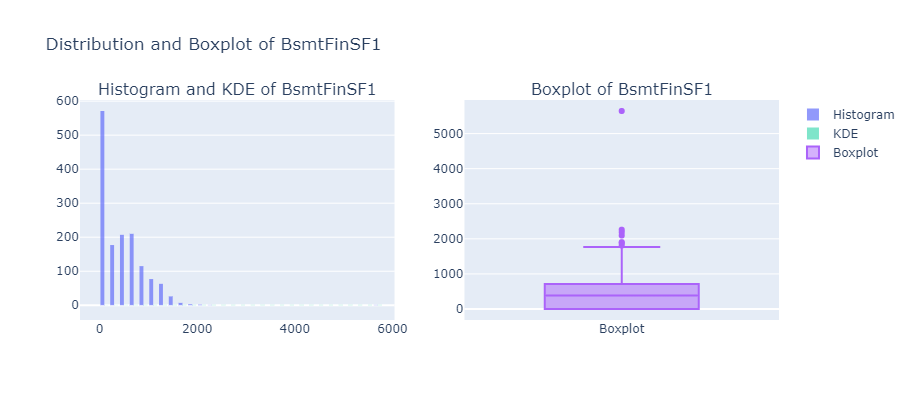

...

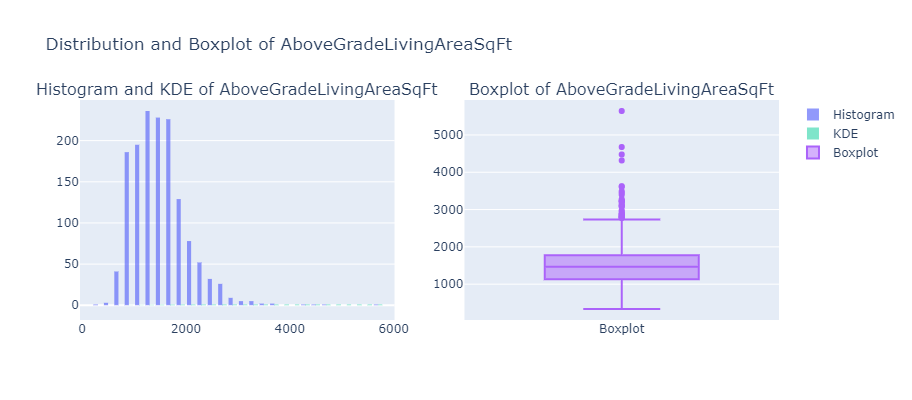

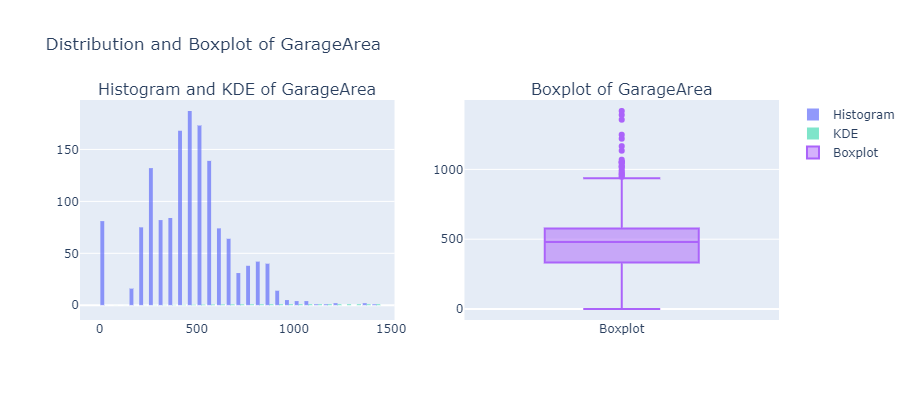

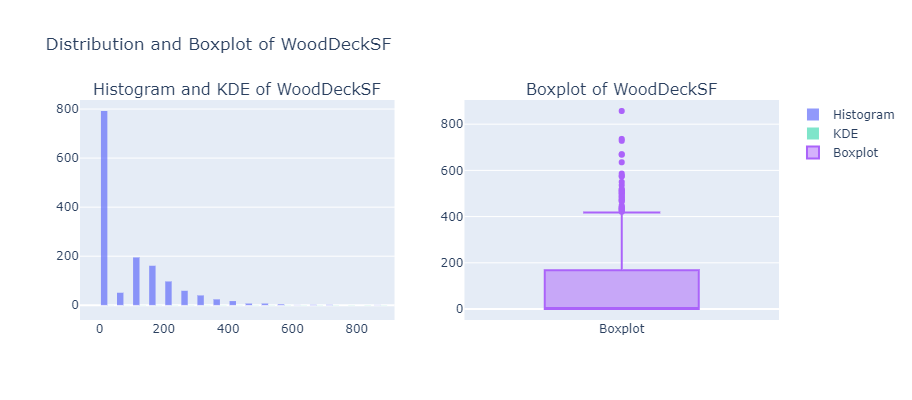

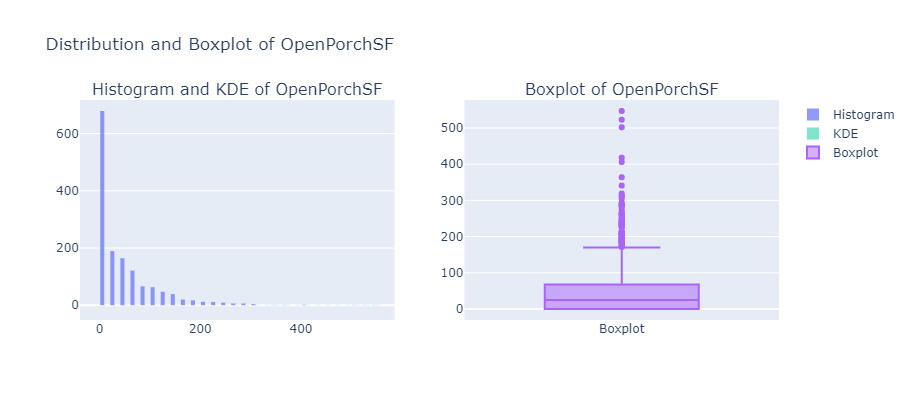

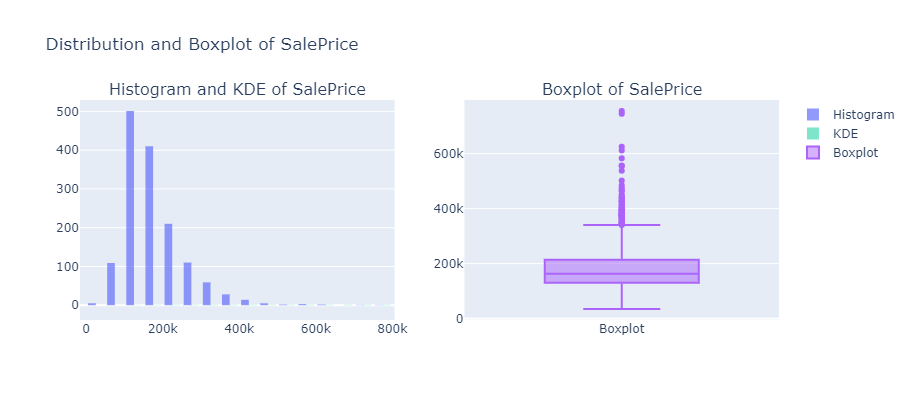

In [55]:
import plotly.graph_objs as go
from plotly.subplots import make_subplots

for col in numerical_cols:
    # Create subplots: 1 row, 2 columns
    fig = make_subplots(rows=1, cols=2, subplot_titles=(f'Histogram and KDE of {col}', f'Boxplot of {col}'))
    
    # Histogram with KDE
    fig.add_trace(
        go.Histogram(x=df_reduced[col], nbinsx=30, opacity=0.7, name='Histogram'),
        row=1, col=1
    )
    
    fig.add_trace(
        go.Scatter(x=df_reduced[col], y=[0]*len(df), mode='markers', marker=dict(color='rgba(0,0,0,0)'), showlegend=False),
        row=1, col=1
    )

    fig.add_trace(
        go.Histogram(x=df_reduced[col], opacity=0.5, histnorm='probability', cumulative_enabled=True, name='KDE'),
        row=1, col=1
    )

    # Boxplot
    fig.add_trace(
        go.Box(y=df_reduced[col], name='Boxplot'),
        row=1, col=2
    )
    
    # Update layout
    fig.update_layout(
        width=800, height=400, title_text=f'Distribution and Boxplot of {col}'
    )
    
    fig.show()


drop ID column

In [56]:
df_reduced.drop(columns=['Id'], inplace=True)

In [57]:
df_reduced.shape

(1460, 50)

Getting numerical & categorical columns again after reduction

In [58]:
numerical_cols = df_reduced.select_dtypes(include='number').columns
categorical_cols = df_reduced.select_dtypes(exclude='number').columns

In [59]:
df_reduced.dtypes.value_counts()

object     37
float64    13
Name: count, dtype: int64

In [60]:
df_reduced_with_outliers = df_reduced.copy()
df_reduced_log = df_reduced.copy()
df_reduced_iqr = df_reduced.copy()
df_reduced_no_outliers = df_reduced.copy()

In [61]:
df_reduced_with_outliers.shape

(1460, 50)

# Handling Outliers 

#### First approach: using log scale

In [62]:
numerical_cols

Index(['StreetFrontageFt', 'LotSizeSqFt', 'MasonryVeneerArea', 'BsmtFinSF1',
       'BsmtUnfSF', 'TotalBsmtSF', '1stFlrSF', '2ndFlrSF',
       'AboveGradeLivingAreaSqFt', 'GarageArea', 'WoodDeckSF', 'OpenPorchSF',
       'SalePrice'],
      dtype='object')

In [63]:
numerical_cols_without_y = numerical_cols.drop('SalePrice')

Boxplot of numerical columns with outliers

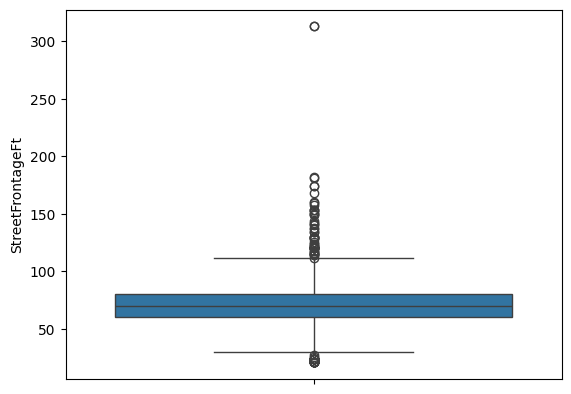

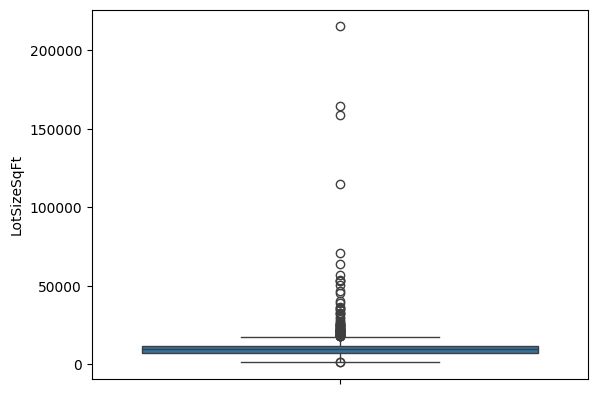

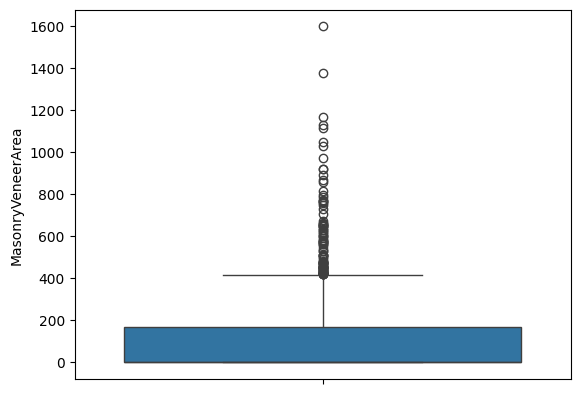

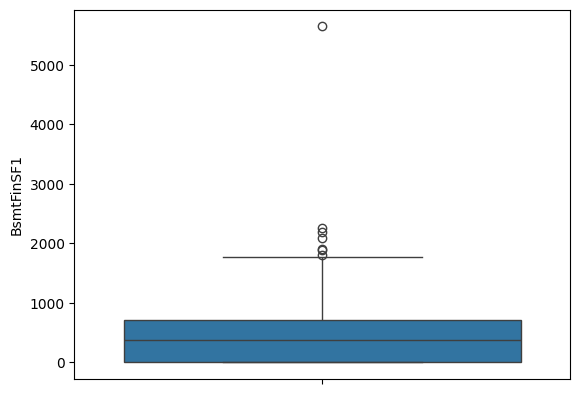

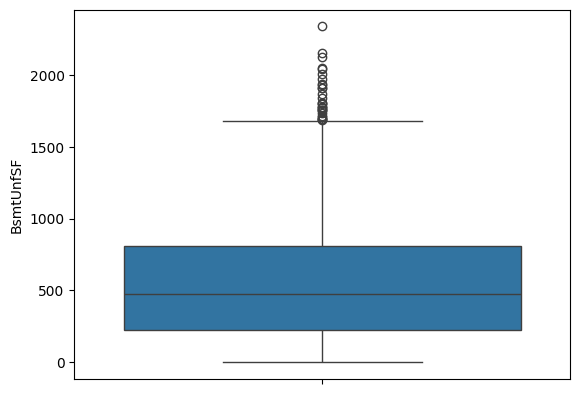

...

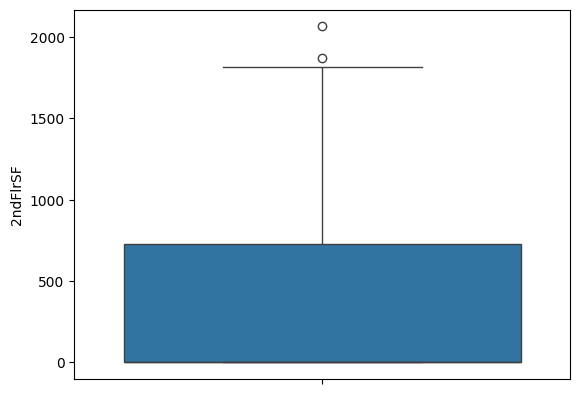

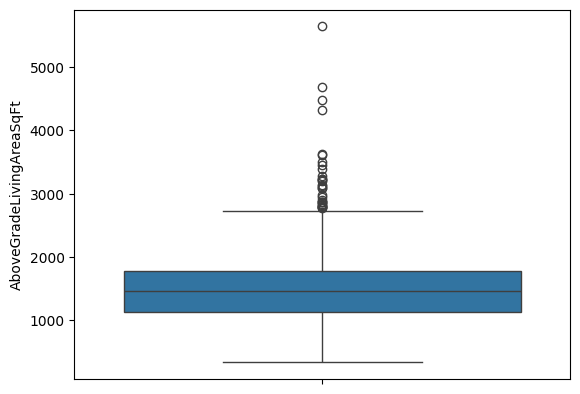

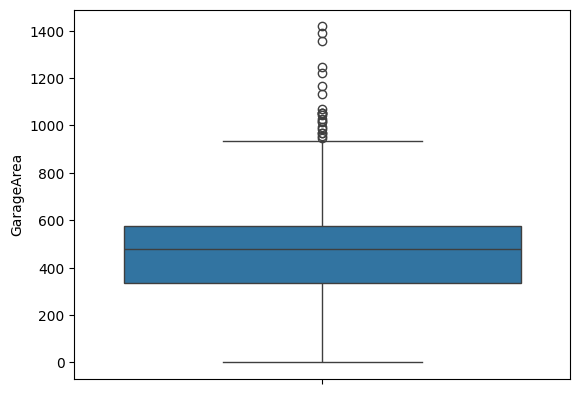

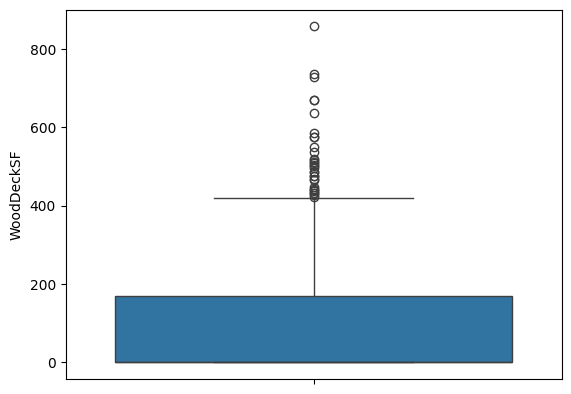

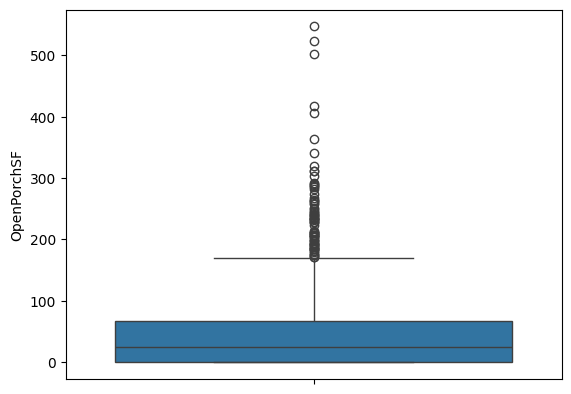

In [64]:
for col in numerical_cols_without_y:
    sns.boxplot(y=df_reduced_log[col])
    plt.show()

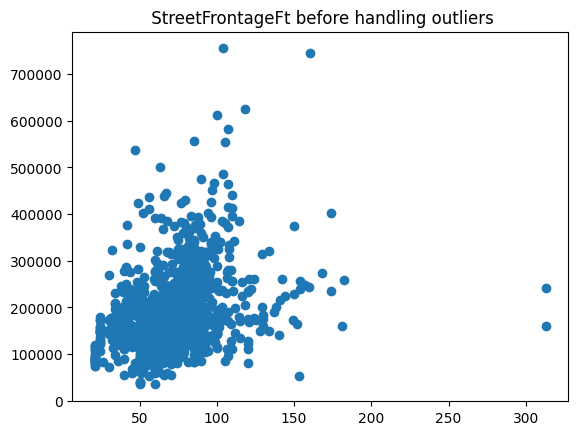

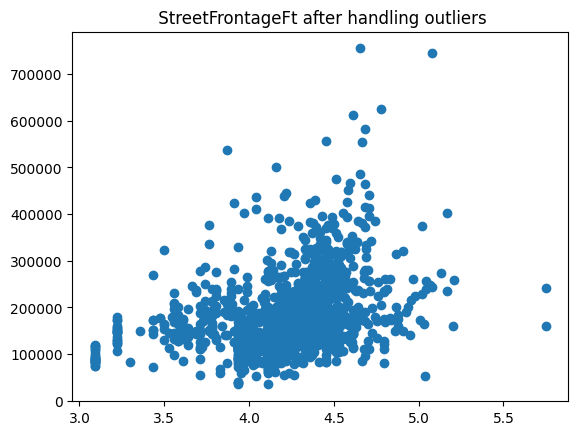

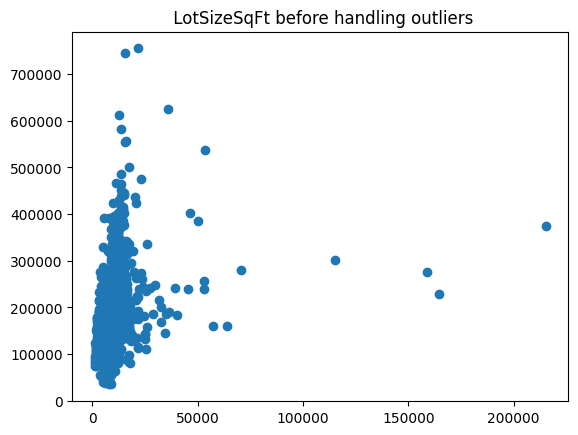

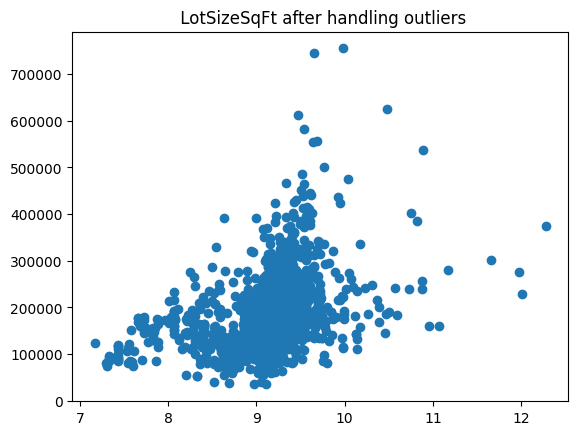

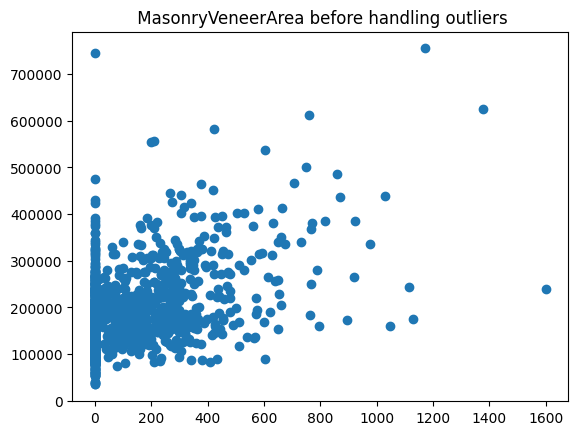

...

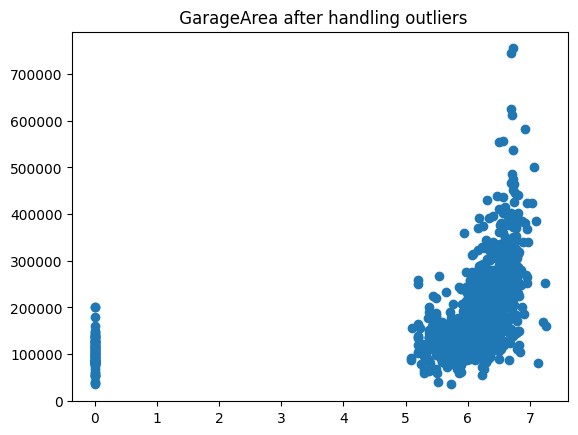

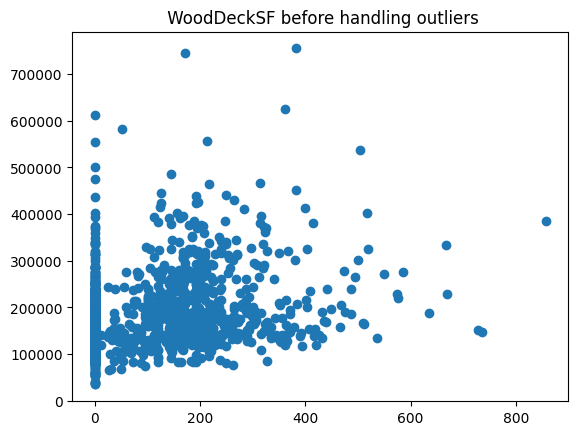

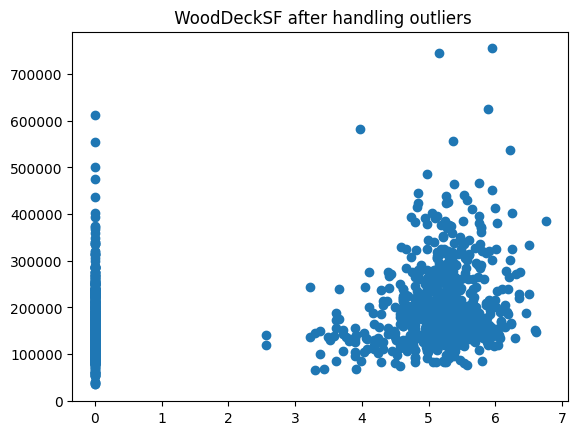

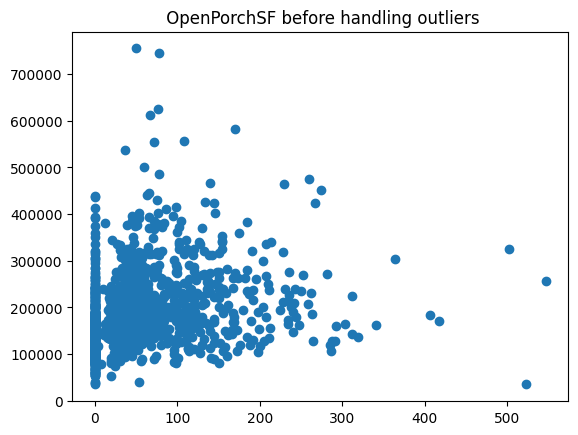

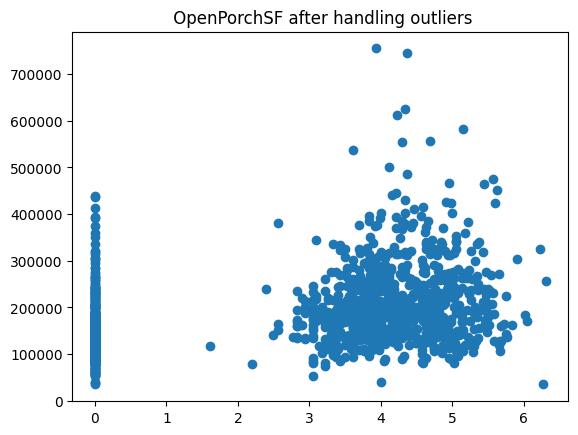

In [65]:
for col in numerical_cols_without_y:
    plt.scatter(df_reduced_log[col], df['SalePrice'])
    plt.title(f' {col} before handling outliers')
    plt.show()
    df_reduced_log[col]=np.log(1+df_reduced_log[col])
    plt.scatter(df_reduced_log[col], df['SalePrice'])
    plt.title(f' {col} after handling outliers')
    plt.show()

Boxplot of numerical columns after handling outliers

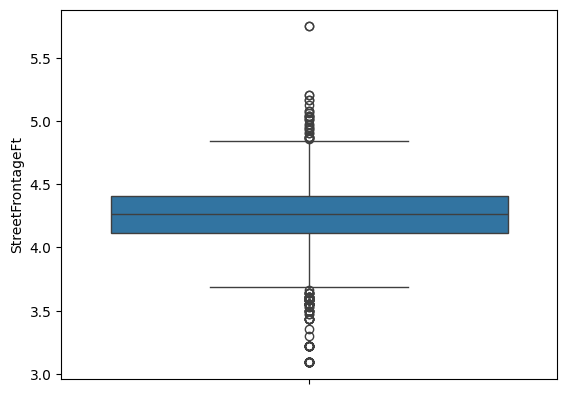

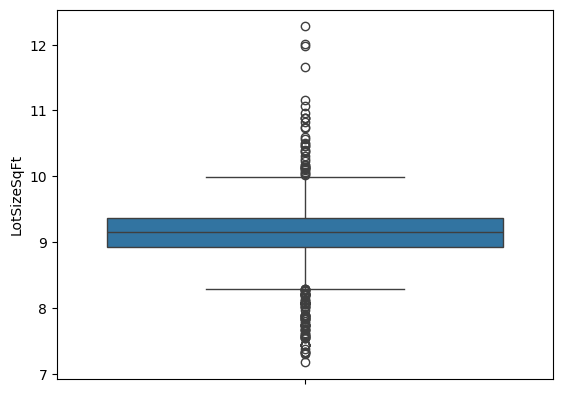

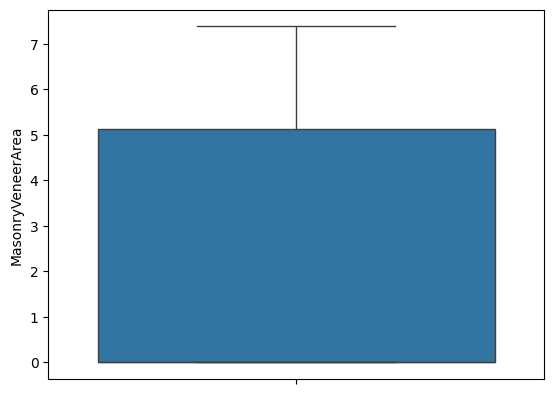

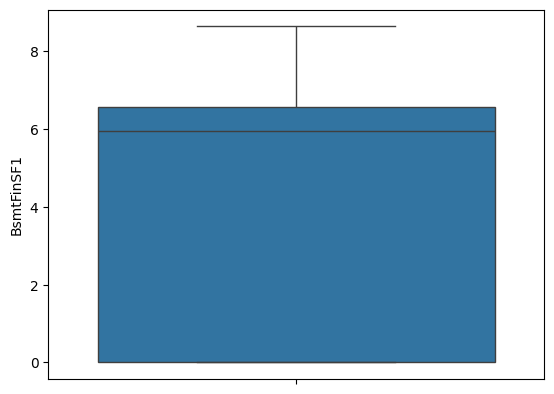

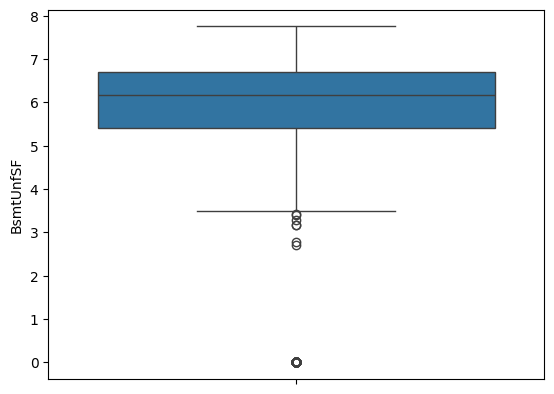

...

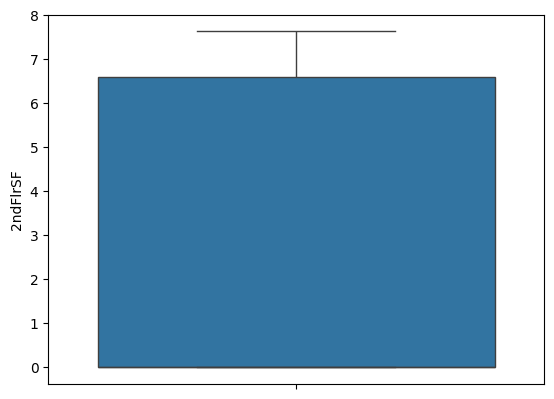

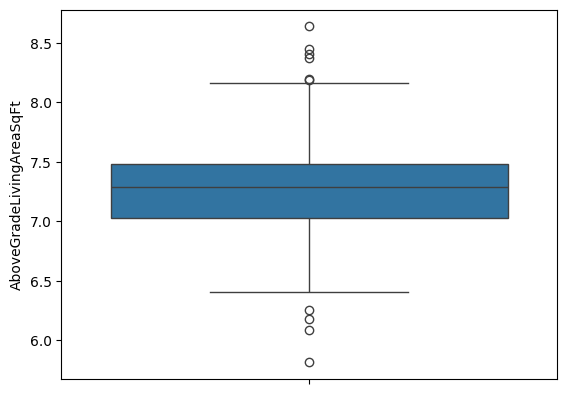

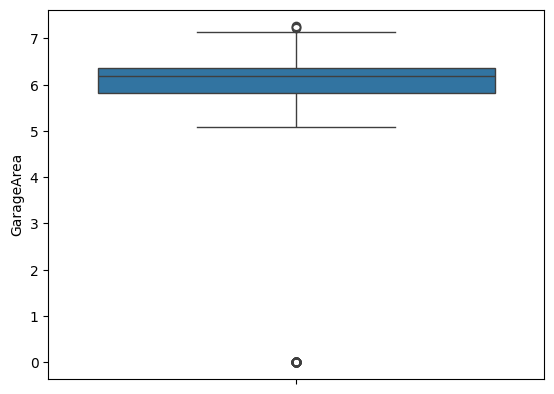

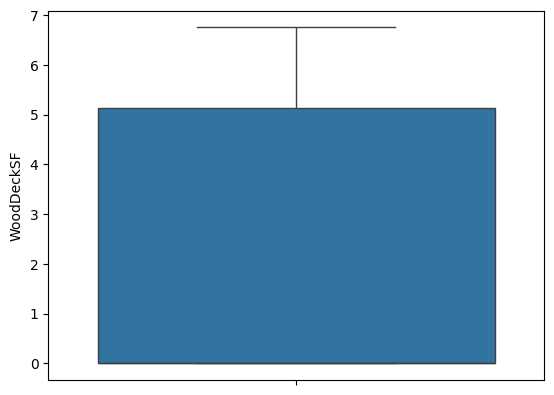

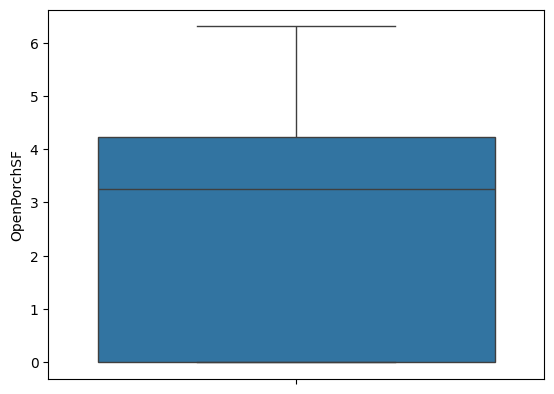

In [66]:
for col in numerical_cols_without_y:
    sns.boxplot(y=df_reduced_log[col])
    plt.show()

#### Second approach: using IQR

In [67]:
len(numerical_cols_without_y)

12

In [68]:
df_reduced_iqr.sample(5)

,DwellingTypeCode,ZoningClassification,StreetFrontageFt,LotSizeSqFt,PropertyShape,LotConfiguration,NeighborhoodName,BuildingType,HouseStyleType,OverallQuality,OverallCondition,YearConstructed,YearRemodAdd,RoofDesign,ExteriorMaterial1,ExteriorMaterial2,MasonryVeneerType,MasonryVeneerArea,ExteriorQuality,FoundationType,BasementQuality,BasementExposureType,BasementFinishType1,BsmtFinSF1,BsmtUnfSF,TotalBsmtSF,HeatingQualityCondition,1stFlrSF,2ndFlrSF,AboveGradeLivingAreaSqFt,BsmtFullBath,FullBath,HalfBath,BedroomsAboveGrade,KitchenQuality,TotalRoomsAboveGrade,Fireplaces,FireplaceQuality,GarageType,GarageYrBlt,GarageFinishType,GarageCapacity,GarageArea,WoodDeckSF,OpenPorchSF,FenceQuality,MonthSold,YrSold,SaleCondition,SalePrice
1407,20.0,RL,62.666667,8780.0,IR1,Corner,Mitchel,1Fam,1Story,5.0,5.0,1985.0,1985.0,Gable,HdBoard,Plywood,No_Veneer,0.0,TA,CBlock,TA,No,ALQ,625.0,208.0,833.0,Ex,833.0,0.0,833.0,1.0,1.0,0.0,3.0,TA,5.0,0.0,No_Fireplace,No_Garage,1959.0,No_Garage,0.0,0.0,0.0,0.0,MnPrv,3.0,2009.0,Normal,112000.0
148,20.0,RL,63.000000,7500.0,Reg,Inside,SawyerW,1Fam,1Story,7.0,5.0,2004.0,2005.0,Gable,VinylSd,VinylSd,BrkFace,120.0,TA,PConc,Gd,No,GLQ,680.0,400.0,1080.0,Ex,1080.0,0.0,1080.0,1.0,1.0,0.0,3.0,Gd,6.0,0.0,No_Fireplace,No_Garage,1962.666667,No_Garage,0.0,0.0,0.0,0.0,No_Fence,4.0,2008.0,Normal,141000.0
169,20.0,RL,86.333333,16669.0,IR1,Corner,Timber,1Fam,1Story,8.0,6.0,1981.0,1981.0,Hip,Plywood,Plywood,BrkFace,653.0,Gd,CBlock,Gd,No,Unf,0.0,1686.0,1686.0,TA,1707.0,0.0,1707.0,0.0,2.0,1.0,2.0,TA,6.0,1.0,TA,Attchd,1981.0,RFn,2.0,511.0,574.0,64.0,No_Fence,1.0,2006.0,Normal,228000.0
707,120.0,RL,48.000000,6240.0,Reg,Inside,NridgHt,TwnhsE,1Story,8.0,5.0,2006.0,2006.0,Hip,MetalSd,MetalSd,BrkFace,176.0,Gd,PConc,Gd,No,GLQ,863.0,461.0,1324.0,Ex,1324.0,0.0,1324.0,1.0,2.0,0.0,2.0,Gd,6.0,1.0,Gd,Attchd,2006.0,Fin,2.0,550.0,192.0,38.0,No_Fence,12.0,2009.0,Normal,254000.0
993,60.0,RL,68.000000,8846.0,Reg,Inside,CollgCr,1Fam,2Story,6.0,5.0,2005.0,2006.0,Gable,VinylSd,VinylSd,No_Veneer,0.0,TA,PConc,Gd,No,Unf,0.0,750.0,750.0,Ex,750.0,750.0,1500.0,0.0,2.0,1.0,3.0,Gd,6.0,0.0,No_Fireplace,Attchd,2005.0,RFn,2.0,564.0,0.0,35.0,No_Fence,8.0,2006.0,Partial,173900.0


In [69]:
df_reduced.sample(5)

,DwellingTypeCode,ZoningClassification,StreetFrontageFt,LotSizeSqFt,PropertyShape,LotConfiguration,NeighborhoodName,BuildingType,HouseStyleType,OverallQuality,OverallCondition,YearConstructed,YearRemodAdd,RoofDesign,ExteriorMaterial1,ExteriorMaterial2,MasonryVeneerType,MasonryVeneerArea,ExteriorQuality,FoundationType,BasementQuality,BasementExposureType,BasementFinishType1,BsmtFinSF1,BsmtUnfSF,TotalBsmtSF,HeatingQualityCondition,1stFlrSF,2ndFlrSF,AboveGradeLivingAreaSqFt,BsmtFullBath,FullBath,HalfBath,BedroomsAboveGrade,KitchenQuality,TotalRoomsAboveGrade,Fireplaces,FireplaceQuality,GarageType,GarageYrBlt,GarageFinishType,GarageCapacity,GarageArea,WoodDeckSF,OpenPorchSF,FenceQuality,MonthSold,YrSold,SaleCondition,SalePrice
210,30.0,RL,67.0,5604.0,Reg,Inside,Edwards,1Fam,1Story,5.0,6.0,1925.0,1950.0,Gable,Stucco,Stucco,No_Veneer,0.0,TA,CBlock,TA,No,Rec,468.0,396.0,864.0,TA,864.0,0.0,864.0,1.0,1.0,0.0,2.0,TA,5.0,0.0,No_Fireplace,No_Garage,1948.333333,No_Garage,0.0,0.0,0.0,0.0,No_Fence,4.0,2008.0,Normal,98000.0
1102,20.0,RL,70.0,7000.0,Reg,Inside,NAmes,1Fam,1Story,5.0,7.0,1960.0,2002.0,Gable,Wd Sdng,Wd Sdng,BrkFace,45.0,TA,CBlock,TA,No,Rec,588.0,422.0,1010.0,Ex,1134.0,0.0,1134.0,0.0,1.0,0.0,2.0,TA,6.0,0.0,No_Fireplace,Attchd,1960.0,RFn,1.0,254.0,0.0,16.0,MnWw,4.0,2007.0,Family,135000.0
173,20.0,RL,80.0,10197.0,IR1,Inside,NAmes,1Fam,1Story,6.0,5.0,1961.0,1961.0,Gable,WdShing,Wd Shng,BrkCmn,491.0,TA,CBlock,TA,No,ALQ,288.0,700.0,1362.0,TA,1362.0,0.0,1362.0,1.0,1.0,1.0,3.0,TA,6.0,1.0,TA,Attchd,1961.0,Unf,2.0,504.0,0.0,20.0,No_Fence,6.0,2008.0,Normal,163000.0
1449,180.0,RM,21.0,1533.0,Reg,Inside,MeadowV,Twnhs,SFoyer,5.0,7.0,1970.0,1970.0,Gable,CemntBd,CmentBd,No_Veneer,0.0,TA,CBlock,Gd,Av,GLQ,553.0,77.0,630.0,Ex,630.0,0.0,630.0,1.0,1.0,0.0,1.0,Ex,3.0,0.0,No_Fireplace,No_Garage,1972.0,No_Garage,0.0,0.0,0.0,0.0,No_Fence,8.0,2006.0,Abnorml,92000.0
1415,120.0,RL,51.0,3635.0,Reg,Inside,Blmngtn,TwnhsE,1Story,7.0,5.0,2007.0,2007.0,Hip,VinylSd,VinylSd,BrkFace,130.0,Gd,PConc,Gd,No,ALQ,988.0,398.0,1386.0,Ex,1569.0,0.0,1569.0,0.0,2.0,0.0,1.0,Gd,7.0,1.0,TA,Attchd,2007.0,RFn,3.0,660.0,143.0,20.0,No_Fence,5.0,2009.0,Normal,175900.0


In [70]:
def treat_outliers(df_reduced, name):
    
    # Calculate the quartiles and IQR
    Q1 = df_reduced[name].quantile(0.25)
    Q3 = df_reduced[name].quantile(0.75)
    IQR = Q3 - Q1
    
    # Determine the lower and upper bounds
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    
    # Identify outliers
    outliers = df_reduced[(df_reduced[name] < lower_bound) | (df_reduced[name] > upper_bound)]
    print(f'Outliers in {name} column:')
    print(outliers)
    print()
    
    # Remove outliers
    df_reduced_iqr[name] = np.where(df_reduced[name] < lower_bound, lower_bound,
                            np.where(df_reduced[name] > upper_bound, upper_bound, df_reduced[name]))    
    return df_reduced_iqr

In [71]:
for name in numerical_cols_without_y :
    df_reduced_iqr = treat_outliers(df_reduced_iqr,name)

Outliers in StreetFrontageFt column:

     DwellingTypeCode ZoningClassification  StreetFrontageFt  LotSizeSqFt  \

36               20.0                   RL        112.000000      10859.0   

41               20.0                   RL        115.000000      16905.0   

56              160.0                   FV         24.000000       2645.0   

75              180.0                   RM         21.000000       1596.0   

85               60.0                   RL        121.000000      16059.0   

86               60.0                   RL        122.000000      11911.0   

145             160.0                   RM         24.000000       2522.0   

150              20.0                   RL        120.000000      10356.0   

159              60.0                   RL        134.000000      19378.0   

171              20.0                   RL        141.000000      31770.0   

177              50.0                   RL        125.333333      13650.0   

193             160.0     

Comparasion between df before and after treat outliers

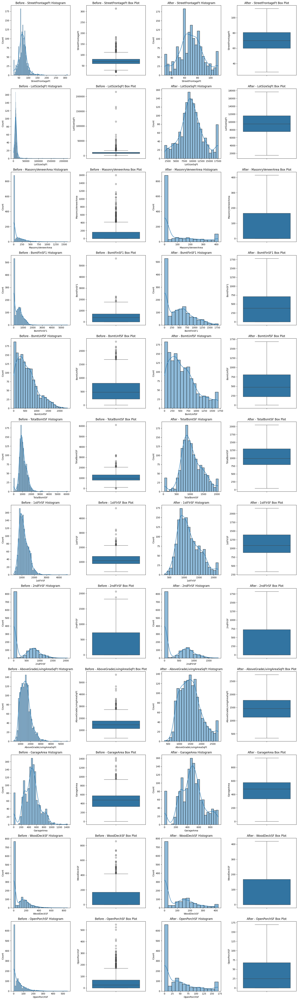

In [72]:
plt.figure(figsize=(18, 60))

for i, col in enumerate(numerical_cols_without_y):
 
    row = i // 1
    col_num = i % 1

    # Plot before treating outliers
    plt.subplot(12, 4, 4*i + 1)
    sns.histplot(df_reduced[col], kde=True)
    plt.title(f'Before - {col} Histogram', fontsize=12)
    plt.tight_layout()

    plt.subplot(12, 4, 4*i + 2)
    sns.boxplot(y=df_reduced[col])
    plt.title(f'Before - {col} Box Plot', fontsize=12)
    plt.tight_layout()

    #Plot after treating outliers
    plt.subplot(12, 4, 4*i + 3)
    sns.histplot(df_reduced_iqr[col], kde=True)
    plt.title(f'After - {col} Histogram', fontsize=12)
    plt.tight_layout()

    plt.subplot(12, 4, 4*i + 4)
    sns.boxplot(y=df_reduced_iqr[col])
    plt.title(f'After - {col} Box Plot', fontsize=12)
    plt.tight_layout()

#### Third approach: dropping outliers

In [73]:
def remove_outliers(df, name):
    # Calculate the quartiles and IQR
    Q1 = df[name].quantile(0.25)
    Q3 = df[name].quantile(0.75)
    IQR = Q3 - Q1
    
    # Determine the lower and upper bounds
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    
    # Identify outliers
    outliers = df[(df[name] < lower_bound) | (df[name] > upper_bound)]
    print(f'Outliers in {name} column:')
    print(outliers)
    print()
    
    # Remove outliers
    df_filtered = df[(df[name] >= lower_bound) & (df[name] <= upper_bound)]
    return df_filtered

In [74]:
for name in numerical_cols_without_y :
    df_reduced_no_outliers = remove_outliers(df_reduced_no_outliers,name)

Outliers in StreetFrontageFt column:

     DwellingTypeCode ZoningClassification  StreetFrontageFt  LotSizeSqFt  \

36               20.0                   RL        112.000000      10859.0   

41               20.0                   RL        115.000000      16905.0   

56              160.0                   FV         24.000000       2645.0   

75              180.0                   RM         21.000000       1596.0   

85               60.0                   RL        121.000000      16059.0   

86               60.0                   RL        122.000000      11911.0   

145             160.0                   RM         24.000000       2522.0   

150              20.0                   RL        120.000000      10356.0   

159              60.0                   RL        134.000000      19378.0   

171              20.0                   RL        141.000000      31770.0   

177              50.0                   RL        125.333333      13650.0   

193             160.0     

---------------------

# Analyzing features relations

In [75]:
#df_reduced_FE = df_reduced.copy()
df_reduced_FE = df_reduced_no_outliers.copy()
#df_reduced_FE = df_reduced_iqr.copy()

In [76]:
numerical_cols = df_reduced_FE.select_dtypes(include='number').columns
categorical_cols = df_reduced_FE.select_dtypes(exclude='number').columns

In [77]:
import random

def xicor(X, Y, ties=True):
    random.seed(42)
    n = len(X)
    order = np.argsort(X)
    sorted_Y = np.array(Y)[order]
    
    if ties:
        ranks = np.argsort(np.argsort(sorted_Y)) + 1  
        l = np.array([np.sum(ranks >= rank) for rank in ranks])
        r = l.copy()

        for j in range(n):
            if np.sum(r == r[j]) > 1:
                tie_indices = np.where(r == r[j])[0]
                random_adjustments = np.random.choice(
                    np.arange(len(tie_indices)), 
                    size=len(tie_indices), 
                    replace=False
                )
                r[tie_indices] = r[tie_indices] - random_adjustments
        
        return 1 - n * np.sum(np.abs(r[1:] - r[:-1])) / (2 * np.sum(l * (n - l)))
    
    else:
        ranks = np.argsort(np.argsort(sorted_Y)) + 1
        return 1 - 3 * np.sum(np.abs(ranks[1:] - ranks[:-1])) / (n**2 - 1)

In [78]:
xi_corr_matrix = pd.DataFrame(index=numerical_cols, columns=numerical_cols)
for i in range(len(numerical_cols)):
    for j in range(i, len(numerical_cols)):
        col1 = numerical_cols[i]
        col2 = numerical_cols[j]
        try:
            correlation = xicor(df_reduced[col1].dropna(), df_reduced[col2].dropna())
            xi_corr_matrix.loc[col1, col2] = correlation
            xi_corr_matrix.loc[col2, col1] = correlation  # Symmetric matrix
        except Exception as e:
            xi_corr_matrix.loc[col1, col2] = f'Error: {e}'
            xi_corr_matrix.loc[col2, col1] = f'Error: {e}'
xi_corr_matrix = xi_corr_matrix.apply(pd.to_numeric, errors='coerce')

In [79]:
xi_corr_matrix

,StreetFrontageFt,LotSizeSqFt,MasonryVeneerArea,BsmtFinSF1,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,AboveGradeLivingAreaSqFt,GarageArea,WoodDeckSF,OpenPorchSF,SalePrice
StreetFrontageFt,0.991613,0.382164,0.233473,0.085648,0.042933,0.148223,0.174751,0.212574,0.109827,0.145139,0.143015,0.126819,0.180014
LotSizeSqFt,0.382164,0.997060,0.272925,0.092825,0.043531,0.117436,0.152391,0.208004,0.141741,0.148317,0.162156,0.143093,0.219907
MasonryVeneerArea,0.233473,0.272925,0.987988,0.082458,0.032811,0.075493,0.084881,0.240190,0.083536,0.098678,0.193594,0.131612,0.123972
BsmtFinSF1,0.085648,0.092825,0.082458,0.993575,0.288848,0.249244,0.195090,0.218356,0.071905,0.118521,0.220799,0.124910,0.165059
BsmtUnfSF,0.042933,0.043531,0.032811,0.288848,0.996612,0.238346,0.152325,0.224688,0.047257,0.074317,0.174703,0.129027,0.067886
TotalBsmtSF,0.148223,0.117436,0.075493,0.249244,0.238346,0.996348,0.670740,0.356123,0.264872,0.183410,0.169839,0.182300,0.308677
1stFlrSF,0.174751,0.152391,0.084881,0.195090,0.152325,0.670740,0.996846,0.322396,0.327022,0.179949,0.175882,0.157644,0.237750
2ndFlrSF,0.212574,0.208004,0.240190,0.218356,0.224688,0.356123,0.322396,0.988196,0.350859,0.096380,0.150944,0.175647,0.178145
AboveGradeLivingAreaSqFt,0.109827,0.141741,0.083536,0.071905,0.047257,0.264872,0.327022,0.350859,0.996976,0.169729,0.191285,0.154719,0.384621
GarageArea,0.145139,0.148317,0.098678,0.118521,0.074317,0.183410,0.179949,0.096380,0.169729,0.994636,0.124032,0.176044,0.383315


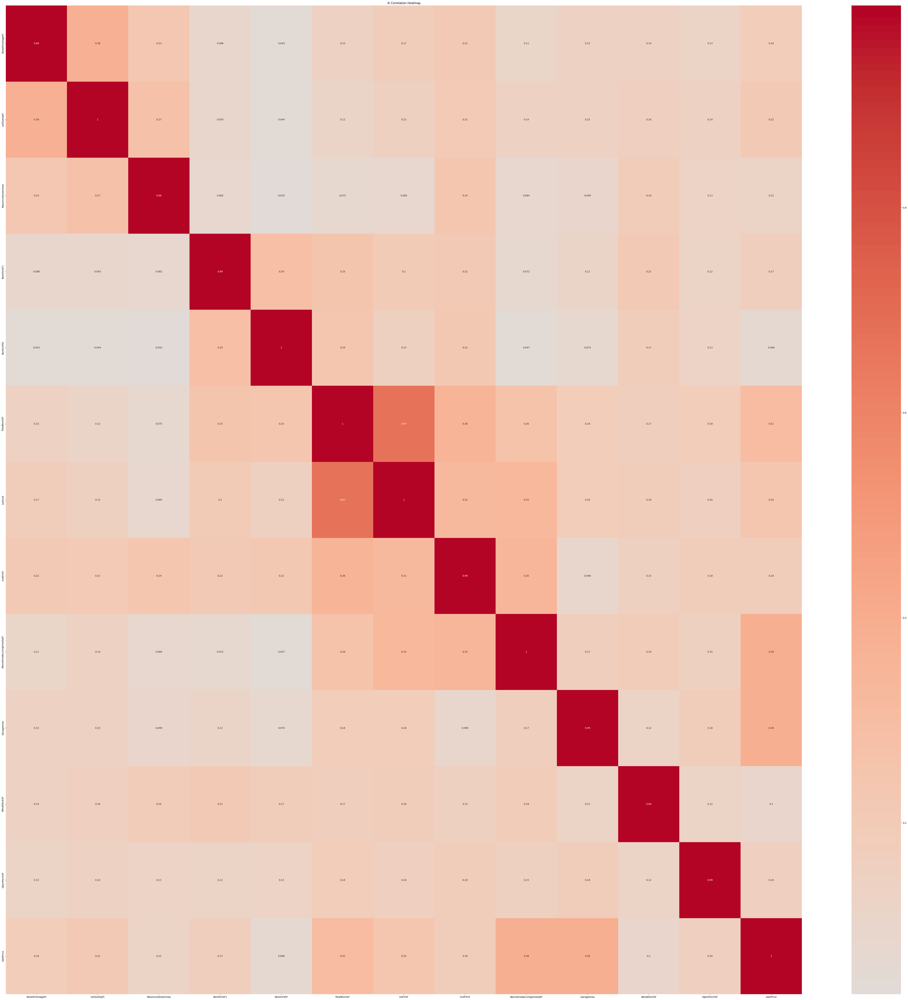

In [80]:
plt.figure(figsize=(75, 75))
sns.heatmap(xi_corr_matrix, annot=True, cmap='coolwarm', center=0)
plt.title('Xi Correlation Heatmap')
plt.show()

In [81]:
threshold = 0.4
cols_to_consider = set()
for i in range(len(xi_corr_matrix.columns)):
    for j in range(i):
        if abs(xi_corr_matrix.iloc[i, j]) >= threshold:
            colname = xi_corr_matrix.columns[i]
            cols_to_consider.add(colname)

print(f"Columns to consider: {cols_to_consider}")

Columns to consider: {'1stFlrSF'}


In [82]:
xi_corr_matrix
sales_price_corr = xi_corr_matrix['SalePrice'].sort_values(ascending=False)
sales_price_corr 

SalePrice                   0.996337
AboveGradeLivingAreaSqFt    0.384621
GarageArea                  0.383315
TotalBsmtSF                 0.308677
1stFlrSF                    0.237750
LotSizeSqFt                 0.219907
StreetFrontageFt            0.180014
2ndFlrSF                    0.178145
BsmtFinSF1                  0.165059
OpenPorchSF                 0.162520
MasonryVeneerArea           0.123972
WoodDeckSF                  0.100534
BsmtUnfSF                   0.067886
Name: SalePrice, dtype: float64

### Feature Engineering

In [83]:
df_reduced_FE['TotalOutdoorArea'] = 0.100534 * df_reduced_FE['WoodDeckSF'] + 0.162520 * df_reduced_FE['OpenPorchSF']
df_reduced_FE['TotalLivingArea'] = 0.237750 * df_reduced_FE['1stFlrSF'] + 0.178145 * df_reduced_FE['2ndFlrSF']
df_reduced_FE['WeightedTotalBsmtFinSF'] = 0.165059 * df_reduced_FE['BsmtFinSF1'] + 0.067886 * df_reduced_FE['BsmtUnfSF'] + 0.308677 * df_reduced_FE['TotalBsmtSF']

In [84]:
df_reduced_FE.drop(columns=['WoodDeckSF', 'OpenPorchSF','1stFlrSF','2ndFlrSF','BsmtFinSF1', 'BsmtUnfSF','TotalBsmtSF'], inplace=True)

In [86]:
df_reduced_FE.shape

(1034, 46)

For df_reduced['WeightedTotalBsmtFinSF']:
try instead to just drop df_reduced['BsmtFinSF1'] and df_reduced['BsmtUnfSF'], and continue with df_reduced['TotalBsmtSF'] instead of a new feature

In [87]:
df_reduced_FE.sample(3)

,DwellingTypeCode,ZoningClassification,StreetFrontageFt,LotSizeSqFt,PropertyShape,LotConfiguration,NeighborhoodName,BuildingType,HouseStyleType,OverallQuality,OverallCondition,YearConstructed,YearRemodAdd,RoofDesign,ExteriorMaterial1,ExteriorMaterial2,MasonryVeneerType,MasonryVeneerArea,ExteriorQuality,FoundationType,BasementQuality,BasementExposureType,BasementFinishType1,HeatingQualityCondition,AboveGradeLivingAreaSqFt,BsmtFullBath,FullBath,HalfBath,BedroomsAboveGrade,KitchenQuality,TotalRoomsAboveGrade,Fireplaces,FireplaceQuality,GarageType,GarageYrBlt,GarageFinishType,GarageCapacity,GarageArea,FenceQuality,MonthSold,YrSold,SaleCondition,SalePrice,TotalOutdoorArea,TotalLivingArea,WeightedTotalBsmtFinSF
1332,20.0,RL,67.000000,8877.0,Reg,Inside,Edwards,1Fam,1Story,4.0,6.0,1938.0,1958.0,Gable,MetalSd,MetalSd,No_Veneer,0.0,TA,CBlock,TA,Mn,ALQ,Ex,816.0,1.0,1.0,0.0,2.0,TA,3.0,1.0,Gd,Detchd,1958.0,Unf,1.0,288.0,No_Fence,5.0,2009.0,Normal,100000.0,0.000000,194.00400,374.324778
1004,120.0,RL,43.000000,3182.0,Reg,Inside,Blmngtn,TwnhsE,1Story,7.0,5.0,2005.0,2006.0,Gable,VinylSd,VinylSd,BrkFace,16.0,Gd,PConc,Gd,No,GLQ,Ex,1504.0,0.0,2.0,0.0,1.0,Gd,7.0,1.0,Gd,Attchd,2005.0,Fin,2.0,457.0,No_Fence,5.0,2009.0,Normal,181000.0,15.683304,357.57600,508.408566
310,60.0,RL,61.333333,7685.0,IR1,Inside,Gilbert,1Fam,2Story,6.0,5.0,1993.0,1994.0,Gable,HdBoard,HdBoard,BrkFace,112.0,TA,PConc,Gd,No,ALQ,Gd,1501.0,0.0,2.0,1.0,3.0,Gd,6.0,1.0,TA,Attchd,1993.0,Fin,2.0,420.0,No_Fence,5.0,2006.0,Normal,165600.0,29.340220,308.94033,312.800025


Analyzing these new features with the SalePrice

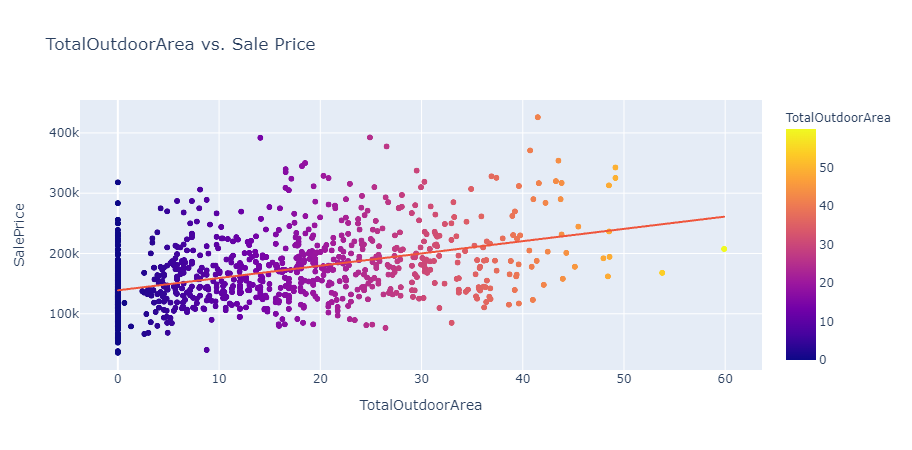

In [88]:
fig = px.scatter(df_reduced_FE, x='TotalOutdoorArea', y='SalePrice', title='TotalOutdoorArea vs. Sale Price', 
                 color='TotalOutdoorArea', trendline='ols')
fig.show()

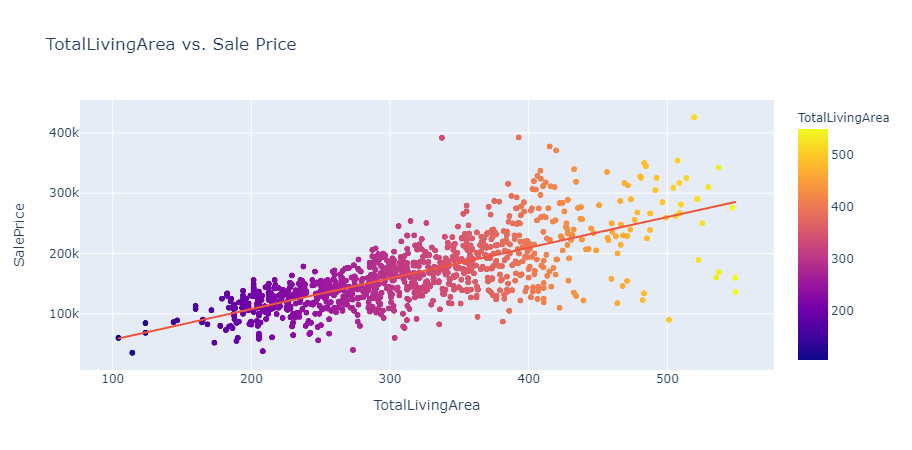

In [89]:
fig = px.scatter(df_reduced_FE, x='TotalLivingArea', y='SalePrice', title='TotalLivingArea vs. Sale Price', 
                 color='TotalLivingArea', trendline='ols')
fig.show()

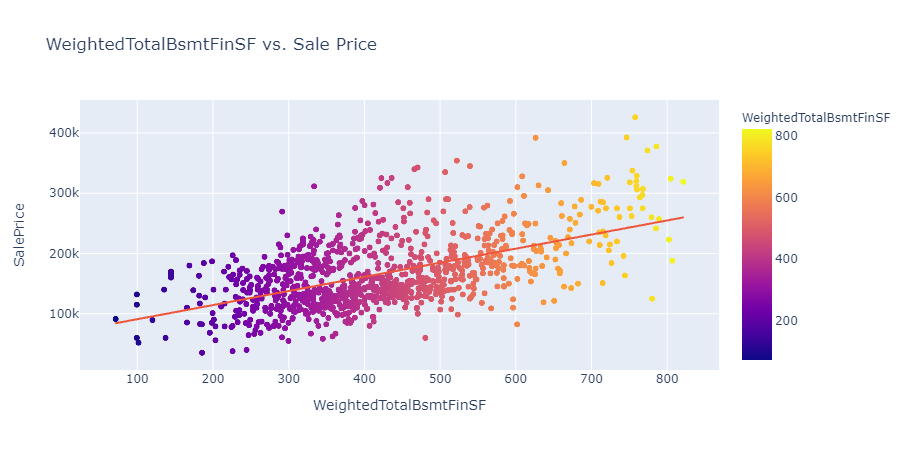

In [90]:
fig = px.scatter(df_reduced_FE, x='WeightedTotalBsmtFinSF', y='SalePrice', title='WeightedTotalBsmtFinSF vs. Sale Price', 
                 color='WeightedTotalBsmtFinSF', trendline='ols')
fig.show()

In [91]:
numerical_cols = df_reduced_FE.select_dtypes(include='number').columns
categorical_cols = df_reduced_FE.select_dtypes(exclude='number').columns

In [92]:
import random

def xicor(X, Y, ties=True):
    random.seed(42)
    n = len(X)
    order = np.argsort(X)
    sorted_Y = np.array(Y)[order]
    
    if ties:
        ranks = np.argsort(np.argsort(sorted_Y)) + 1  
        l = np.array([np.sum(ranks >= rank) for rank in ranks])
        r = l.copy()

        for j in range(n):
            if np.sum(r == r[j]) > 1:
                tie_indices = np.where(r == r[j])[0]
                random_adjustments = np.random.choice(
                    np.arange(len(tie_indices)), 
                    size=len(tie_indices), 
                    replace=False
                )
                r[tie_indices] = r[tie_indices] - random_adjustments
        
        return 1 - n * np.sum(np.abs(r[1:] - r[:-1])) / (2 * np.sum(l * (n - l)))
    
    else:
        ranks = np.argsort(np.argsort(sorted_Y)) + 1
        return 1 - 3 * np.sum(np.abs(ranks[1:] - ranks[:-1])) / (n**2 - 1)

In [139]:
xi_corr_matrix = pd.DataFrame(index=numerical_cols, columns=numerical_cols)
for i in range(len(numerical_cols)):
    for j in range(i, len(numerical_cols)):
        col1 = numerical_cols[i]
        col2 = numerical_cols[j]
        try:
            correlation = xicor(df_reduced_FE[col1].dropna(), df_reduced_FE[col2].dropna())
            xi_corr_matrix.loc[col1, col2] = correlation
            xi_corr_matrix.loc[col2, col1] = correlation  # Symmetric matrix
        except Exception as e:
            xi_corr_matrix.loc[col1, col2] = f'Error: {e}'
            xi_corr_matrix.loc[col2, col1] = f'Error: {e}'
xi_corr_matrix = xi_corr_matrix.apply(pd.to_numeric, errors='coerce')

In [140]:
xi_corr_matrix

,StreetFrontageFt,LotSizeSqFt,MasonryVeneerArea,AboveGradeLivingAreaSqFt,GarageArea,SalePrice,TotalOutdoorArea,TotalLivingArea,WeightedTotalBsmtFinSF
StreetFrontageFt,0.988695,0.300897,0.283427,0.060457,0.110759,0.140037,0.109480,0.083648,0.095936
LotSizeSqFt,0.300897,0.996080,0.293180,0.059183,0.105094,0.145141,0.089754,0.080239,0.061122
MasonryVeneerArea,0.283427,0.293180,0.983650,0.071204,0.069313,0.103655,0.091045,0.083968,0.110684
AboveGradeLivingAreaSqFt,0.060457,0.059183,0.071204,0.996333,0.121012,0.331936,0.083758,0.841107,0.165922
GarageArea,0.110759,0.105094,0.069313,0.121012,0.993016,0.364025,0.119320,0.246601,0.171536
SalePrice,0.140037,0.145141,0.103655,0.331936,0.364025,0.995395,0.162678,0.384629,0.161550
TotalOutdoorArea,0.109480,0.089754,0.091045,0.083758,0.119320,0.162678,0.991175,0.093177,0.090341
TotalLivingArea,0.083648,0.080239,0.083968,0.841107,0.246601,0.384629,0.093177,0.996462,0.190550
WeightedTotalBsmtFinSF,0.095936,0.061122,0.110684,0.165922,0.171536,0.161550,0.090341,0.190550,0.997062


In [141]:
sales_price_corr = xi_corr_matrix['SalePrice'].sort_values(ascending=False)
sales_price_corr

SalePrice                   0.995395
TotalLivingArea             0.384629
GarageArea                  0.364025
AboveGradeLivingAreaSqFt    0.331936
TotalOutdoorArea            0.162678
WeightedTotalBsmtFinSF      0.161550
LotSizeSqFt                 0.145141
StreetFrontageFt            0.140037
MasonryVeneerArea           0.103655
Name: SalePrice, dtype: float64

<Axes: >

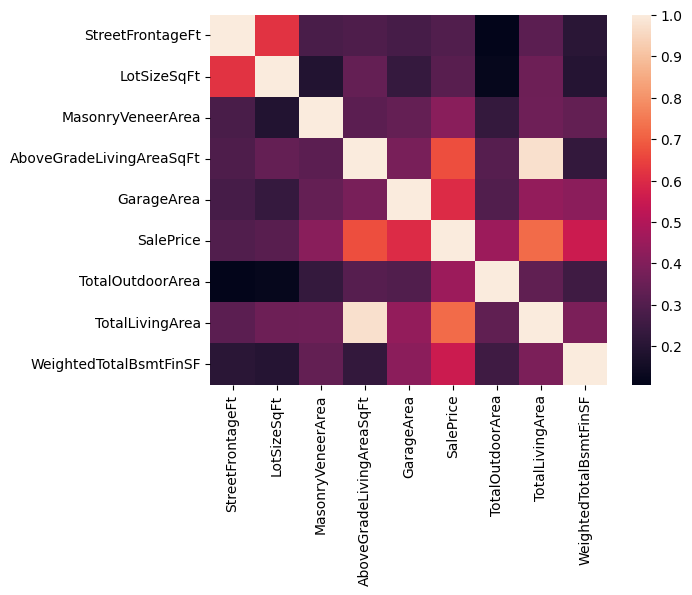

In [96]:
sns.heatmap(df_reduced_FE[numerical_cols].corr())

In [97]:
corr = df_reduced_FE[numerical_cols].corr()
sales_price_corr = corr['SalePrice'].sort_values(ascending=False)
cols = sales_price_corr[sales_price_corr>0.3]
cols

SalePrice                   1.000000
TotalLivingArea             0.721065
AboveGradeLivingAreaSqFt    0.671902
GarageArea                  0.599956
WeightedTotalBsmtFinSF      0.555868
TotalOutdoorArea            0.453143
MasonryVeneerArea           0.414837
LotSizeSqFt                 0.311790
Name: SalePrice, dtype: float64

In [98]:
df_reduced.shape

(1460, 50)

In [99]:
# done previously
df_reduced_FE['SinceRemodel']= abs (df_reduced_FE['YrSold'] -df_reduced_FE['YearRemodAdd'])
df_reduced_FE.drop(columns=['YrSold','YearRemodAdd'], inplace=True)

-------------

---------------

# Data Encoding

check the unique values for the categorical data to know wich type of Encoding we will use 

In [100]:
Target = df_reduced_FE['SalePrice']
#Target = df_reduced_no_outliers['SalePrice']
#Target = df_reduced_iqr['SalePrice']

In [101]:
df_reduced_OHEncode = df_reduced_FE.copy()
df_reduced_Labelencode = df_reduced_FE.copy()
df_reduced_Labelencode_2 = df_reduced_FE.copy()

In [102]:
df_reduced_OHEncode.drop('SalePrice',axis=1, inplace=True)
df_reduced_Labelencode.drop('SalePrice',axis=1, inplace=True)
df_reduced_Labelencode_2.drop('SalePrice',axis=1, inplace=True)

Try them on all different dataframes, as df_reduced_FE, df_reduced_with_outliers, and so on.

For df_reduced_mixed_encode: encode based on feature is nominal or ordinal\
For df_reduced_Labelencode: encode all categorical features with label encoder

In [103]:
numerical_cols = df_reduced_FE.select_dtypes(include='number').columns
categorical_cols = df_reduced_FE.select_dtypes(exclude='number').columns

#### Label encoding

In [104]:
for col in categorical_cols:
    print(col,':')
    print(df_reduced_FE[col].unique())
    print('='*30)

DwellingTypeCode :

[60.0 20.0 70.0 50.0 190.0 45.0 120.0 30.0 85.0 90.0 80.0 75.0 40.0 160.0

 180.0]


ZoningClassification :

['RL' 'RM' 'C (all)' 'FV' 'RH']


PropertyShape :

['Reg' 'IR1' 'IR2' 'IR3']


LotConfiguration :

['Inside' 'FR2' 'Corner' 'CulDSac' 'FR3']


NeighborhoodName :

['CollgCr' 'Veenker' 'Crawfor' 'NoRidge' 'Mitchel' 'Somerst' 'OldTown'

 'BrkSide' 'Sawyer' 'NridgHt' 'NAmes' 'SawyerW' 'IDOTRR' 'MeadowV'

 'Gilbert' 'ClearCr' 'Edwards' 'NWAmes' 'Timber' 'StoneBr' 'Blmngtn'

 'SWISU' 'NPkVill']


BuildingType :

['1Fam' '2fmCon' 'TwnhsE' 'Duplex' 'Twnhs']


HouseStyleType :

['2Story' '1Story' '1.5Fin' '1.5Unf' 'SFoyer' 'SLvl' '2.5Unf' '2.5Fin']


OverallQuality :

[7.0 6.0 8.0 5.0 9.0 4.0 3.0 1.0 10.0 2.0]


OverallCondition :

[5.0 8.0 6.0 7.0 4.0 2.0 3.0 9.0 1.0]


YearConstructed :

[2003.0 1976.0 2001.0 1915.0 2000.0 1993.0 2004.0 1931.0 1939.0 1965.0

 2005.0 1962.0 2006.0 1929.0 1970.0 1958.0 1930.0 1951.0 2007.0 1927.0

 1920.0 1966.0 1959.0 1953.0 1983.0 

columns need maping 

In [105]:
dwelling_mapping = {
    20: '1-STORY 1946 & NEWER ALL STYLES',
    30: '1-STORY 1945 & OLDER',
    40: '1-STORY W/FINISHED ATTIC ALL AGES',
    45: '1-1/2 STORY - UNFINISHED ALL AGES',
    50: '1-1/2 STORY FINISHED ALL AGES',
    60: '2-STORY 1946 & NEWER',
    70: '2-STORY 1945 & OLDER',
    75: '2-1/2 STORY ALL AGES',
    80: 'SPLIT OR MULTI-LEVEL',
    85: 'SPLIT FOYER',
    90: 'DUPLEX - ALL STYLES AND AGES',
    120: '1-STORY PUD - 1946 & NEWER',
    150: '1-1/2 STORY PUD - ALL AGES',
    160: '2-STORY PUD - 1946 & NEWER',
    180: 'PUD - MULTILEVEL - INCL SPLIT LEV/FOYER',
    190: '2 FAMILY CONVERSION - ALL STYLES AND AGES'
}

df_reduced_Labelencode['DwellingTypeCode'] = df_reduced_Labelencode['DwellingTypeCode'].map(dwelling_mapping)

In [106]:
def map_since_remodel(value):
    if pd.isna(value):
        return 'Unknown'  
    if value < 0:
        return 'Invalid'
    elif value <= 5:
        return '0-5 years'
    elif value <= 10:
        return '6-10 years'
    elif value <= 20:
        return '11-20 years'
    elif value <= 30:
        return '21-30 years'
    elif value <= 50:
        return '31-50 years'
    else:
        return '51+ years'


df_reduced_Labelencode['SinceRemodel'] = df_reduced_Labelencode['SinceRemodel'].apply(map_since_remodel)

In [107]:
def categorize_year(year):
    if pd.isna(year) or year < 1872:
        return 'Unknown'
    elif year <= 1900:
        return '1900 or earlier'
    elif year <= 1920:
        return '1901-1920'
    elif year <= 1940:
        return '1921-1940'
    elif year <= 1960:
        return '1941-1960'
    elif year <= 1980:
        return '1961-1980'
    elif year <= 2000:
        return '1981-2000'
    else:
        return '2001 or later'

# Apply the function to the DataFrame
df_reduced_Labelencode['YearConstructed'] = df_reduced_Labelencode['YearConstructed'].apply(categorize_year)

In [108]:
for col in categorical_cols:
    print(col,':')
    print(df_reduced_Labelencode[col].unique())
    print('='*30)

DwellingTypeCode :

['2-STORY 1946 & NEWER' '1-STORY 1946 & NEWER ALL STYLES'

 '2-STORY 1945 & OLDER' '1-1/2 STORY FINISHED ALL AGES'

 '2 FAMILY CONVERSION - ALL STYLES AND AGES'

 '1-1/2 STORY - UNFINISHED ALL AGES' '1-STORY PUD - 1946 & NEWER'

 '1-STORY 1945 & OLDER' 'SPLIT FOYER' 'DUPLEX - ALL STYLES AND AGES'

 'SPLIT OR MULTI-LEVEL' '2-1/2 STORY ALL AGES'

 '1-STORY W/FINISHED ATTIC ALL AGES' '2-STORY PUD - 1946 & NEWER'

 'PUD - MULTILEVEL - INCL SPLIT LEV/FOYER']


ZoningClassification :

['RL' 'RM' 'C (all)' 'FV' 'RH']


PropertyShape :

['Reg' 'IR1' 'IR2' 'IR3']


LotConfiguration :

['Inside' 'FR2' 'Corner' 'CulDSac' 'FR3']


NeighborhoodName :

['CollgCr' 'Veenker' 'Crawfor' 'NoRidge' 'Mitchel' 'Somerst' 'OldTown'

 'BrkSide' 'Sawyer' 'NridgHt' 'NAmes' 'SawyerW' 'IDOTRR' 'MeadowV'

 'Gilbert' 'ClearCr' 'Edwards' 'NWAmes' 'Timber' 'StoneBr' 'Blmngtn'

 'SWISU' 'NPkVill']


BuildingType :

['1Fam' '2fmCon' 'TwnhsE' 'Duplex' 'Twnhs']


HouseStyleType :

['2Story' '1Story' '1

In [109]:
df_reduced_Labelencode.drop(columns=['GarageYrBlt'],inplace=True)

In [110]:
numerical_cols = df_reduced_Labelencode.select_dtypes(include='number').columns
categorical_cols = df_reduced_Labelencode.select_dtypes(exclude='number').columns

In [111]:
df_reduced_Labelencode.sample(3)

,DwellingTypeCode,ZoningClassification,StreetFrontageFt,LotSizeSqFt,PropertyShape,LotConfiguration,NeighborhoodName,BuildingType,HouseStyleType,OverallQuality,OverallCondition,YearConstructed,RoofDesign,ExteriorMaterial1,ExteriorMaterial2,MasonryVeneerType,MasonryVeneerArea,ExteriorQuality,FoundationType,BasementQuality,BasementExposureType,BasementFinishType1,HeatingQualityCondition,AboveGradeLivingAreaSqFt,BsmtFullBath,FullBath,HalfBath,BedroomsAboveGrade,KitchenQuality,TotalRoomsAboveGrade,Fireplaces,FireplaceQuality,GarageType,GarageFinishType,GarageCapacity,GarageArea,FenceQuality,MonthSold,SaleCondition,TotalOutdoorArea,TotalLivingArea,WeightedTotalBsmtFinSF,SinceRemodel
647,1-STORY 1946 & NEWER ALL STYLES,RL,85.000000,10452.0,IR1,Inside,Edwards,1Fam,1Story,6.0,5.0,1941-1960,Hip,Wd Sdng,Wd Sdng,Stone,216.0,TA,CBlock,TA,Mn,Rec,Ex,1094.0,0.0,1.0,0.0,3.0,TA,5.0,2.0,Gd,Attchd,RFn,2.0,495.0,No_Fence,6.0,Normal,0.000000,260.09850,460.546422,51+ years
685,2-STORY PUD - 1946 & NEWER,RL,48.333333,5062.0,IR1,CulDSac,StoneBr,TwnhsE,2Story,7.0,5.0,1981-2000,Gable,HdBoard,HdBoard,No_Veneer,0.0,Gd,CBlock,Gd,Mn,GLQ,Gd,2090.0,1.0,2.0,0.0,3.0,Gd,6.0,1.0,TA,Attchd,Fin,2.0,577.0,No_Fence,9.0,Normal,22.016946,443.25300,516.213962,21-30 years
111,SPLIT OR MULTI-LEVEL,RL,61.000000,7750.0,IR1,Inside,Gilbert,1Fam,SLvl,7.0,5.0,1981-2000,Gable,VinylSd,VinylSd,No_Veneer,0.0,TA,PConc,Gd,No,GLQ,Ex,1430.0,0.0,2.0,1.0,3.0,TA,7.0,1.0,TA,BuiltIn,Fin,2.0,400.0,No_Fence,4.0,Normal,18.096120,300.88162,168.893442,6-10 years


In [112]:
exclude_columns = [
    'MonthSold', 'GarageCapacity', 'BedroomsAboveGrade', 
    'TotalRoomsAboveGrade', 'Fireplaces', 'HalfBath', 
    'FullBath', 'BsmtFullBath', 'OverallCondition', 'OverallQuality'
]

encode_columns = [col for col in df_reduced_Labelencode.columns if col not in exclude_columns]

In [113]:
le = LabelEncoder()

for col in encode_columns:
    df_reduced_Labelencode[col] = le.fit_transform(df_reduced_Labelencode[col].astype(str))

df_reduced_Labelencode.sample(10)

,DwellingTypeCode,ZoningClassification,StreetFrontageFt,LotSizeSqFt,PropertyShape,LotConfiguration,NeighborhoodName,BuildingType,HouseStyleType,OverallQuality,OverallCondition,YearConstructed,RoofDesign,ExteriorMaterial1,ExteriorMaterial2,MasonryVeneerType,MasonryVeneerArea,ExteriorQuality,FoundationType,BasementQuality,BasementExposureType,BasementFinishType1,HeatingQualityCondition,AboveGradeLivingAreaSqFt,BsmtFullBath,FullBath,HalfBath,BedroomsAboveGrade,KitchenQuality,TotalRoomsAboveGrade,Fireplaces,FireplaceQuality,GarageType,GarageFinishType,GarageCapacity,GarageArea,FenceQuality,MonthSold,SaleCondition,TotalOutdoorArea,TotalLivingArea,WeightedTotalBsmtFinSF,SinceRemodel
1171,3,3,98,655,3,4,10,0,2,6.0,6.0,3,3,7,8,2,0,3,1,3,3,0,0,137,1.0,1.0,0.0,3.0,3,6.0,1.0,5,1,2,2.0,111,4,11.0,4,0,308,760,3
861,6,3,95,148,3,4,17,1,2,5.0,4.0,4,3,8,6,2,0,3,2,3,2,1,0,15,1.0,1.0,1.0,3.0,3,6.0,0.0,3,1,3,2.0,164,4,4.0,4,0,131,629,3
331,3,3,85,538,3,4,10,0,2,5.0,6.0,3,1,12,14,2,0,3,1,3,3,4,1,25,1.0,1.0,0.0,3.0,3,6.0,0.0,3,1,2,1.0,52,4,8.0,4,0,144,648,1
55,3,3,0,21,0,4,10,0,2,6.0,5.0,4,1,5,10,1,116,3,1,3,3,1,2,221,0.0,2.0,0.0,3.0,3,7.0,1.0,2,1,2,2.0,213,4,7.0,4,0,442,821,3
864,3,1,90,589,3,4,19,0,2,7.0,5.0,6,1,11,13,2,0,2,2,0,3,5,0,195,0.0,2.0,0.0,3.0,2,6.0,0.0,3,1,0,2.0,182,4,5.0,5,178,405,720,0
788,3,4,43,392,3,0,15,0,2,4.0,7.0,3,1,7,8,2,0,3,1,3,3,5,0,607,0.0,1.0,0.0,2.0,3,4.0,0.0,3,5,3,1.0,37,4,8.0,4,0,61,246,5
975,10,1,21,304,3,2,19,3,5,7.0,5.0,5,1,7,8,2,0,2,2,2,3,2,0,201,1.0,2.0,1.0,3.0,2,6.0,0.0,3,5,3,2.0,154,4,4.0,4,188,249,181,5
152,9,3,115,274,0,1,12,0,5,6.0,5.0,4,1,5,6,1,104,3,1,3,3,4,2,473,0.0,2.0,1.0,4.0,3,8.0,1.0,2,1,2,2.0,158,1,6.0,4,12,711,280,3
812,3,0,74,593,3,4,7,0,2,5.0,5.0,3,3,12,14,2,0,1,1,3,0,5,4,18,0.0,1.0,0.0,2.0,1,4.0,0.0,3,2,3,2.0,164,4,6.0,2,0,136,22,4
329,8,4,59,408,3,0,7,0,5,5.0,5.0,1,1,12,15,2,0,3,2,3,2,5,4,100,0.0,1.0,0.0,3.0,3,6.0,0.0,3,5,3,1.0,5,1,7.0,4,0,135,29,4


In [114]:
df_reduced_Labelencode = df_reduced_Labelencode.astype(float)

In [115]:
df_reduced_Labelencode.info()

<class 'pandas.core.frame.DataFrame'>

Index: 1034 entries, 0 to 1458

Data columns (total 43 columns):

 #   Column                    Non-Null Count  Dtype  

---  ------                    --------------  -----  

 0   DwellingTypeCode          1034 non-null   float64

 1   ZoningClassification      1034 non-null   float64

 2   StreetFrontageFt          1034 non-null   float64

 3   LotSizeSqFt               1034 non-null   float64

 4   PropertyShape             1034 non-null   float64

 5   LotConfiguration          1034 non-null   float64

 6   NeighborhoodName          1034 non-null   float64

 7   BuildingType              1034 non-null   float64

 8   HouseStyleType            1034 non-null   float64

 9   OverallQuality            1034 non-null   float64

 10  OverallCondition          1034 non-null   float64

 11  YearConstructed           1034 non-null   float64

 12  RoofDesign                1034 non-null   float64

 13  ExteriorMaterial1         1034 non-null   float64


#### Label encoding for all categorical

In [116]:
numerical_cols = df_reduced_FE.select_dtypes(include='number').columns
categorical_cols = df_reduced_FE.select_dtypes(exclude='number').columns

In [117]:
le = LabelEncoder()

for col in categorical_cols:
    df_reduced_Labelencode_2[col] = le.fit_transform(df_reduced_Labelencode_2[col].astype(str))


df_reduced_Labelencode_2.sample(5)

,DwellingTypeCode,ZoningClassification,StreetFrontageFt,LotSizeSqFt,PropertyShape,LotConfiguration,NeighborhoodName,BuildingType,HouseStyleType,OverallQuality,OverallCondition,YearConstructed,RoofDesign,ExteriorMaterial1,ExteriorMaterial2,MasonryVeneerType,MasonryVeneerArea,ExteriorQuality,FoundationType,BasementQuality,BasementExposureType,BasementFinishType1,HeatingQualityCondition,AboveGradeLivingAreaSqFt,BsmtFullBath,FullBath,HalfBath,BedroomsAboveGrade,KitchenQuality,TotalRoomsAboveGrade,Fireplaces,FireplaceQuality,GarageType,GarageYrBlt,GarageFinishType,GarageCapacity,GarageArea,FenceQuality,MonthSold,SaleCondition,TotalOutdoorArea,TotalLivingArea,WeightedTotalBsmtFinSF,SinceRemodel
11,9,3,85.0,11924.0,0,4,14,0,5,9,4,100,3,13,15,3,286.0,0,2,0,3,2,0,2324.0,1,3,0,4,0,1,2,2,3,114,0,3,736.0,4,9,5,18.191418,484.462090,539.440179,0
842,12,3,82.0,9020.0,3,4,10,0,7,6,6,61,1,5,6,1,183.0,3,1,3,1,4,4,1165.0,1,1,1,3,3,6,0,3,1,69,2,2,490.0,0,7,4,20.965080,276.978750,418.113923,37
463,10,3,74.0,11988.0,0,4,4,0,5,6,6,31,3,10,12,2,0.0,3,1,3,3,3,1,1660.0,0,1,1,3,3,6,1,2,5,28,3,1,240.0,4,10,4,0.000000,346.325345,300.920943,5
795,9,3,70.0,8400.0,3,4,18,0,5,6,5,75,1,5,6,1,130.0,3,1,2,3,5,4,1564.0,0,2,1,3,3,7,1,5,1,87,3,2,476.0,2,6,4,8.126000,331.548020,244.765950,22
1352,8,4,50.0,6000.0,3,4,1,0,0,6,8,34,1,7,8,2,0.0,2,0,3,3,5,4,1176.0,0,1,0,2,3,4,0,3,5,108,3,2,624.0,4,9,4,21.112140,256.348050,262.840974,60


In [118]:
df_reduced_Labelencode_2.info()

<class 'pandas.core.frame.DataFrame'>

Index: 1034 entries, 0 to 1458

Data columns (total 44 columns):

 #   Column                    Non-Null Count  Dtype  

---  ------                    --------------  -----  

 0   DwellingTypeCode          1034 non-null   int32  

 1   ZoningClassification      1034 non-null   int32  

 2   StreetFrontageFt          1034 non-null   float64

 3   LotSizeSqFt               1034 non-null   float64

 4   PropertyShape             1034 non-null   int32  

 5   LotConfiguration          1034 non-null   int32  

 6   NeighborhoodName          1034 non-null   int32  

 7   BuildingType              1034 non-null   int32  

 8   HouseStyleType            1034 non-null   int32  

 9   OverallQuality            1034 non-null   int32  

 10  OverallCondition          1034 non-null   int32  

 11  YearConstructed           1034 non-null   int32  

 12  RoofDesign                1034 non-null   int32  

 13  ExteriorMaterial1         1034 non-null   int32  


#### OneHot encoding for all categorical

In [119]:
df_reduced_OHEncode = pd.get_dummies(df_reduced_OHEncode ,columns=categorical_cols).astype('int64')

In [120]:
df_reduced_OHEncode.shape

(1034, 527)

In [121]:
df_reduced_OHEncode.sample(3)

,StreetFrontageFt,LotSizeSqFt,MasonryVeneerArea,AboveGradeLivingAreaSqFt,GarageArea,TotalOutdoorArea,TotalLivingArea,WeightedTotalBsmtFinSF,DwellingTypeCode_20.0,DwellingTypeCode_30.0,DwellingTypeCode_40.0,DwellingTypeCode_45.0,DwellingTypeCode_50.0,DwellingTypeCode_60.0,DwellingTypeCode_70.0,DwellingTypeCode_75.0,DwellingTypeCode_80.0,DwellingTypeCode_85.0,DwellingTypeCode_90.0,DwellingTypeCode_120.0,DwellingTypeCode_160.0,DwellingTypeCode_180.0,DwellingTypeCode_190.0,ZoningClassification_C (all),ZoningClassification_FV,ZoningClassification_RH,ZoningClassification_RL,ZoningClassification_RM,PropertyShape_IR1,PropertyShape_IR2,PropertyShape_IR3,PropertyShape_Reg,LotConfiguration_Corner,LotConfiguration_CulDSac,LotConfiguration_FR2,LotConfiguration_FR3,LotConfiguration_Inside,NeighborhoodName_Blmngtn,NeighborhoodName_BrkSide,NeighborhoodName_ClearCr,NeighborhoodName_CollgCr,NeighborhoodName_Crawfor,NeighborhoodName_Edwards,NeighborhoodName_Gilbert,NeighborhoodName_IDOTRR,NeighborhoodName_MeadowV,NeighborhoodName_Mitchel,NeighborhoodName_NAmes,NeighborhoodName_NPkVill,NeighborhoodName_NWAmes,NeighborhoodName_NoRidge,NeighborhoodName_NridgHt,NeighborhoodName_OldTown,NeighborhoodName_SWISU,NeighborhoodName_Sawyer,NeighborhoodName_SawyerW,NeighborhoodName_Somerst,NeighborhoodName_StoneBr,NeighborhoodName_Timber,NeighborhoodName_Veenker,BuildingType_1Fam,BuildingType_2fmCon,BuildingType_Duplex,BuildingType_Twnhs,BuildingType_TwnhsE,HouseStyleType_1.5Fin,HouseStyleType_1.5Unf,HouseStyleType_1Story,HouseStyleType_2.5Fin,HouseStyleType_2.5Unf,HouseStyleType_2Story,HouseStyleType_SFoyer,HouseStyleType_SLvl,OverallQuality_1.0,OverallQuality_2.0,OverallQuality_3.0,OverallQuality_4.0,OverallQuality_5.0,OverallQuality_6.0,OverallQuality_7.0,OverallQuality_8.0,OverallQuality_9.0,OverallQuality_10.0,OverallCondition_1.0,OverallCondition_2.0,OverallCondition_3.0,OverallCondition_4.0,OverallCondition_5.0,OverallCondition_6.0,OverallCondition_7.0,OverallCondition_8.0,OverallCondition_9.0,YearConstructed_1872.0,YearConstructed_1875.0,YearConstructed_1880.0,YearConstructed_1885.0,YearConstructed_1890.0,YearConstructed_1900.0,YearConstructed_1904.0,YearConstructed_1905.0,YearConstructed_1906.0,YearConstructed_1908.0,YearConstructed_1910.0,YearConstructed_1913.0,YearConstructed_1914.0,YearConstructed_1915.0,YearConstructed_1916.0,YearConstructed_1917.0,YearConstructed_1918.0,YearConstructed_1919.0,YearConstructed_1920.0,YearConstructed_1921.0,YearConstructed_1922.0,YearConstructed_1923.0,YearConstructed_1924.0,YearConstructed_1925.0,YearConstructed_1926.0,YearConstructed_1927.0,YearConstructed_1928.0,YearConstructed_1929.0,YearConstructed_1930.0,YearConstructed_1931.0,YearConstructed_1932.0,YearConstructed_1934.0,YearConstructed_1935.0,YearConstructed_1936.0,YearConstructed_1937.0,YearConstructed_1938.0,YearConstructed_1939.0,YearConstructed_1940.0,YearConstructed_1941.0,YearConstructed_1942.0,YearConstructed_1945.0,YearConstructed_1946.0,YearConstructed_1947.0,YearConstructed_1948.0,YearConstructed_1949.0,YearConstructed_1950.0,YearConstructed_1951.0,YearConstructed_1952.0,YearConstructed_1953.0,YearConstructed_1954.0,YearConstructed_1955.0,YearConstructed_1956.0,YearConstructed_1957.0,YearConstructed_1958.0,YearConstructed_1959.0,YearConstructed_1960.0,YearConstructed_1961.0,YearConstructed_1962.0,YearConstructed_1963.0,YearConstructed_1964.0,YearConstructed_1965.0,YearConstructed_1966.0,YearConstructed_1967.0,YearConstructed_1968.0,YearConstructed_1969.0,YearConstructed_1970.0,YearConstructed_1971.0,YearConstructed_1972.0,YearConstructed_1973.0,YearConstructed_1974.0,YearConstructed_1975.0,YearConstructed_1976.0,YearConstructed_1977.0,YearConstructed_1978.0,YearConstructed_1979.0,YearConstructed_1980.0,YearConstructed_1981.0,YearConstructed_1982.0,YearConstructed_1983.0,YearConstructed_1984.0,YearConstructed_1985.0,YearConstructed_1986.0,YearConstructed_1987.0,YearConstructed_1988.0,YearConstructed_1989.0,YearConstructed_1990.0,YearConstructed_19

------------------------------

# Scaling

method1 ===> Z-Score \
method2 ===> min-max \
method3 ===> robust

In [122]:
def scaleing(df):

    from sklearn.preprocessing import StandardScaler, MinMaxScaler, RobustScaler
    

    standard_scaler = StandardScaler()
    minmax_scaler = MinMaxScaler()
    robust_scaler = RobustScaler()
    
    df_standard = pd.DataFrame(standard_scaler.fit_transform(df), columns=df.columns, index=df.index)
    
    df_minmax = pd.DataFrame(minmax_scaler.fit_transform(df), columns=df.columns, index=df.index)
    
    df_robust = pd.DataFrame(robust_scaler.fit_transform(df), columns=df.columns, index=df.index)
    
    # Return the scaled in a dictionary
    return {
        'standard': df_standard,
        'minmax': df_minmax,
        'robust': df_robust
    }


In [123]:
df_reduced_label= scaleing(df_reduced_Labelencode)

df_standard_label = df_reduced_label['standard']
df_minmax_label = df_reduced_label['minmax']
df_robust_label = df_reduced_label['robust']

In [124]:
df_reduced_label2= scaleing(df_reduced_Labelencode_2)

df_standard_label_v2 = df_reduced_label2['standard']
df_minmax_label_v2 = df_reduced_label2['minmax']
df_robust_label_v2 = df_reduced_label2['robust']

In [125]:
df_reduced_OHE= scaleing(df_reduced_OHEncode)

df_standard_OHE = df_reduced_OHE['standard']
df_minmax_OHE = df_reduced_OHE['minmax']
df_robust_OHE = df_reduced_OHE['robust']

In [126]:
# df_reduced_mix = scaleing(df_reduced_mixed_encode)

# df_standard_mix = df_reduced_mix['standard']
# df_minmax_mix = df_reduced_mix['minmax']
# df_robust_mix = df_reduced_mix['robust']

-----------------

# Modelling and Testing

In [127]:
Target2 = np.log(Target)

### Names of dataframes
df --> only nulls filled, no dropping columns, no feature engineering\
df_reduced --> df + dropping dominant columns\
df_reduced_with_outliers --> df_reduced with outliers\
df_reduced_log --> df_reduced + log for outliers\
df_reduced_iqr --> df_reduced + IQR for outliers\
df_reduced_no_outliers --> df_Reduced + no outliers\
df_reduced_FE --> df_reduced + feature engineering\
df_reduced_OHEncode --> df_reduced_FE + one hot encoding\
df_reduced_Labelencode --> df_reduced_FE + label encoding (some manually)\
df_reduced_Labelencode_2 --> df_reduced_FE + label encoding (all algorithm)\


Check:\
df_standard_label\
df_minmax_label\
df_robust_label\
df_standard_label_v2\
df_minmax_label_v2\
df_robust_label_v2\
df_standard_OHE\
df_minmax_OHE\
df_robust_OHE

#### with Feature Engineering and otuliers as it is

In [128]:
#### Evaluation Metrices
'''

* labelEncode + standard scaling:
Train Mean Squared Error: 0.017
Train R-squared: 88.63%
Test Mean Squared Error: 0.024
Test R-squared: 87.14%
other 2 scaling same results

-----------------------------------------------------
* labelEncode_v2 + standard scaling:
Train Mean Squared Error: 0.020
Train R-squared: 86.87%
Test Mean Squared Error: 0.027
Test R-squared: 85.35%
again other 2 scaling same results
--------------------------------------------------------

* OneHotEncode + standard scaling:
overfitting
Train Mean Squared Error: 0.008
Train R-squared: 95.02%
Test Mean Squared Error: 13939949599991406592.000
Test R-squared: -7470058277592117542912.00%
'''

'\n\n* labelEncode + standard scaling:\nTrain Mean Squared Error: 0.017\nTrain R-squared: 88.63%\nTest Mean Squared Error: 0.024\nTest R-squared: 87.14%\nother 2 scaling same results\n\n-----------------------------------------------------\n* labelEncode_v2 + standard scaling:\nTrain Mean Squared Error: 0.020\nTrain R-squared: 86.87%\nTest Mean Squared Error: 0.027\nTest R-squared: 85.35%\nagain other 2 scaling same results\n--------------------------------------------------------\n\n* OneHotEncode + standard scaling:\noverfitting\nTrain Mean Squared Error: 0.008\nTrain R-squared: 95.02%\nTest Mean Squared Error: 13939949599991406592.000\nTest R-squared: -7470058277592117542912.00%\n'

#### with Feature Engineering and dropping otuliers

In [129]:
#### Evaluation Metrices
'''
----------------------------------------------------
* labelEncode + standard scaling:
Train Mean Squared Error: 0.014
Train R-squared: 87.95%
Test Mean Squared Error: 0.018
Test R-squared: 83.11%
other 2 scaling same results

------------------------------------------------------
* labelEncode_v2 + standard scaling:
Train Mean Squared Error: 0.013
Train R-squared: 88.78%
Test Mean Squared Error: 0.017
Test R-squared: 83.78%
again other 2 scaling same results

------------------------------------------------------
* OneHotEncode + standard scaling:
overfitting
Train Mean Squared Error: 0.003
Train R-squared: 97.00%
Test Mean Squared Error: 1258772027645549812383744.000
Test R-squared: -1196295112829869419342594048.00%
'''

'\n----------------------------------------------------\n* labelEncode + standard scaling:\nTrain Mean Squared Error: 0.014\nTrain R-squared: 87.95%\nTest Mean Squared Error: 0.018\nTest R-squared: 83.11%\nother 2 scaling same results\n\n------------------------------------------------------\n* labelEncode_v2 + standard scaling:\nTrain Mean Squared Error: 0.013\nTrain R-squared: 88.78%\nTest Mean Squared Error: 0.017\nTest R-squared: 83.78%\nagain other 2 scaling same results\n\n------------------------------------------------------\n* OneHotEncode + standard scaling:\noverfitting\nTrain Mean Squared Error: 0.003\nTrain R-squared: 97.00%\nTest Mean Squared Error: 1258772027645549812383744.000\nTest R-squared: -1196295112829869419342594048.00%\n'

#### with Feature Engineering and otuliers handled with IQR

In [130]:
#### Evaluation Metrices
'''
----------------------------------------------------
* labelEncode + standard scaling:
Train Mean Squared Error: 0.018
Train R-squared: 88.06%
Test Mean Squared Error: 0.023
Test R-squared: 87.61%
other 2 scaling same results

----------------------------------------------------
* labelEncode_v2 + standard scaling:
Train Mean Squared Error: 0.017
Train R-squared: 88.90%
Test Mean Squared Error: 0.024
Test R-squared: 87.25%
again other 2 scaling same results

----------------------------------------------------
* OneHotEncode + standard scaling:
overfitting
Train Mean Squared Error: 0.007
Train R-squared: 95.67%
Test Mean Squared Error: 368356255597695205376.000
Test R-squared: -197392585711507640156160.00%
'''

'\n----------------------------------------------------\n* labelEncode + standard scaling:\nTrain Mean Squared Error: 0.018\nTrain R-squared: 88.06%\nTest Mean Squared Error: 0.023\nTest R-squared: 87.61%\nother 2 scaling same results\n\n----------------------------------------------------\n* labelEncode_v2 + standard scaling:\nTrain Mean Squared Error: 0.017\nTrain R-squared: 88.90%\nTest Mean Squared Error: 0.024\nTest R-squared: 87.25%\nagain other 2 scaling same results\n\n----------------------------------------------------\n* OneHotEncode + standard scaling:\noverfitting\nTrain Mean Squared Error: 0.007\nTrain R-squared: 95.67%\nTest Mean Squared Error: 368356255597695205376.000\nTest R-squared: -197392585711507640156160.00%\n'

#### without Feature Engineering and otuliers as it is

In [131]:
#### Evaluation Metrices
'''
----------------------------------------------------
* labelEncode + standard scaling:
Train Mean Squared Error: 0.021
Train R-squared: 86.04%
Test Mean Squared Error: 0.027
Test R-squared: 85.28%
other 2 scaling same results

----------------------------------------------------
* labelEncode_v2 + standard scaling:
Train Mean Squared Error: 0.020
Train R-squared: 86.98%
Test Mean Squared Error: 0.027
Test R-squared: 85.45%
again other 2 scaling same results

----------------------------------------------------
* OneHotEncode + standard scaling:
overfitting
Train Mean Squared Error: 0.007
Train R-squared: 95.12%
Test Mean Squared Error: 1771203170020542644224.000
Test R-squared: -949141946791364925587456.00%
'''

'\n----------------------------------------------------\n* labelEncode + standard scaling:\nTrain Mean Squared Error: 0.021\nTrain R-squared: 86.04%\nTest Mean Squared Error: 0.027\nTest R-squared: 85.28%\nother 2 scaling same results\n\n----------------------------------------------------\n* labelEncode_v2 + standard scaling:\nTrain Mean Squared Error: 0.020\nTrain R-squared: 86.98%\nTest Mean Squared Error: 0.027\nTest R-squared: 85.45%\nagain other 2 scaling same results\n\n----------------------------------------------------\n* OneHotEncode + standard scaling:\noverfitting\nTrain Mean Squared Error: 0.007\nTrain R-squared: 95.12%\nTest Mean Squared Error: 1771203170020542644224.000\nTest R-squared: -949141946791364925587456.00%\n'

************************

### Ridge 

In [132]:
X_train, X_test, y_train, y_test = train_test_split(df_standard_OHE, Target2, test_size=0.2, random_state=42)

ridge_model = Ridge(alpha=0.002)  
ridge_model.fit(X_train, y_train)


y_train_pred_ridge = ridge_model.predict(X_train)
y_test_pred_ridge = ridge_model.predict(X_test)


train_mse_ridge = mean_squared_error(y_train, y_train_pred_ridge)
train_r2_ridge = r2_score(y_train, y_train_pred_ridge)
train_r2_percentage_ridge = train_r2_ridge * 100

test_mse_ridge = mean_squared_error(y_test, y_test_pred_ridge)
test_r2_ridge = r2_score(y_test, y_test_pred_ridge)
test_r2_percentage_ridge = test_r2_ridge * 100


print("Ridge Regression Evaluation Metrics:")
print("------------------------------------")
print(f"Train Mean Squared Error: {train_mse_ridge:.3f}")
print(f"Train R-squared: {train_r2_percentage_ridge:.2f}%")
print(f"Test Mean Squared Error: {test_mse_ridge:.3f}")
print(f"Test R-squared: {test_r2_percentage_ridge:.2f}%")


Ridge Regression Evaluation Metrics:

------------------------------------

Train Mean Squared Error: 0.003

Train R-squared: 97.01%

Test Mean Squared Error: 0.035

Test R-squared: 66.42%


---------------------------------------

### Lasso

In [133]:
X_train, X_test, y_train, y_test = train_test_split(df_standard_OHE, Target2, test_size=0.2, random_state=42)

lasso_model = Lasso(alpha=0.002)  
lasso_model.fit(X_train, y_train)


y_train_pred_lasso = lasso_model.predict(X_train)
y_test_pred_lasso = lasso_model.predict(X_test)


train_mse_lasso = mean_squared_error(y_train, y_train_pred_lasso)
train_r2_lasso = r2_score(y_train, y_train_pred_lasso)
train_r2_percentage_lasso = train_r2_lasso * 100

test_mse_lasso = mean_squared_error(y_test, y_test_pred_lasso)
test_r2_lasso = r2_score(y_test, y_test_pred_lasso)
test_r2_percentage_lasso = test_r2_lasso * 100


print("Lasso Regression Evaluation Metrics:")
print("------------------------------------")
print(f"Train Mean Squared Error: {train_mse_lasso:.3f}")
print(f"Train R-squared: {train_r2_percentage_lasso:.2f}%")
print(f"Test Mean Squared Error: {test_mse_lasso:.3f}")
print(f"Test R-squared: {test_r2_percentage_lasso:.2f}%")


Lasso Regression Evaluation Metrics:

------------------------------------

Train Mean Squared Error: 0.006

Train R-squared: 95.00%

Test Mean Squared Error: 0.018

Test R-squared: 82.99%


In [134]:
# Lasso Regression Evaluation Metrics:(FE + exist_outliers + df_standard + OHE ) ===> the best
# ------------------------------------
# Train Mean Squared Error: 0.010
# Train R-squared: 93.43%
# Test Mean Squared Error: 0.021
# Test R-squared: 88.51%


# (Lasso Regression) Evaluation Metrics:(FE + IQR + df_standard + OHE )
# ------------------------------------
# Train Mean Squared Error: 0.009
# Train R-squared: 94.22%
# Test Mean Squared Error: 0.020
# Test R-squared: 89.34%


# Lasso Regression Evaluation Metrics:(NO-FE + drop_outliers + df_standard + OHE )
# ------------------------------------
# Train Mean Squared Error: 0.006
# Train R-squared: 95.11%
# Test Mean Squared Error: 0.018
# Test R-squared: 83.03%


# Lasso Regression Evaluation Metrics:(FE + drop_outliers + df_standard + OHE )
# ------------------------------------
# Train Mean Squared Error: 0.006
# Train R-squared: 95.00%
# Test Mean Squared Error: 0.018
# Test R-squared: 82.98%

-----------------------------

### PCA 

In [135]:
X_train, X_test, y_train, y_test = train_test_split(df_robust_label ,Target2, test_size=0.2, random_state=42)


pca = PCA()
X_train_pca = pca.fit_transform(X_train)
X_test_pca = pca.transform(X_test)


# plt.figure(figsize=(8, 6))
# plt.plot(range(1, len(pca.explained_variance_ratio_) + 1), pca.explained_variance_ratio_, marker='o')
# plt.xlabel('Number of Components')
# plt.ylabel('Variance Ratio')
# plt.title('Scree Plot')
# plt.grid(True)
# plt.show()


cumul_ratio = np.cumsum(pca.explained_variance_ratio_)

# plt.figure(figsize=(8, 6))
# plt.plot(range(1, len(cumul_ratio) + 1), cumul_ratio, marker='o')
# plt.axhline(y=0.95, color='r', linestyle='--', label='95% Explained Variance')
# plt.xlabel('Number of Components')
# plt.ylabel('Cumulative Variance')
# plt.title('Cumulative Variance vs. Number of Components')
# plt.grid(True)
# plt.legend()
# plt.show()

n_components_95 = np.argmax(cumul_ratio >= 0.95) + 1
print(f'Number of components explaining 95% variance: {n_components_95}')

Number of components explaining 95% variance: 31


In [136]:

pca = PCA(n_components=n_components_95) 
X_train_pca_optimal = pca.fit_transform(X_train)
X_test_pca_optimal = pca.transform(X_test)  

print(f"Explained variance ratio with {n_components_95} components: {sum(pca.explained_variance_ratio_):.2f}")


Explained variance ratio with 31 components: 0.95


##### try PCA

In [137]:
model = LinearRegression()
model.fit(X_train_pca_optimal, y_train)


y_train_pred = model.predict(X_train_pca_optimal)
y_test_pred = model.predict(X_test_pca_optimal)

train_mse = mean_squared_error(y_train, y_train_pred)
train_r2 = r2_score(y_train, y_train_pred)
train_r2_percentage = train_r2 * 100

test_mse = mean_squared_error(y_test, y_test_pred)
test_r2 = r2_score(y_test, y_test_pred)
test_r2_percentage = test_r2 * 100


print("Evaluation Metrics:")
print("--------------------")
print(f"Train Mean Squared Error: {train_mse:.3f}")
print(f"Train R-squared: {train_r2_percentage:.2f}%")
print(f"Test Mean Squared Error: {test_mse:.3f}")
print(f"Test R-squared: {test_r2_percentage:.2f}%")


Evaluation Metrics:

--------------------

Train Mean Squared Error: 0.016

Train R-squared: 85.87%

Test Mean Squared Error: 0.020

Test R-squared: 81.02%


In [138]:
# Evaluation Metrics: (FE + exist_outliers + df_standard + OHE )
# --------------------
# Train Mean Squared Error: 0.011
# Train R-squared: 93.07%
# Test Mean Squared Error: 0.031
# Test R-squared: 83.31%

# Evaluation Metrics:  (FE + exist_outliers + df_standard + labelEncoding )
# --------------------
# Train Mean Squared Error: 0.020
# Train R-squared: 87.17%
# Test Mean Squared Error: 0.027
# Test R-squared: 85.72%

# Evaluation Metrics:(FE + exist_outliers + df_minmax + OHE )
# --------------------
# Train Mean Squared Error: 0.015
# Train R-squared: 90.43%
# Test Mean Squared Error: 0.025
# Test R-squared: 86.68%




------------------------------------------------------------------------------------------------------------


# Evaluation Metrics:(FE + drop_outliers + df_standard + OHE )
# Train Mean Squared Error: 0.007
# Train R-squared: 94.19%
# Test Mean Squared Error: 0.020
# Test R-squared: 80.95%

# Evaluation Metrics:(FE + drop_outliers + min_max + OHE )
# --------------------
# Train Mean Squared Error: 0.009
# Train R-squared: 92.18%
# Test Mean Squared Error: 0.019
# Test R-squared: 82.16%


# Evaluation Metrics:(FE + drop_outliers + roboust + OHE )
# --------------------
# Train Mean Squared Error: 0.009
# Train R-squared: 91.88%
# Test Mean Squared Error: 0.018
# Test R-squared: 83.35%

# Evaluation Metrics:(FE + drop_outliers + min_max + label_encoding)
# --------------------
# Train Mean Squared Error: 0.021
# Train R-squared: 82.34%
# Test Mean Squared Error: 0.026
# Test R-squared: 75.67%

# Evaluation Metrics:(FE + drop_outliers + standard + label_encoding )
# --------------------
# Train Mean Squared Error: 0.016
# Train R-squared: 85.90%
# Test Mean Squared Error: 0.020
# Test R-squared: 81.06%
    
---------------------------------------------------------------------------
# without Feature Engineering and otuliers as it is

# Evaluation Metrics: (NO-FE + drop_outliers + df_standard + labelencoding )
# --------------------
# Train Mean Squared Error: 0.019
# Train R-squared: 83.57%
# Test Mean Squared Error: 0.021
# Test R-squared: 79.64%    

# Evaluation Metrics:(NO-FE + drop_outliers + df_standard + OHE )
# -------------------
# Train Mean Squared Error: 0.006
# Train R-squared: 94.53%
# Test Mean Squared Error: 0.019
# Test R-squared: 81.94%


# Evaluation Metrics: (NO-FE + drop_outliers + min_max + labelEncoding )
# --------------------
# Train Mean Squared Error: 0.024
# Train R-squared: 79.11%
# Test Mean Squared Error: 0.027
# Test R-squared: 74.23%

# Evaluation Metrics:(NO-FE + drop_outliers + min_max + OHE )
# --------------------
# Train Mean Squared Error: 0.010
# Train R-squared: 91.57%
# Test Mean Squared Error: 0.018
# Test R-squared: 82.84%


# Evaluation Metrics: (NO-FE + drop_outliers + roboust + OHE )
# --------------------
# Train Mean Squared Error: 0.010
# Train R-squared: 91.36%
# Test Mean Squared Error: 0.017
# Test R-squared: 83.49%

SyntaxError: invalid syntax (3657985537.py, line 25)

In [ ]:
# Evaluation Metrics: (log)
# --------------------
# Train Mean Squared Error: 0.022
# Train R-squared: 85.49%
# Test Mean Squared Error: 0.028
# Test R-squared: 85.14%

In [ ]:
from sklearn.ensemble import GradientBoostingRegressor


gbr = GradientBoostingRegressor(n_estimators=100, learning_rate=0.1)
gbr.fit(X_train, y_train)


y_train_pred = gbr.predict(X_train)
y_test_pred = gbr.predict(X_test)

train_mse = mean_squared_error(y_train, y_train_pred)
test_mse = mean_squared_error(y_test, y_test_pred)

train_r2 = r2_score(y_train, y_train_pred)
test_r2 = r2_score(y_test, y_test_pred)


print(f"Train Mean Squared Error: {train_mse}")
print(f"Train R-squared: {train_r2 * 100:.2f}%")
print("Gradient Boosting Regression Metrics:")
print(f"Test Mean Squared Error: {test_mse}")
print(f"Test R-squared: {test_r2 * 100:.2f}%")